In [1]:
import numpy as np
import pandas as pd
import scipy.io as mat
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import linregress
from matplotlib.ticker import MultipleLocator, ScalarFormatter

In [2]:
#read the catalog and disply few rows
mat_data15 = mat.loadmat("C:/Users/saram/MCQsim cat anlyss/model_2_Aktug_new15_1_RAWL3Catalog.mat")
catalog15 = mat_data15['TheCatalog']

# Extract the labels for each row
labels = [entry[0][0] for entry in mat_data15['whatiswhat']]

# Print shape of the data
print(f"Catalog shape: {catalog15.shape}")  

# Print column names
print(f"Labels: {labels}")

df15 = pd.DataFrame(catalog15.T, columns=labels)

print(df15.head())

Catalog shape: (11, 193258)
Labels: ['time', 'magnitude', 'rupture area', 'mean slip', 'mean stress drop', 'hypocenter_E', 'hypocenter_N', 'hypocenter_Z', 'momentcentroid_E', 'momentcentroid_N', 'momentcentroid_Z']
         time  magnitude  rupture area  mean slip  mean stress drop  \
0  290.264213   3.562227      0.252744   0.036605          2.662004   
1  291.630400   3.511000      0.250482   0.030946          2.249116   
2  295.151277   3.541384      0.256300   0.033590          2.441584   
3  296.580435   3.527183      0.250474   0.032726          2.393488   
4  298.872016   3.537441      0.249753   0.034004          2.485880   

    hypocenter_E   hypocenter_N  hypocenter_Z  momentcentroid_E  \
0  245264.531250  243446.375000       -2501.0     245264.546875   
1  259286.718750  248912.546875       -2501.0     259286.718750   
2  280676.343750  258392.062500       -2501.0     280676.343750   
3  286690.062500  258848.515625       -2501.0     286690.062500   
4  148476.265625  18352

In [3]:
magnitudes15 = df15['magnitude'] 

print(magnitudes15)

0         3.562227
1         3.511000
2         3.541384
3         3.527183
4         3.537441
            ...   
193253    3.882504
193254    4.948627
193255    3.697125
193256    4.390928
193257    4.148901
Name: magnitude, Length: 193258, dtype: float64


In [4]:
magnitudes = df15['magnitude'].values #use .values to get an array with the magnitudes 

print(magnitudes)

[3.56222725 3.51100039 3.54138374 ... 3.6971252  4.39092779 4.14890099]


# the considered codes ** 

In [5]:
# Function to calculate cumulative frequency, Mc, and b-value #######the considered one######
def process_catalog(magnitudes, color, label):
    # Calculate incremental and cumulative frequencies
    unique_mags, incremental_freq = np.unique(magnitudes, return_counts=True)
    cumulative_freq = np.array([np.sum(incremental_freq[i:]) for i in range(len(incremental_freq))])

    # Calculate Mc (completeness magnitude)
    Mc = unique_mags[np.argmax(incremental_freq)]

    # Select data above Mc
    mags_above_mc = unique_mags[unique_mags >= Mc]
    cumulative_above_mc = cumulative_freq[unique_mags >= Mc]

    # Perform linear regression (least squares) on log10(cumulative frequency) vs magnitude
    log_cumulative_freq = np.log10(cumulative_above_mc)
    slope, intercept, r_value, p_value, std_err = stats.linregress(mags_above_mc, log_cumulative_freq)

    # b-value
    b_value_ls = -slope

    # fitted line (log scale cumulative frequency)
    fitted_log_cumulative_freq = intercept + slope * mags_above_mc
    fitted_cumulative_freq = 10**fitted_log_cumulative_freq


    plt.plot(unique_mags, cumulative_freq, linestyle="--", marker="o", color=color, label=f"{label} (b = {b_value_ls:.2f}, Mc = {Mc:.2f})")
    plt.plot(mags_above_mc, fitted_cumulative_freq, linestyle="-", color=color)

    print(f"{label}: Estimated b-value = {b_value_ls:.2f}, Mc = {Mc:.2f}")




## with the bins and above Mc plotted 

In [6]:
def process_catalog2(magnitudes, color, label, bin_width=0.1):
    # Bin the magnitudes (e.g., round to nearest 0.1)
    binned_mags = np.round(magnitudes / bin_width) * bin_width

    # Define bin edges based on min/max
    min_mag = np.floor(np.min(binned_mags))
    max_mag = np.ceil(np.max(binned_mags))
    bins = np.arange(min_mag, max_mag + bin_width, bin_width)

    # Compute histogram
    incremental_freq, edges = np.histogram(binned_mags, bins=bins)
    bin_centers = edges[:-1] + bin_width / 2

    # Compute cumulative frequencies
    cumulative_freq = np.cumsum(incremental_freq[::-1])[::-1]  # N(M ≥ m)

    # Estimate Mc as the magnitude bin with the highest incremental count (max curvature method)
    Mc_index = np.argmax(incremental_freq)
    Mc = bin_centers[Mc_index]

    # Filter data for M ≥ Mc
    mags_above_mc = bin_centers[bin_centers >= Mc]
    cumulative_above_mc = cumulative_freq[bin_centers >= Mc]

    # Perform linear regression on log10(cumulative frequency) vs. magnitude
    valid = cumulative_above_mc > 0
    mags_above_mc = mags_above_mc[valid]
    cumulative_above_mc = cumulative_above_mc[valid]
    
    log_cumulative_freq = np.log10(cumulative_above_mc)
    slope, intercept, r_value, p_value, std_err = stats.linregress(mags_above_mc, log_cumulative_freq)

    # b-value
    b_value_ls = -slope

    # Fitted line
#     fitted_log_cumulative_freq = intercept + slope * mags_above_mc
#     fitted_cumulative_freq = 10**fitted_log_cumulative_freq

    # Plot full cumulative distribution
#     plt.plot(bin_centers, cumulative_freq, linestyle="--", marker="o", color=color,
#              label=f"{label} (b = {b_value_ls:.2f}, Mc = {Mc:.2f})")
    plt.plot(bin_centers, cumulative_freq, linestyle="--", marker="o", color=color,
              label=f"{label}, b = {b_value_ls:.2f}")
    
    plt.axvline(x=Mc, color=color, linestyle="--", linewidth=1.5, label=f"Mc = {Mc:.2f}")
    

    # Plot fitted line (only for M ≥ Mc)
#     plt.plot(mags_above_mc, fitted_cumulative_freq, linestyle="-", color=color)

    print(f"{label}: Estimated b-value = {b_value_ls:.2f}, Mc = {Mc:.2f}")
    print(f"{label} Gutenberg–Richter relation:")
    print(f"  log10(N) = {intercept:.2f} - {b_value_ls:.2f} * M")

## the code with only one Mc line 

In [7]:
def process_catalog3(magnitudes, color, label, bin_width=0.1, show_mc_legend=False):
    # Bin the magnitudes (e.g., round to nearest 0.1)
    binned_mags = np.round(magnitudes / bin_width) * bin_width

    # Define bin edges based on min/max
    min_mag = np.floor(np.min(binned_mags))
    max_mag = np.ceil(np.max(binned_mags))
    bins = np.arange(min_mag, max_mag + bin_width, bin_width)

    # Compute histogram
    incremental_freq, edges = np.histogram(binned_mags, bins=bins)
    bin_centers = edges[:-1] + bin_width / 2

    # Compute cumulative frequencies
    cumulative_freq = np.cumsum(incremental_freq[::-1])[::-1]  # N(M ≥ m)

    # Estimate Mc as the magnitude bin with the highest incremental count (max curvature method)
    Mc_index = np.argmax(incremental_freq)
    Mc = bin_centers[Mc_index]

    # Filter data for M ≥ Mc
    mags_above_mc = bin_centers[bin_centers >= Mc]
    cumulative_above_mc = cumulative_freq[bin_centers >= Mc]

    # Perform linear regression on log10(cumulative frequency) vs. magnitude
    valid = cumulative_above_mc > 0
    mags_above_mc = mags_above_mc[valid]
    cumulative_above_mc = cumulative_above_mc[valid]
    
    log_cumulative_freq = np.log10(cumulative_above_mc)
    slope, intercept, r_value, p_value, std_err = stats.linregress(mags_above_mc, log_cumulative_freq)

    # b-value
    b_value_ls = -slope

    # Fitted line
#     fitted_log_cumulative_freq = intercept + slope * mags_above_mc
#     fitted_cumulative_freq = 10**fitted_log_cumulative_freq

    # Plot full cumulative distribution
    plt.plot(bin_centers, cumulative_freq, linestyle="--", marker="o", color=color,
             label=f"{label}, b = {b_value_ls:.2f}")
    
    if show_mc_legend:
        plt.axvline(x=Mc, color='black', linestyle='--', linewidth=1.5, label=f"Mc = {Mc:.2f}", zorder=0)
    else:
        plt.axvline(x=Mc, color='black', linestyle='--', linewidth=1.5, zorder=0)
    

    # Plot fitted line (only for M ≥ Mc)
#     plt.plot(mags_above_mc, fitted_cumulative_freq, linestyle="-", color=color)

    print(f"{label}: Estimated b-value = {b_value_ls:.2f}, Mc = {Mc:.2f}")
    print(f"{label} Gutenberg–Richter relation:")
    print(f"  log10(N) = {intercept:.2f} - {b_value_ls:.2f} * M")

Catalog 1: Estimated b-value = 0.91, Mc = 3.85
Catalog 2: Estimated b-value = 0.96, Mc = 3.85
Catalog 3: Estimated b-value = 0.90, Mc = 3.85


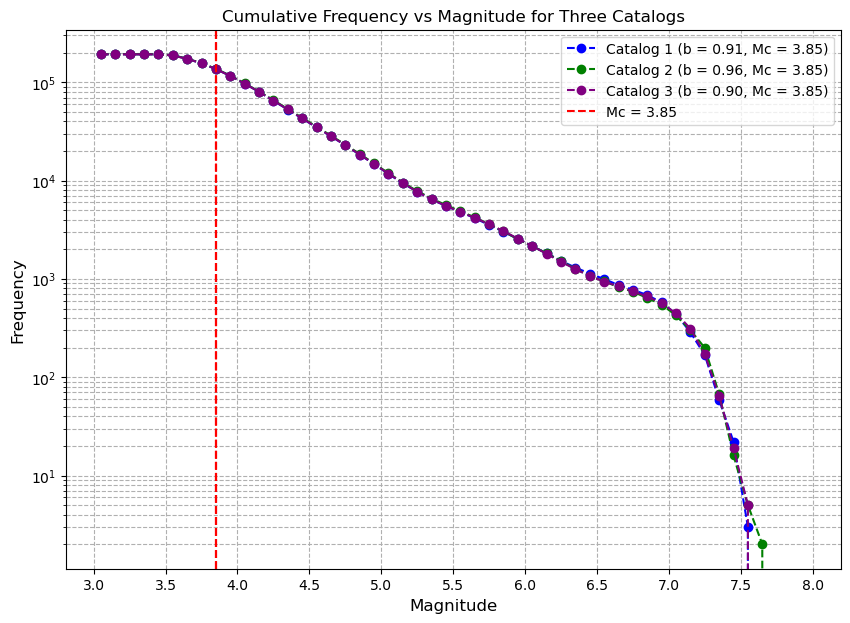

In [50]:
plt.figure(figsize=(10, 7))

# Only show Mc line label for the first catalog
process_catalog3(magnitudes, color='blue', label='Catalog 1', bin_width=0.1)
process_catalog3(magnitudes2, color='green', label='Catalog 2', bin_width=0.1)
process_catalog3(magnitudes3, color='purple', label='Catalog 3', bin_width=0.1, show_mc_legend=True)

plt.xlabel("Magnitude", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.xticks(np.arange(3, 8.5, 0.5))  
plt.yscale("log")
plt.grid(True, which="both", linestyle="--")
plt.title("Cumulative Frequency vs Magnitude for Three Catalogs")
plt.legend(loc="best")
plt.show()

## #..................................................... for par_Dc 

In [8]:
####function to read the mat files####
def load_cat_mat(file_path):
    """
    Loads an earthquake catalog from a .mat file and returns it as a pandas DataFrame.

    Parameters:
        file_path (str): The path to the .mat file.

    Returns:
        df (pd.DataFrame): DataFrame containing the catalog with labeled columns.
    """
    # Load the .mat file
    mat_data = mat.loadmat(file_path)
    
    # Extract catalog data and labels
    catalog = mat_data['TheCatalog']
    labels = [entry[0][0] for entry in mat_data['whatiswhat']]
    
    # Print basic info
#     print(f"Catalog shape: {catalog.shape}")  # (11, N) shape expected
#     print(f"Labels: {labels}")
    
    # Convert to DataFrame and transpose to get events as rows
    df = pd.DataFrame(catalog.T, columns=labels)
#     print(df.head())
    cat = df['magnitude'].values
    
    
    
    return cat

In [6]:
cat_mag1= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/par_Dc1_mat.mat")
cat_mag2= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/par_Dc2_mat.mat")
cat_mag3= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/par_Dc3_mat.mat")
cat_mag4= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/par_Dc4_mat.mat")

Dc = 0.005 m: Estimated b-value = 0.91, Mc = 3.35
Dc = 0.005 m Gutenberg–Richter relation:
  log10(N) = 8.75 - 0.91 * M
Dc = 0.015 m: Estimated b-value = 0.89, Mc = 3.55
Dc = 0.015 m Gutenberg–Richter relation:
  log10(N) = 8.61 - 0.89 * M
Dc = 0.025 m: Estimated b-value = 0.85, Mc = 3.45
Dc = 0.025 m Gutenberg–Richter relation:
  log10(N) = 8.36 - 0.85 * M
Dc = 0.035 m: Estimated b-value = 0.84, Mc = 3.45
Dc = 0.035 m Gutenberg–Richter relation:
  log10(N) = 8.24 - 0.84 * M


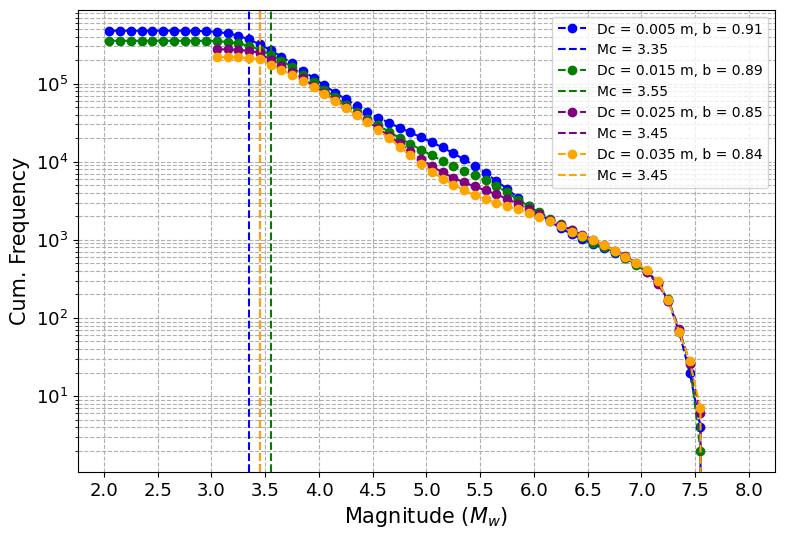

In [13]:
plt.figure(figsize=(9, 6))

# Process each catalog with distinct colors
process_catalog2(cat_mag4, color='blue', label='Dc = 0.005 m', bin_width=0.1)
process_catalog2(cat_mag3, color='green', label='Dc = 0.015 m', bin_width=0.1)
process_catalog2(cat_mag2, color='purple', label='Dc = 0.025 m', bin_width=0.1)
process_catalog2(cat_mag1, color='orange', label='Dc = 0.035 m', bin_width=0.1)


plt.xlabel("Magnitude ($M_{w}$)", fontsize=15)
plt.ylabel("Cum. Frequency", fontsize=15)
plt.xticks(np.arange(2, 8.5, 0.5), fontsize=13) 
plt.yticks(fontsize=13)
plt.yscale("log")
plt.grid(True, which="both", linestyle="--")
# plt.title("Cumulative Frequency vs Magnitude for Three Catalogs")
plt.legend(loc="best")
plt.show()

Dc corres. to $7 \times 10^{-5}$: Estimated b-value = 0.83, Mc = 3.40
Dc corres. to $5 \times 10^{-5}$: Estimated b-value = 0.85, Mc = 3.72
Dc corres. to $3 \times 10^{-5}$: Estimated b-value = 0.84, Mc = 3.32
Dc corres. to $1 \times 10^{-5}$: Estimated b-value = 0.82, Mc = 3.35


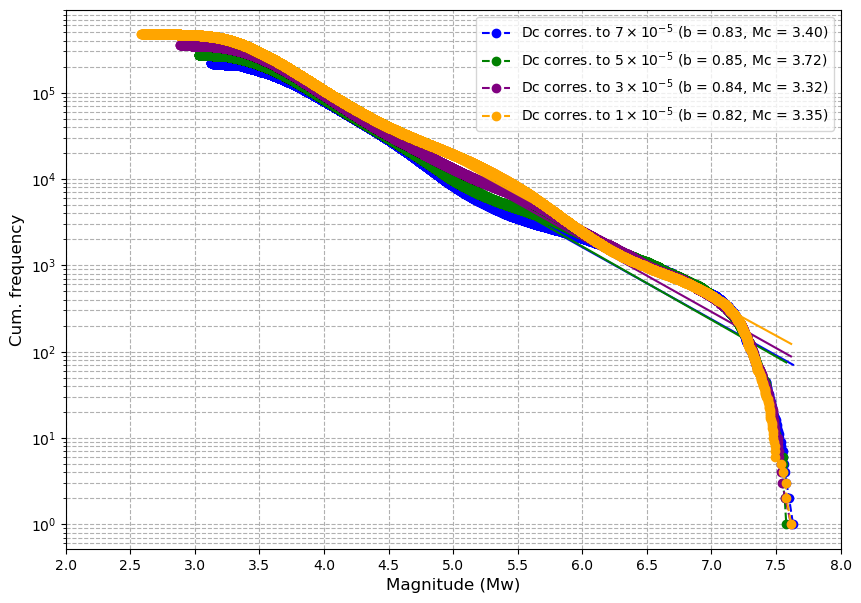

In [158]:
######## with no bining ###################
plt.figure(figsize=(10, 7))

# Process each catalog with distinct colors
process_catalog(cat_mag1, color='blue', label='Dc corres. to $7 \\times 10^{-5}$')
process_catalog(cat_mag2, color='green', label='Dc corres. to $5 \\times 10^{-5}$')
process_catalog(cat_mag3, color='purple', label='Dc corres. to $3 \\times 10^{-5}$')
process_catalog(cat_mag4, color='orange', label='Dc corres. to $1 \\times 10^{-5}$')


plt.xlabel("Magnitude (Mw)", fontsize=12)
plt.ylabel("Cum. frequency", fontsize=12)
plt.xticks(np.arange(2, 8.5, 0.5))  
plt.yscale("log")
plt.grid(True, which="both", linestyle="--")
# plt.title("Cumulative Frequency vs Magnitude for Three Catalogs")
plt.legend(loc="best")
plt.show()

In [9]:
#### without the Mc and with limits ########

def process_catalog4(magnitudes, color, label, bin_width=0.1, mag_min=None, mag_max=None):
    # Bin the magnitudes (e.g., round to nearest 0.1)
    binned_mags = np.round(magnitudes / bin_width) * bin_width

    # filter raw data before binning
    if mag_min is not None:
        binned_mags = binned_mags[binned_mags >= mag_min]
    if mag_max is not None:
        binned_mags = binned_mags[binned_mags <= mag_max]

    # Define bin edges based on filtered data
    min_mag = np.floor(np.min(binned_mags))
    max_mag = np.ceil(np.max(binned_mags))
    bins = np.arange(min_mag, max_mag + bin_width, bin_width)

    # Compute histogram and cumulative frequency
    incremental_freq, edges = np.histogram(binned_mags, bins=bins)
    bin_centers = edges[:-1] + bin_width / 2
    cumulative_freq = np.cumsum(incremental_freq[::-1])[::-1]  # N(M ≥ m)

    # Filter out zeros before taking log10
    valid = cumulative_freq > 0
    mags_fit = bin_centers[valid]
    log_cumulative_freq = np.log10(cumulative_freq[valid])

    # Linear regression on log10(N) vs M
    slope, intercept, r_value, p_value, std_err = stats.linregress(mags_fit, log_cumulative_freq)
    b_value_ls = -slope

    # Cumulative FMD
    plt.plot(bin_centers, cumulative_freq, linestyle="--", marker="o", color=color,
             label=f"{label}, b = {b_value_ls:.2f}")

    print(f"{label}: Estimated b-value = {b_value_ls:.2f}, range = [{min_mag}, {max_mag}]")


Dc corres. to $7 \times 10^{-5}$: Estimated b-value = 0.93, range = [6.0, 8.0]


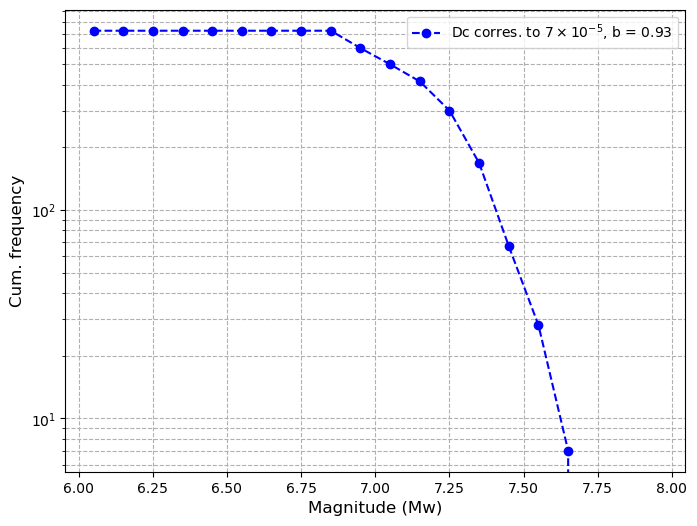

In [8]:
plt.figure(figsize=(8, 6))

# Process each catalog with distinct colors
process_catalog4(cat_mag1, color='blue', label='Dc corres. to $7 \\times 10^{-5}$', bin_width=0.1, mag_min=6.8, mag_max=7.7)

plt.xlabel("Magnitude (Mw)", fontsize=12)
plt.ylabel("Cum. frequency", fontsize=12)
# plt.xticks(np.arange(2, 8.5, 0.5))  
plt.yscale("log")
plt.grid(True, which="both", linestyle="--")
# plt.title("Cumulative Frequency vs Magnitude for Three Catalogs")
plt.legend(loc="best")
plt.show()

In [13]:
import math

In [60]:
def fmd(mag, mbin):
    minmag = math.floor(min(mag/mbin)) * mbin # Lowest magnitude bin
    maxmag = math.ceil(max(mag/mbin)) * mbin # Highest magnitude bin
    mi = np.arange(minmag, maxmag + mbin, mbin) # Sequence of magnitude bins
    nbm = len(mi) # No. of magnitude bins
    cumnbmag = np.zeros(nbm) # Pre-allocate array for cumulative no. of events in mag bin and higher

    # Get cumulative no. of events in mag bin and higher
    for i in range(nbm):
        cumnbmag[i] = np.where(mag > mi[i] - mbin/2)[0].shape[0]
        
    # Get no. of events in each mag bin:
    nbmag = abs(np.diff(np.append(cumnbmag, 0)))
    
    return mi, nbmag, cumnbmag 

In [67]:
cat_mi, cat_nbmag, cat_cumnbmag = fmd(magnitudes3, mbin = 0.1)

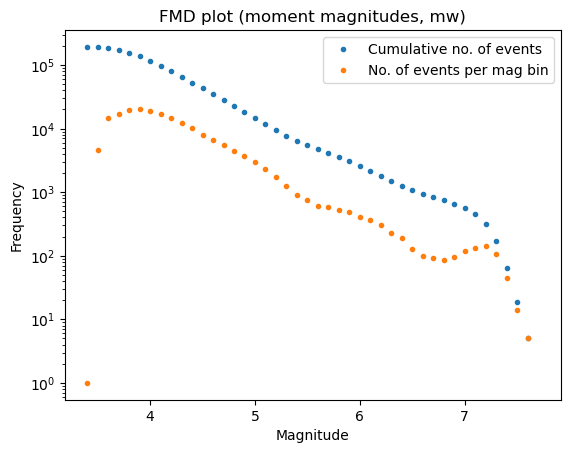

In [68]:
plt.plot(cat_mi, cat_cumnbmag, '.', label="Cumulative no. of events")
plt.plot(cat_mi, cat_nbmag, '.', label="No. of events per mag bin")
plt.yscale('log')
plt.xlabel('Magnitude')
plt.ylabel('Frequency')
plt.title('FMD plot (moment magnitudes, mw)')
plt.legend(loc="upper right")
plt.show()

# .........................................RA vs Mw.................................................                     

In [10]:
def RAvsM(magnitudes, rupture_areas, color, label):
    # Plot data points
    plt.scatter(magnitudes, rupture_areas, color=color, alpha=0.6, edgecolor='k', label=f'{label}', zorder=2)

    # Fit line (log10 of rupture area vs magnitude)
    slope, intercept = np.polyfit(magnitudes, np.log10(rupture_areas), 1)

    # Generate the fitted line from the minimum x-value (3.0) to the max magnitude
    
    x_fit = np.linspace(min(magnitudes), max(magnitudes), 100)
    y_fit = 10**(intercept + slope * x_fit)
    plt.plot(x_fit, y_fit, color=color, linestyle='--', label=f'{label}', zorder=6)

In [11]:
######with empirical lines#########
def RAvsM2(magnitudes, rupture_areas, color, label):
    # Plot data points
    plt.scatter(magnitudes, rupture_areas, color=color, alpha=0.6, edgecolor='k', label=f'{label}', zorder=2)

    # Fit line: log10(RA) = intercept + slope * M
    slope, intercept = np.polyfit(magnitudes, np.log10(rupture_areas), 1)

    # Print fitted equation
    print(f"{label} fitted relation: log10(A) = {intercept:.2f} + {slope:.2f} * M")

    # Generate fit line
#     x_fit = np.linspace(min(magnitudes), max(magnitudes), 100)
    y_fit = 10**(intercept + slope * magnitudes)
    plt.plot(magnitudes, y_fit, color=color, linestyle='--', label=f'{label} fit', zorder=6)

    # Plot Wells & Coppersmith (1994) empirical lines
#     wc_all = 10**(-3.49 + 0.91 * magnitudes)
#     wc_ss  = 10**(-3.42 + 0.90 * magnitudes)

    Thinbjm_2017 = 10**(-3.49 + 0.90 * magnitudes)
    
#     log10_RA_empirical_all = -3.49 + 0.91 * magnitudes
#     log10_RA_empirical_ss = -3.42 + 0.90 * magnitudes
    log10_RA_empirical_Thinbjm = -3.49 + 0.90 * magnitudes
#     residuals_all = np.log10(rupture_areas) - log10_RA_empirical_all
#     residuals_ss = np.log10(rupture_areas) - log10_RA_empirical_ss
    residuals_Thinbjm = np.log10(rupture_areas) - log10_RA_empirical_Thinbjm

# Print summary stats
#     print(f"\nResiduals vs Wells & Coppersmith (1994):")
#     print(f"All fault types: mean = {np.mean(residuals_all):.2f}, std = {np.std(residuals_all):.2f}")
#     print(f"Strike-slip    : mean = {np.mean(residuals_ss):.2f}, std = {np.std(residuals_ss):.2f}")
#     print("Individual residuals (log10(RA_obs) - log10(RA_pred_all)):")

    print(f"\nResiduals vs Thingbaijam et al. (2017):")
    print(f"Strike-slip    : mean = {np.mean(residuals_Thinbjm):.2f}, std = {np.std(residuals_Thinbjm):.2f}")
    
    
    

#     plt.plot(magnitudes, wc_all, 'k-', label='W&C (1994) - All faults', zorder=3)
#     plt.plot(magnitudes, wc_ss, 'k:', label='W&C (1994) - Strike-slip', zorder=4)

    # Axis labels
    plt.xlabel("Magnitude", fontsize=12)
    plt.ylabel("Rupture Area (km²)", fontsize=12)
    plt.yscale("log")
    plt.grid(True, which="both", linestyle="--")
    plt.legend()


In [12]:
###### for subplots ######

def RAvsM3(magnitudes, rupture_areas, color, label, ax):
    # Plot data points
    ax.scatter(magnitudes, rupture_areas, color=color, alpha=0.6, edgecolor='k', label=f'{label}', zorder=2)

    # Fit line: log10(RA) = intercept + slope * M
    slope, intercept = np.polyfit(magnitudes, np.log10(rupture_areas), 1)
    print(f"{label} fitted relation: log10(RA) = {intercept:.2f} + {slope:.2f} * M")

    # Fitted line
    y_fit = 10**(intercept + slope * magnitudes)
    ax.plot(magnitudes, y_fit, color=color, linestyle='--', label=f'{label} fit', zorder=6)

    # Residuals vs Thingbaijam (2017)
    log10_RA_empirical = -3.49 + 0.90 * magnitudes
    residuals = np.log10(rupture_areas) - log10_RA_empirical
    print(f"\nResiduals vs Thingbaijam et al. (2017) for {label}:")
    print(f"Mean = {np.mean(residuals):.2f}, Std = {np.std(residuals):.2f}")

    # Axis formatting (optional, leave to main script if repeating)
    ax.set_yscale("log")
    ax.grid(True, which="both", linestyle="--")
    ax.set_ylabel("Rupture Area (km²)", fontsize=11)
    ax.legend(loc='upper left', fontsize=9)


In [13]:
#########with magnitude filter################
def RAvsM_fltrd(magnitudes, rupture_areas, color, label):
    
    mask = magnitudes >= 5.4
    magnitudes = magnitudes[mask]
    rupture_areas = rupture_areas[mask]
    
    
    plt.scatter(magnitudes, rupture_areas, color=color, alpha=0.6, edgecolor='k', label=f'{label}', zorder=2)

    # Fit line: log10(RA) = intercept + slope * M
    slope, intercept = np.polyfit(magnitudes, np.log10(rupture_areas), 1)

    # Print fitted equation
    print(f"{label} fitted relation: log10(A) = {intercept:.2f} + {slope:.2f} * M")

    # Generate fit line
#     x_fit = np.linspace(min(magnitudes), max(magnitudes), 100)
    y_fit = 10**(intercept + slope * magnitudes)
    plt.plot(magnitudes, y_fit, color=color, linestyle='--', label=f'{label} fit', zorder=6)

    # Plot Wells & Coppersmith (1994) empirical lines
#     wc_all = 10**(-3.49 + 0.91 * magnitudes)
#     wc_ss  = 10**(-3.42 + 0.90 * magnitudes)

    Thinbjm_2017 = 10**(-3.49 + 0.90 * magnitudes)
    
#     log10_RA_empirical_all = -3.49 + 0.91 * magnitudes
#     log10_RA_empirical_ss = -3.42 + 0.90 * magnitudes
    log10_RA_empirical_Thinbjm = -3.49 + 0.90 * magnitudes
#     residuals_all = np.log10(rupture_areas) - log10_RA_empirical_all
#     residuals_ss = np.log10(rupture_areas) - log10_RA_empirical_ss
    residuals_Thinbjm = np.log10(rupture_areas) - log10_RA_empirical_Thinbjm

# Print summary stats
#     print(f"\nResiduals vs Wells & Coppersmith (1994):")
#     print(f"All fault types: mean = {np.mean(residuals_all):.2f}, std = {np.std(residuals_all):.2f}")
#     print(f"Strike-slip    : mean = {np.mean(residuals_ss):.2f}, std = {np.std(residuals_ss):.2f}")
#     print("Individual residuals (log10(RA_obs) - log10(RA_pred_all)):")

    print(f"\nResiduals vs Thingbaijam et al. (2017):")
    print(f"Strike-slip    : mean = {np.mean(residuals_Thinbjm):.2f}, std = {np.std(residuals_Thinbjm):.2f}")
    
    
    

#     plt.plot(magnitudes, wc_all, 'k-', label='W&C (1994) - All faults', zorder=3)
#     plt.plot(magnitudes, wc_ss, 'k:', label='W&C (1994) - Strike-slip', zorder=4)

    # Axis labels
    plt.xlabel("Magnitude", fontsize=12)
    plt.ylabel("Rupture Area (km²)", fontsize=12)
    plt.yscale("log")
    plt.grid(True, which="both", linestyle="--")
    plt.legend()


## ######.........................................................***for par_Dc***

In [14]:
def load_cat_mat_RA(file_path):
    """
    Loads an earthquake catalog from a .mat file and returns it as a pandas DataFrame.

    Parameters:
        file_path (str): The path to the .mat file.

    Returns:
        df (pd.DataFrame): DataFrame containing the catalog with labeled columns.
    """
    # Load the .mat file
    mat_data = mat.loadmat(file_path)
    
    # Extract catalog data and labels
    catalog = mat_data['TheCatalog']
    labels = [entry[0][0] for entry in mat_data['whatiswhat']]
    
    # Print basic info
#     print(f"Catalog shape: {catalog.shape}")  # (11, N) shape expected
#     print(f"Labels: {labels}")
    
    # Convert to DataFrame and transpose to get events as rows
    df = pd.DataFrame(catalog.T, columns=labels)
#     print(df.head())
    cat = df['rupture area'].values
    
    
    
    return cat

In [14]:
cat_RA1= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/par_Dc1_mat.mat")
cat_RA2= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/par_Dc2_mat.mat")
cat_RA3= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/par_Dc3_mat.mat")
cat_RA4= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/par_Dc4_mat.mat")

Dc = 0.005 m fitted relation: log10(A) = -4.65 + 1.20 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.04, std = 0.25
Dc = 0.015 m fitted relation: log10(A) = -4.81 + 1.20 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.17, std = 0.21
Dc = 0.025 m fitted relation: log10(A) = -4.99 + 1.22 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.27, std = 0.20
Dc = 0.035 m fitted relation: log10(A) = -5.13 + 1.23 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.34, std = 0.20


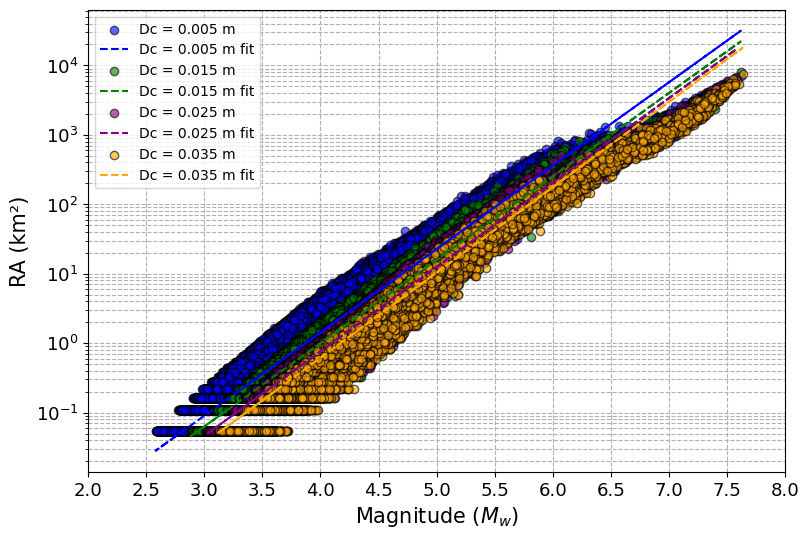

In [25]:
plt.figure(figsize=(9, 6))

RA1_2=RAvsM2(cat_mag4, cat_RA4, color='blue', label= 'Dc = 0.005 m')
RA2_2=RAvsM2(cat_mag3, cat_RA3, color='green', label='Dc = 0.015 m')
RA3_2=RAvsM2(cat_mag2, cat_RA2, color='purple', label='Dc = 0.025 m')
RA4_2=RAvsM2(cat_mag1, cat_RA1, color='orange', label='Dc = 0.035 m')


# mags_sorted = np.sort(cat_mag4)
# RA_thingbaijam = 10**(-3.49 + 0.90 * mags_sorted)
# plt.plot(mags_sorted, RA_thingbaijam, color='red', linestyle='--', 
#          label='Thingbaijam et al. (2017)-SS\n$\\log_{10}(RA) = -3.49 + 0.90M$')


# RA_upper = 10**((-3.49 + 0.90 * mags_sorted) + 0.3)  # +1 std
# RA_lower = 10**((-3.49 + 0.90 * mags_sorted) - 0.3)  # -1 std
# plt.fill_between(mags_sorted, RA_lower, RA_upper, color='red', alpha=0.2, label='±1σ')


# Customize the plot
plt.xlabel('Magnitude ($M_{w}$)', fontsize=15)
plt.ylabel('RA (km²)', fontsize=15)
plt.xticks(np.arange(2, 8.5, 0.5), fontsize=13) 
plt.yticks(fontsize=13)
plt.yscale('log')
plt.grid(True, which='both', linestyle='--')  # Grid behind data
# plt.title('RA vs Magnitude')
plt.legend(loc='best')
plt.show()

Dc = 0.005 m fitted relation: log10(A) = -2.16 + 0.77 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.55, std = 0.17
Dc = 0.015 m fitted relation: log10(A) = -3.09 + 0.89 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.37, std = 0.14
Dc = 0.025 m fitted relation: log10(A) = -3.54 + 0.95 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.28, std = 0.14
Dc = 0.035 m fitted relation: log10(A) = -3.82 + 0.99 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.23, std = 0.13


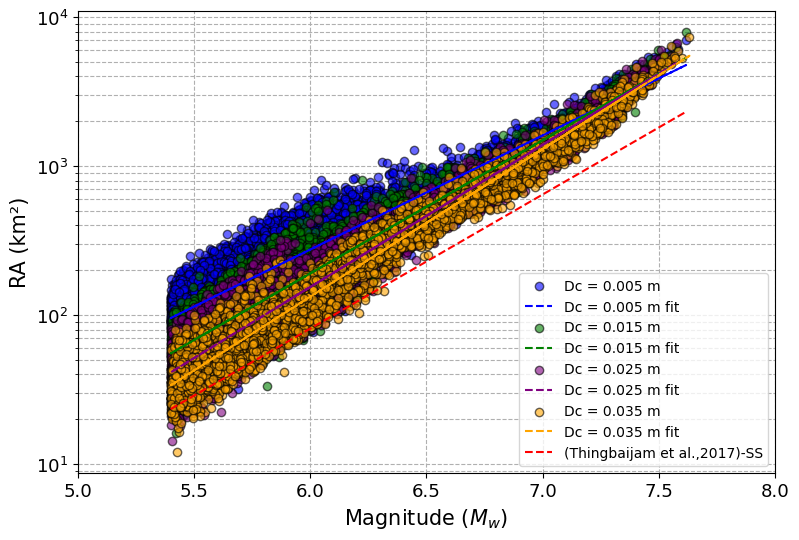

In [27]:
plt.figure(figsize=(9, 6))

RA1_2=RAvsM_fltrd(cat_mag4, cat_RA4, color='blue', label= 'Dc = 0.005 m')
RA2_2=RAvsM_fltrd(cat_mag3, cat_RA3, color='green', label='Dc = 0.015 m')
RA3_2=RAvsM_fltrd(cat_mag2, cat_RA2, color='purple', label='Dc = 0.025 m')
RA4_2=RAvsM_fltrd(cat_mag1, cat_RA1, color='orange', label='Dc = 0.035 m')




mask = cat_mag4 >= 5.4
filtered_mag_Dc4 = cat_mag4[mask]
mags_sorted = np.sort(filtered_mag_Dc4)

RA_thingbaijam = 10**(-3.49 + 0.90 * mags_sorted)
plt.plot(mags_sorted, RA_thingbaijam, color='red', linestyle='--', 
         label='(Thingbaijam et al.,2017)-SS')

#label='(Thingbaijam et al.,2017)-SS\n$\\log_{10}(RA) = -3.49 + 0.90M$')
# RA_upper = 10**((-3.49 + 0.90 * mags_sorted) + 0.3)  # +1 std
# RA_lower = 10**((-3.49 + 0.90 * mags_sorted) - 0.3)  # -1 std
# plt.fill_between(mags_sorted, RA_lower, RA_upper, color='red', alpha=0.2, label='±1σ')


# Customize the plot
plt.xlabel('Magnitude ($M_{w}$)', fontsize=15)
plt.ylabel('RA (km²)', fontsize=15)
plt.xticks(np.arange(5, 8.5, 0.5), fontsize=13) 
plt.yticks(fontsize=13)
plt.yscale('log')

plt.grid(True, which='both', linestyle='--')  # Grid behind data
# plt.title('RA vs Magnitude')
plt.legend(loc='best')
plt.show()

Dc = 0.005 m fitted relation: log10(RA) = -4.65 + 1.20 * M

Residuals vs Thingbaijam et al. (2017) for Dc = 0.005 m:
Mean = -0.04, Std = 0.25
Dc = 0.015 m fitted relation: log10(RA) = -4.81 + 1.20 * M

Residuals vs Thingbaijam et al. (2017) for Dc = 0.015 m:
Mean = -0.17, Std = 0.21
Dc = 0.025 m fitted relation: log10(RA) = -4.99 + 1.22 * M

Residuals vs Thingbaijam et al. (2017) for Dc = 0.025 m:
Mean = -0.27, Std = 0.20
Dc = 0.035 m fitted relation: log10(RA) = -5.13 + 1.23 * M

Residuals vs Thingbaijam et al. (2017) for Dc = 0.035 m:
Mean = -0.34, Std = 0.20


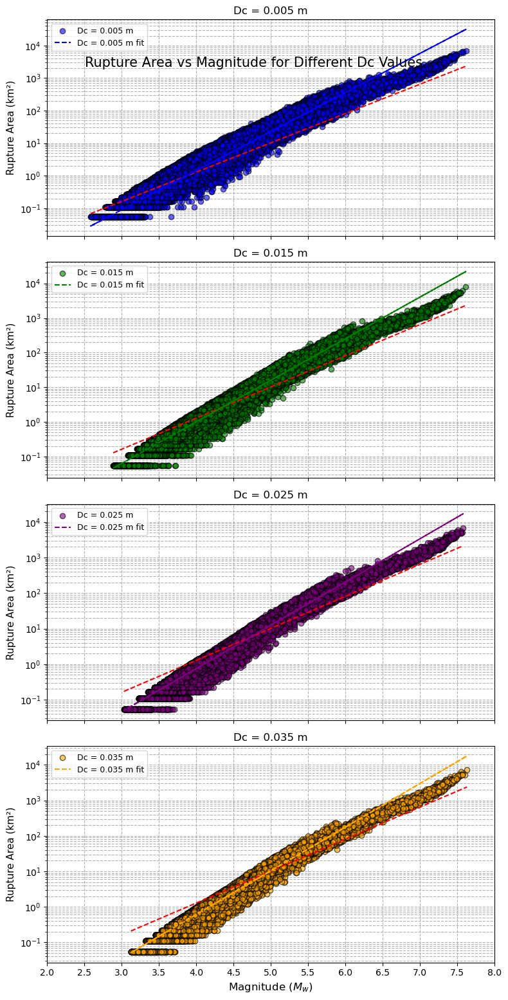

In [59]:
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(8, 16), sharex=True)

catalogs = [
    (cat_mag4, cat_RA4, 'blue',  'Dc = 0.005 m'),
    (cat_mag3, cat_RA3, 'green', 'Dc = 0.015 m'),
    (cat_mag2, cat_RA2, 'purple','Dc = 0.025 m'),
    (cat_mag1, cat_RA1, 'orange','Dc = 0.035 m')
]

for ax, (mags, RAs, color, label) in zip(axes, catalogs):
    RAvsM3(mags, RAs, color=color, label=label, ax=ax)

    mags_sorted = np.sort(mags)
    RA_thingbaijam = 10**(-3.49 + 0.90 * mags_sorted)
    ax.plot(mags_sorted, RA_thingbaijam, color='red', linestyle='--', 
            label='Thingbaijam et al. (2017) – SS\n$\\log_{10}(RA) = -3.49 + 0.90M$')

    ax.set_title(label)

axes[-1].set_xlabel('Magnitude ($M_{w}$)', fontsize=12)
plt.xticks(np.arange(2, 8.5, 0.5))
plt.suptitle('Rupture Area vs Magnitude for Different Dc Values', fontsize=15, y=0.92)
plt.tight_layout()
plt.show()


# #.............................hypocenter depth histograms..............................................

In [15]:
def load_cat_mat_hypZ(file_path):
    """
    Loads an earthquake catalog from a .mat file and returns it as a pandas DataFrame.

    Parameters:
        file_path (str): The path to the .mat file.

    Returns:
        df (pd.DataFrame): DataFrame containing the catalog with labeled columns.
    """
    # Load the .mat file
    mat_data = mat.loadmat(file_path)
    
    # Extract catalog data and labels
    catalog = mat_data['TheCatalog']
    labels = [entry[0][0] for entry in mat_data['whatiswhat']]
    
    # Print basic info
#     print(f"Catalog shape: {catalog.shape}")  # (11, N) shape expected
#     print(f"Labels: {labels}")
    
    # Convert to DataFrame and transpose to get events as rows
    df = pd.DataFrame(catalog.T, columns=labels)
#     print(df.head())
    cat = df['hypocenter_Z'].values
    
    
    
    return cat

In [16]:
cat_hypZ1= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/par_Dc1_mat.mat")
cat_hypZ2= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/par_Dc2_mat.mat")
cat_hypZ3= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/par_Dc3_mat.mat")
cat_hypZ4= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/par_Dc4_mat.mat")

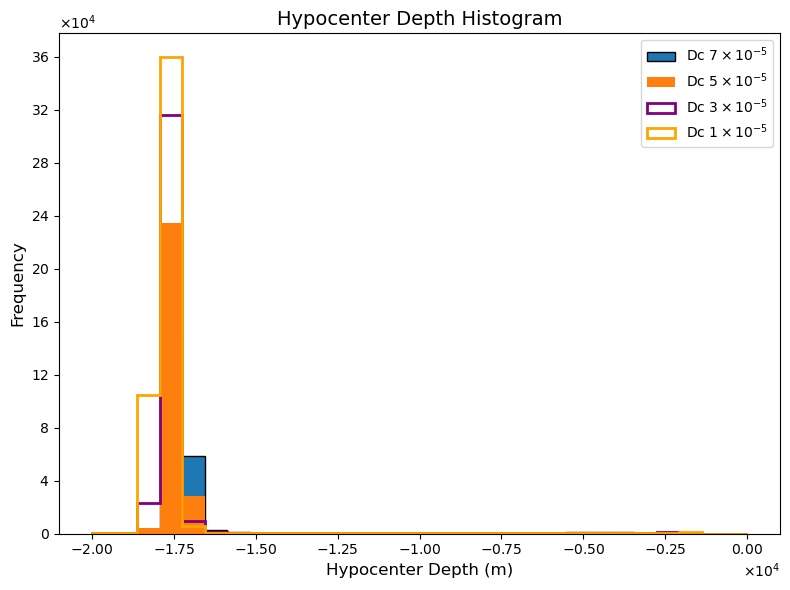

In [62]:

from matplotlib.ticker import MultipleLocator, ScalarFormatter
#############
bin_min = -20000
bin_max =0
bin_count = 30
bins = np.linspace(bin_min, bin_max, bin_count)
#############

plt.figure(figsize=(8, 6))

plt.hist(cat_hypZ1, bins=bins, edgecolor='black', label='Dc $7 \\times 10^{-5}$')

plt.hist(cat_hypZ2, bins=bins, linewidth=2, 
         label='Dc $5 \\times 10^{-5}$')

plt.hist(cat_hypZ3, bins=bins, histtype='step', linewidth=2, 
         color='purple', label='Dc $3 \\times 10^{-5}$')

plt.hist(cat_hypZ4, bins=bins, histtype='step', linewidth=2, 
         color='orange', label='Dc $1 \\times 10^{-5}$')



plt.xlabel('Hypocenter Depth (m)', fontsize=12)

formatter = ScalarFormatter(useMathText=True)
formatter.set_powerlimits((4, 4))  # forces 10^4 scale

plt.gca().xaxis.set_major_formatter(formatter)
plt.gca().yaxis.set_major_formatter(formatter)

plt.ticklabel_format(style='sci', axis='both', scilimits=(4, 4))
# plt.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
plt.ylabel('Frequency', fontsize=12)
plt.title('Hypocenter Depth Histogram', fontsize=14)
# plt.grid(True, which='both', linestyle='--')
# plt.ylim(0, 400000)
plt.gca().yaxis.set_major_locator(MultipleLocator(40000))
plt.legend(loc='best')
plt.tight_layout()
plt.show()

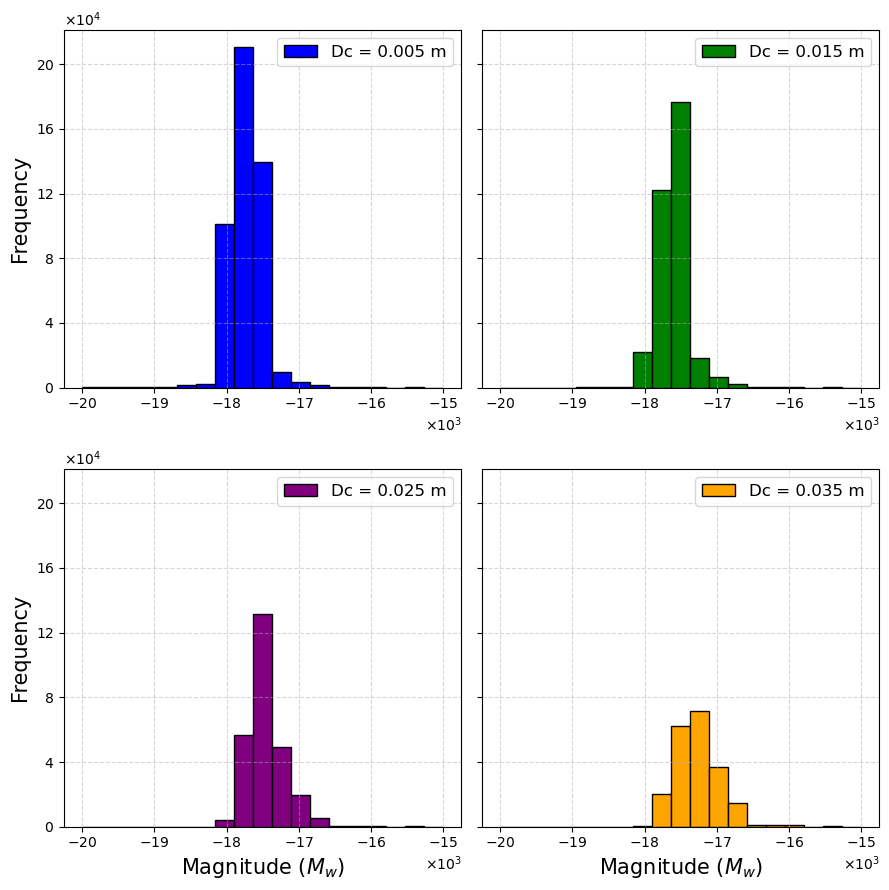

In [34]:
##########in subplots##########
from matplotlib.ticker import MultipleLocator, ScalarFormatter

# Histogram bin settings
bin_min = -20000
bin_max = -15000
bin_count = 20
bins = np.linspace(bin_min, bin_max, bin_count)

# Catalogs and labels/colors
catalogs1 = [
    (cat_hypZ4, 'Dc = 0.005 m', 'blue'),
    (cat_hypZ3, 'Dc = 0.015 m', 'green'),
    (cat_hypZ2, 'Dc = 0.025 m', 'purple'),
    (cat_hypZ1, 'Dc = 0.035 m', 'orange')
]

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(9, 9), sharey=True)
axes = axes.flatten()
# Formatter for scientific notation
x_formatter = ScalarFormatter(useMathText=True)
x_formatter.set_powerlimits((3, 3))  # x10^3

y_formatter = ScalarFormatter(useMathText=True)
y_formatter.set_powerlimits((4, 4))  # x10^4

for ax, (data, label, color) in zip(axes, catalogs1):
    
    ax.hist(data, bins=bins, edgecolor='black', color=color, label=label)

    # Axis formatting
#     ax.set_xlabel('Hypocenter Depth (m)', fontsize=15)
#     ax.set_title(label, fontsize=12)
#     ax.xaxis.set_major_formatter(formatter)
#     ax.yaxis.set_major_formatter(formatter)
    ax.yaxis.set_major_locator(MultipleLocator(40000))
    
#     ax.ticklabel_format(style='sci', axis='x', scilimits=(3, 3))
#     ax.ticklabel_format(style='sci', axis='both', scilimits=(3, 4))
    ax.xaxis.set_major_formatter(x_formatter)
    ax.yaxis.set_major_formatter(y_formatter)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(loc='upper right', fontsize=12)

# Shared y-axis label
axes[0].set_ylabel('Frequency', fontsize=15)
axes[-1].set_xlabel('Magnitude ($M_{w}$)', fontsize=15)
axes[-2].set_xlabel('Magnitude ($M_{w}$)', fontsize=15)


axes[-2].set_ylabel('Frequency', fontsize=15)

# Layout and title
# plt.suptitle('Hypocenter Depth Histograms by Dc Value', fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

# #.............................mean stress drop histograms..............................................

In [16]:
def load_cat_mat_mDtau(file_path):
    """
    Loads an earthquake catalog from a .mat file and returns it as a pandas DataFrame.

    Parameters:
        file_path (str): The path to the .mat file.

    Returns:
        df (pd.DataFrame): DataFrame containing the catalog with labeled columns.
    """
    # Load the .mat file
    mat_data = mat.loadmat(file_path)
    
    # Extract catalog data and labels
    catalog = mat_data['TheCatalog']
    labels = [entry[0][0] for entry in mat_data['whatiswhat']]
    
    # Print basic info
#     print(f"Catalog shape: {catalog.shape}")  # (11, N) shape expected
#     print(f"Labels: {labels}")
    
    # Convert to DataFrame and transpose to get events as rows
    df = pd.DataFrame(catalog.T, columns=labels)
#     print(df.head())
    cat = df['mean stress drop'].values
    
    
    
    return cat

In [18]:
cat_mDtau1= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/par_Dc1_mat.mat")
cat_mDtau2= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/par_Dc2_mat.mat")
cat_mDtau3= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/par_Dc3_mat.mat")
cat_mDtau4= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/par_Dc4_mat.mat")

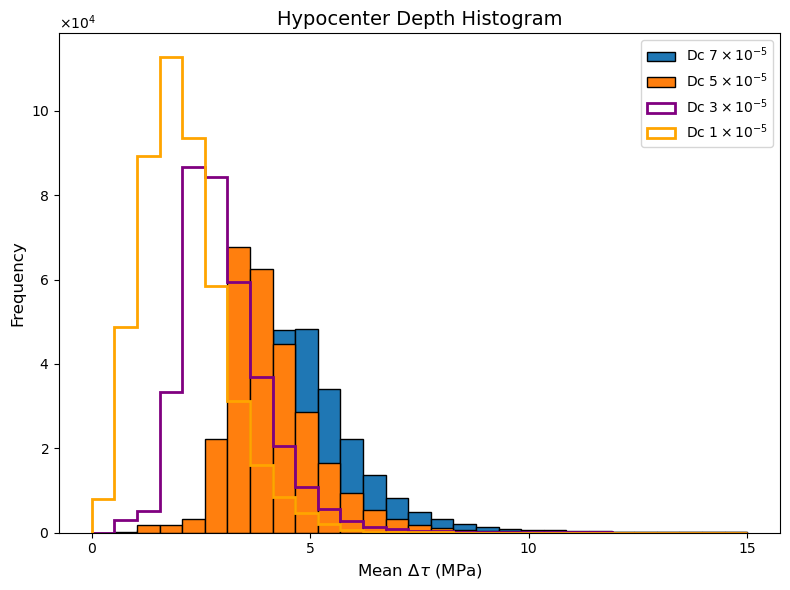

In [30]:
bin_min = 0
bin_max =15
bin_count = 30
bins = np.linspace(bin_min, bin_max, bin_count)
#############

plt.figure(figsize=(8, 6))

plt.hist(cat_mDtau1, bins=bins, edgecolor='black', label='Dc $7 \\times 10^{-5}$')

plt.hist(cat_mDtau2, bins=bins, edgecolor='black', label='Dc $5 \\times 10^{-5}$')

plt.hist(cat_mDtau3, bins=bins, histtype='step', linewidth=2, 
         color='purple', label='Dc $3 \\times 10^{-5}$')

plt.hist(cat_mDtau4, bins=bins, histtype='step', linewidth=2, 
         color='orange', label='Dc $1 \\times 10^{-5}$')



plt.xlabel('Mean $\Delta\\tau$ (MPa)', fontsize=12)

formatter = ScalarFormatter(useMathText=True)
formatter.set_powerlimits((4, 4))  # forces 10^4 scale

# plt.gca().xaxis.set_major_formatter(formatter)
plt.gca().yaxis.set_major_formatter(formatter)

# plt.ticklabel_format(style='sci', axis='y', scilimits=(4, 4))
# plt.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
plt.ylabel('Frequency', fontsize=12)
plt.title('Hypocenter Depth Histogram', fontsize=14)
# plt.grid(True, which='both', linestyle='--')
# plt.ylim(0, 400000)
plt.gca().xaxis.set_major_locator(MultipleLocator(5))
plt.legend(loc='best')
plt.tight_layout()
plt.show()

Dc = 0.005 m:
  Median = 1.97 MPa
  Mode   = 1.81 MPa
Dc = 0.015 m:
  Median = 2.87 MPa
  Mode   = 2.33 MPa
Dc = 0.025 m:
  Median = 3.94 MPa
  Mode   = 3.36 MPa
Dc = 0.035 m:
  Median = 5.01 MPa
  Mode   = 4.91 MPa


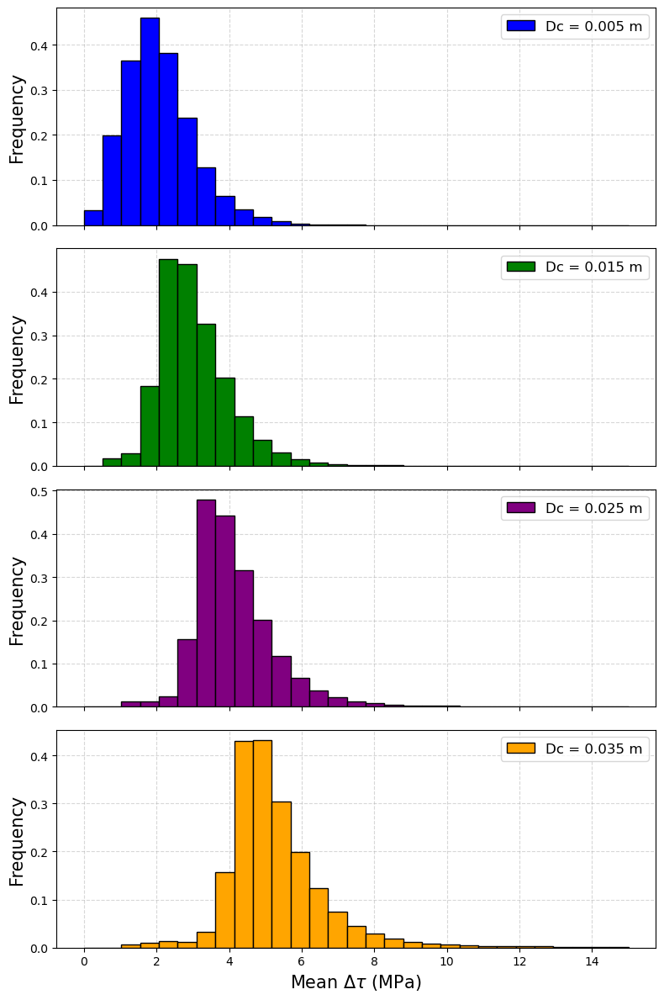

In [45]:
#######subplots of the stress drop#########
from matplotlib.ticker import MultipleLocator, ScalarFormatter

#################
bin_min = 0
bin_max = 15
bin_count = 30
bins = np.linspace(bin_min, bin_max, bin_count)
###################
# Catalogs: (data, label, color)
catalogs2 = [
    (cat_mDtau4, 'Dc = 0.005 m', 'blue'),
    (cat_mDtau3, 'Dc = 0.015 m', 'green'),
    (cat_mDtau2, 'Dc = 0.025 m', 'purple'),
    (cat_mDtau1, 'Dc = 0.035 m', 'orange')
]

# Create 4-row, 1-column subplots
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(8, 12), sharex=True)

# Formatter for scientific y-axis
# y_formatter = ScalarFormatter(useMathText=True)
# y_formatter.set_powerlimits((4, 4))

for ax, (data, label, color) in zip(axes, catalogs2):
    ax.hist(data, bins=bins, edgecolor='black', color=color, label=label, density=True)
    
    median = np.median(data)

    # Calculate mode based on histogram peak bin
    counts, edges = np.histogram(data, bins=bins)
    mode_bin_index = np.argmax(counts)
    mode = (edges[mode_bin_index] + edges[mode_bin_index + 1]) / 2

    
    print(f"{label}:")
    print(f"  Median = {median:.2f} MPa")
    print(f"  Mode   = {mode:.2f} MPa")
#     ax.axvline(median, color='black', linestyle='--', linewidth=1.2, label='Median')
#     ax.axvline(mode, color='red', linestyle=':', linewidth=1.2, label='Mode')

    ax.set_ylabel('Frequency', fontsize=15)
#     ax.set_title(label, fontsize=12)
#     ax.yaxis.set_major_formatter(y_formatter)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_axisbelow(True)
    ax.legend(loc='upper right', fontsize=12)

# Shared x-axis formatting
axes[-1].set_xlabel('Mean $\\Delta\\tau$ (MPa)', fontsize=15)
axes[-1].xaxis.set_major_locator(MultipleLocator(2))

# Layout
# plt.suptitle('Mean $\\Delta\\tau$ Histograms by Dc Value', fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

# #.............................magnitude histograms..............................................

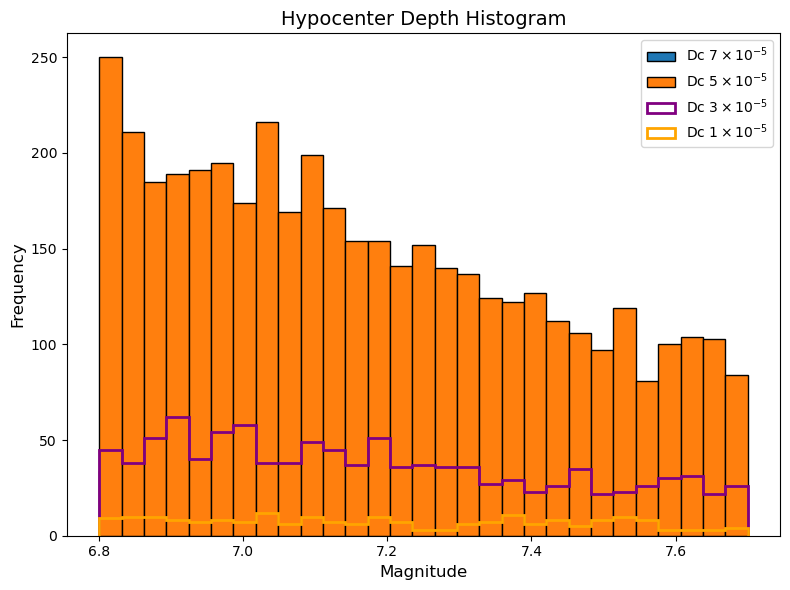

In [159]:
bin_min = 6.8
bin_max =7.7
bin_count = 30
bins = np.linspace(bin_min, bin_max, bin_count)
#############

plt.figure(figsize=(8, 6))

plt.hist(cat_mag1, bins=bins, edgecolor='black', label='Dc $7 \\times 10^{-5}$')

plt.hist(cat_mDtau2, bins=bins, edgecolor='black', label='Dc $5 \\times 10^{-5}$')

plt.hist(cat_mDtau3, bins=bins, histtype='step', linewidth=2, 
         color='purple', label='Dc $3 \\times 10^{-5}$')

# plt.hist(cat_mDtau4, bins=bins, histtype='step', linewidth=2, 
#          color='orange', label='Dc $1 \\times 10^{-5}$')



plt.xlabel('Magnitude', fontsize=12)

# formatter = ScalarFormatter(useMathText=True)
# formatter.set_powerlimits((4, 4))  # forces 10^4 scale

# # plt.gca().xaxis.set_major_formatter(formatter)
# plt.gca().yaxis.set_major_formatter(formatter)

# plt.ticklabel_format(style='sci', axis='y', scilimits=(4, 4))
# plt.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
plt.ylabel('Frequency', fontsize=12)
plt.title('Hypocenter Depth Histogram', fontsize=14)
# plt.grid(True, which='both', linestyle='--')
# plt.ylim(0, 400000)
# plt.gca().xaxis.set_major_locator(MultipleLocator(5))
plt.legend(loc='best')
plt.tight_layout()
plt.show()

# ...................................AFAD catalog....................................

In [143]:
mat_dat_afad = mat.loadmat('C:/Users/saram/MCQsim cat anlyss/EAFcatalog_forSarah.mat')
print(mat_dat_afad)

{'__header__': b'MATLAB 5.0 MAT-file, Platform: MACI64, Created on: Thu Feb 20 13:08:27 2025', '__version__': '1.0', '__globals__': [], 'FaultCatalog': array([[1.99054698e+03, 3.80000000e+01, 3.80000000e+01, 5.00000000e+00,
        5.10000000e+00],
       [1.99127870e+03, 3.84100000e+01, 3.90000000e+01, 1.10000000e+01,
        4.00000000e+00],
       [1.99232619e+03, 3.80000000e+01, 3.80000000e+01, 1.80000000e+01,
        4.00000000e+00],
       ...,
       [2.02443248e+03, 3.80439000e+01, 3.76706000e+01, 7.69000000e+00,
        2.10000000e+00],
       [2.02443250e+03, 3.77700000e+01, 3.74339000e+01, 7.00000000e+00,
        1.90000000e+00],
       [2.02443262e+03, 3.81239000e+01, 3.83422000e+01, 7.00000000e+00,
        2.20000000e+00]]), 'FullCatalog': array([[1.99002314e+03, 3.97400000e+01, 3.69600000e+01, 1.00000000e+00,
        3.30000000e+00],
       [1.99022045e+03, 4.00000000e+01, 3.80000000e+01, 1.00000000e+00,
        4.00000000e+00],
       [1.99023918e+03, 4.00000000e+01, 3.6

In [144]:
full_catalog_afad = mat_dat_afad['FullCatalog']
header_raw = mat_dat_afad['Header']

headers = [item[0] for item in header_raw[0]]

df_full_afad = pd.DataFrame(full_catalog_afad, columns=headers)


print(df_full_afad.head())

          Time  Latitude  Longitude  Depth  Magnitude
0  1990.023145     39.74      36.96    1.0        3.3
1  1990.220454     40.00      38.00    1.0        4.0
2  1990.239184     40.00      36.00    4.0        3.0
3  1990.281216     39.83      36.66    1.0        3.3
4  1990.281378     40.00      37.00    1.0        3.0


In [145]:
afad_mags=df_full_afad['Magnitude']

print(afad_mags)

0        3.3
1        4.0
2        3.0
3        3.3
4        3.0
        ... 
99771    1.4
99772    1.8
99773    2.1
99774    1.9
99775    2.2
Name: Magnitude, Length: 99776, dtype: float64


In [146]:
afad_times=df_full_afad['Time']


print(afad_times)

0        1990.023145
1        1990.220454
2        1990.239184
3        1990.281216
4        1990.281378
            ...     
99771    2024.432118
99772    2024.432288
99773    2024.432484
99774    2024.432501
99775    2024.432618
Name: Time, Length: 99776, dtype: float64


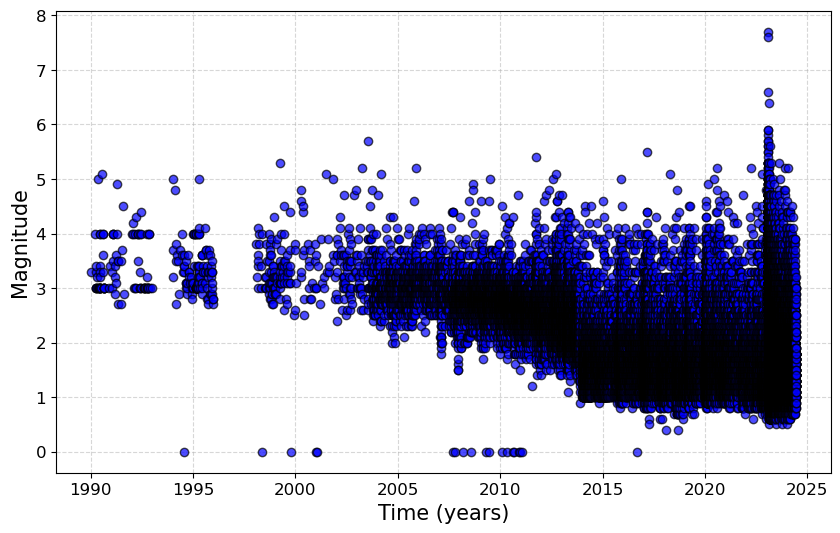

In [147]:
plt.figure(figsize=(10, 6))

plt.scatter(afad_times, afad_mags, color='blue', alpha=0.7, edgecolor='black')

plt.xlabel("Time (years)", fontsize=15)
plt.ylabel("Magnitude", fontsize=15)
# plt.title("Time vs Magnitude", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
plt.gca().set_axisbelow(True)
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.show()

: Estimated b-value = 0.88, Mc = 1.55
 Gutenberg–Richter relation:
  log10(N) = 6.43 - 0.88 * M


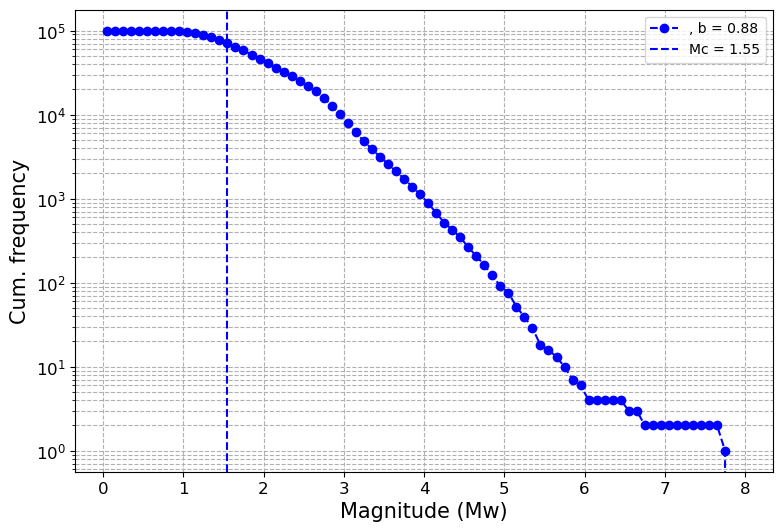

In [148]:
plt.figure(figsize=(9, 6))

# Process each catalog with distinct colors
process_catalog2(afad_mags, color='blue', label='')#, bin_width=0.1)

plt.xlabel("Magnitude (Mw)", fontsize=15)
plt.ylabel("Cum. frequency", fontsize=15)
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)
# plt.xticks(np.arange(2, 8.5, 0.5))  
plt.yscale("log")
plt.grid(True, which="both", linestyle="--")
# plt.title("Cumulative Frequency vs Magnitude for Three Catalogs")
plt.legend(loc="best")
plt.show()

In [151]:
afad_dep=df_full_afad['Depth']
pd.set_option('display.max_rows', None)
print(afad_dep)

0         1.00
1         1.00
2         4.00
3         1.00
4         1.00
5         1.00
6         1.00
7         1.00
8         4.00
9         1.00
10       14.00
11        1.00
12        1.00
13        9.00
14        6.00
15        9.00
16       30.00
17       30.00
18        6.00
19       22.00
20       20.00
21        1.00
22       22.00
23       17.00
24        5.00
25        1.00
26        1.00
27       30.00
28       35.00
29       11.00
30       12.00
31        9.00
32        8.00
33       19.00
34        9.00
35        7.00
36       33.00
37        1.00
38       20.00
39       11.00
40       35.00
41        7.00
42        6.00
43       11.00
44        1.00
45        1.00
46        1.00
47       25.00
48       13.00
49       11.00
50       11.00
51       25.00
52       79.00
53        9.00
54        1.00
55       16.00
56       11.00
57        1.00
58       11.00
59       13.00
60        3.00
61        2.00
62        6.00
63        7.00
64       13.00
65       11.00
66       1

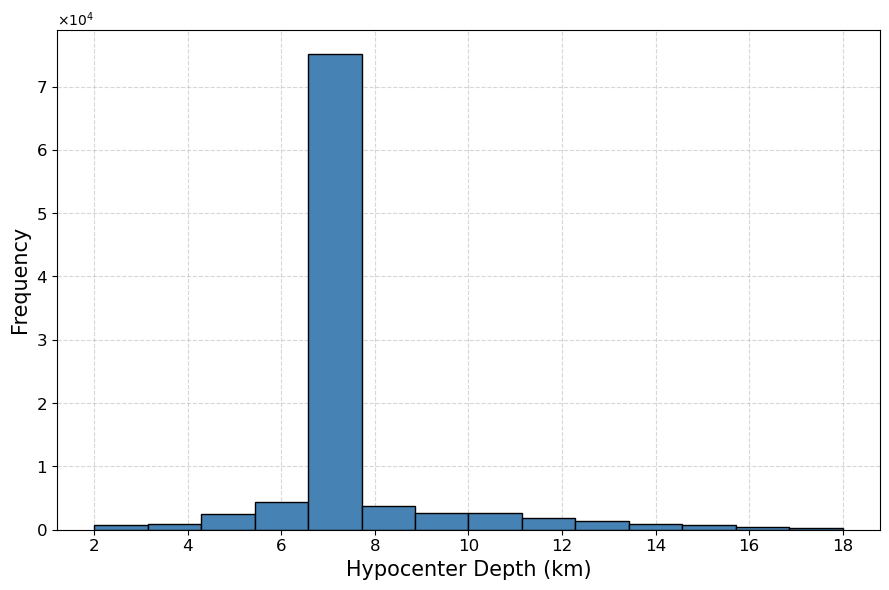

In [153]:
bin_min = 2
bin_max = 18
bin_count = 15
bins = np.linspace(bin_min, bin_max, bin_count)

# Compute histogram counts and bin edges
counts, bin_edges = np.histogram(afad_dep, bins=bins)


nonzero = counts > 0
counts = counts[nonzero]
bin_lefts = bin_edges[:-1][nonzero]
bin_rights = bin_edges[1:][nonzero]
bin_centers = (bin_lefts + bin_rights) / 2
widths = bin_rights - bin_lefts

# Plot only the bars that have non-zero counts
plt.figure(figsize=(9, 6))
plt.bar(bin_centers, counts, width=widths, color='steelblue', edgecolor='black')

y_formatter = ScalarFormatter(useMathText=True)
y_formatter.set_powerlimits((4, 4))  # x10^4
ax = plt.gca()
ax.yaxis.set_major_formatter(y_formatter)
ax.grid(True, linestyle='--', alpha=0.5)
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)
ax.set_axisbelow(True)
# Axis formatting
# formatter = ScalarFormatter(useMathText=True)
# formatter.set_powerlimits((4, 4))  # forces 10^4 scale

# plt.gca().xaxis.set_major_formatter(formatter)
# plt.gca().yaxis.set_major_formatter(formatter)

# plt.gca().yaxis.set_major_locator(MultipleLocator(10000))
plt.xlabel('Hypocenter Depth (km)', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
# plt.title('Hypocenter Depth Histogram')
# plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# #######................................***for wl***...........................##############

# ................................FMD............................

In [17]:
cat_mag_wl1= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/par_Dc1_mat.mat")
cat_mag_wl2= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/par_wl1_mat.mat")
cat_mag_wl3= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/par_wl2_mat.mat")
cat_mag_wl4= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/par_wl3_mat.mat")
cat_mag_wl5= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/par_wl4_mat.mat")

wl=0%: Estimated b-value = 0.84, Mc = 3.45
wl=0% Gutenberg–Richter relation:
  log10(N) = 8.24 - 0.84 * M
wl=10%: Estimated b-value = 0.83, Mc = 3.45
wl=10% Gutenberg–Richter relation:
  log10(N) = 8.24 - 0.83 * M
wl=20%: Estimated b-value = 0.90, Mc = 3.45
wl=20% Gutenberg–Richter relation:
  log10(N) = 8.64 - 0.90 * M
wl=30%: Estimated b-value = 0.90, Mc = 3.45
wl=30% Gutenberg–Richter relation:
  log10(N) = 8.63 - 0.90 * M
wl=60%: Estimated b-value = 0.92, Mc = 3.45
wl=60% Gutenberg–Richter relation:
  log10(N) = 8.76 - 0.92 * M


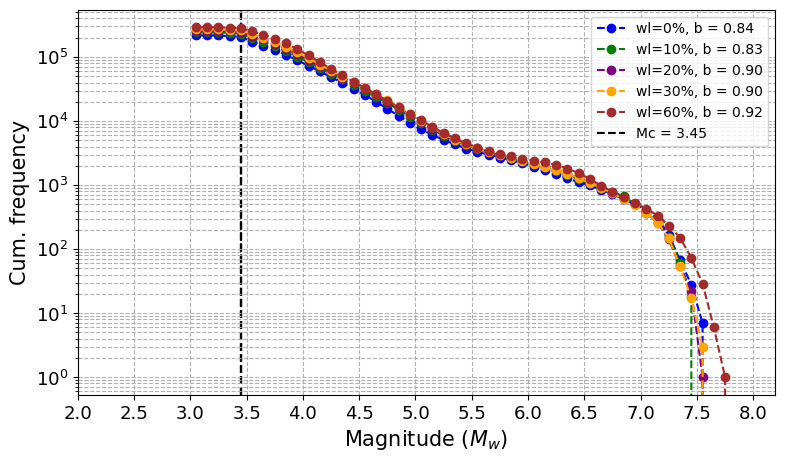

In [18]:
plt.figure(figsize=(9, 5))

#all with Dc=7e-5
# Process each catalog with distinct colors
wl1_Dc1=process_catalog3(cat_mag_wl1, color='blue', label='wl=0%', bin_width=0.1)
wl2=process_catalog3(cat_mag_wl2, color='green', label='wl=10%', bin_width=0.1)
wl3=process_catalog3(cat_mag_wl3, color='purple', label='wl=20%', bin_width=0.1)
wl4=process_catalog3(cat_mag_wl4, color='orange', label='wl=30%', bin_width=0.1)
wl5=process_catalog3(cat_mag_wl5, color='brown', label='wl=60%', bin_width=0.1, show_mc_legend=True)


plt.xlabel("Magnitude ($M_{w}$)", fontsize=15)
plt.ylabel("Cum. frequency", fontsize=15)
plt.xticks(np.arange(2, 8.5, 0.5), fontsize=13)  
plt.yticks(fontsize=13)
plt.yscale("log")
plt.grid(True, which="both", linestyle="--")
# plt.title("Cumulative Frequency vs Magnitude for Three Catalogs")
plt.legend(loc="best")
plt.show()

# ................................MvsRA............................

In [20]:
cat_RA_wl1= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/par_Dc1_mat.mat")
cat_RA_wl2= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/par_wl1_mat.mat")
cat_RA_wl3= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/par_wl2_mat.mat")
cat_RA_wl4= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/par_wl3_mat.mat")
cat_RA_wl5= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/par_wl4_mat.mat")

wl=0% fitted relation: log10(A) = -5.13 + 1.23 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.34, std = 0.20
wl=10% fitted relation: log10(A) = -5.14 + 1.24 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.31, std = 0.20
wl=20% fitted relation: log10(A) = -5.15 + 1.24 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.31, std = 0.20
wl=30% fitted relation: log10(A) = -5.15 + 1.24 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.31, std = 0.20
wl=60% fitted relation: log10(A) = -5.05 + 1.21 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.32, std = 0.20


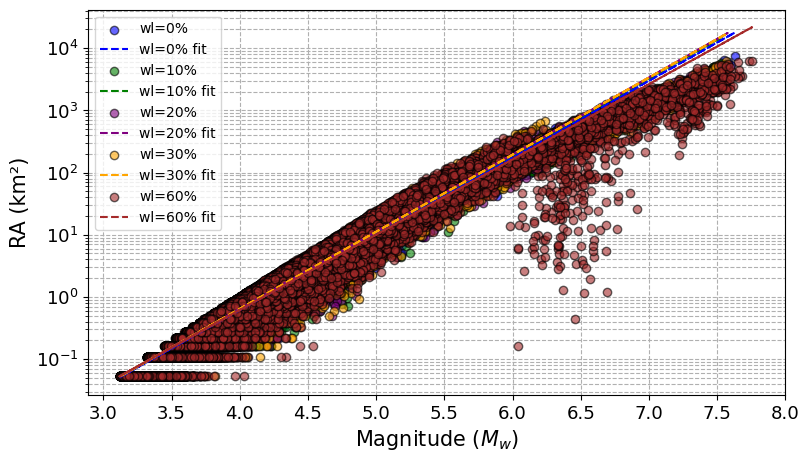

In [53]:
plt.figure(figsize=(9, 5))

RA_wl1=RAvsM2(cat_mag_wl1, cat_RA_wl1, color='blue', label= 'wl=0%')
RA_wl2=RAvsM2(cat_mag_wl2, cat_RA_wl2, color='green', label= 'wl=10%')
RA_wl3=RAvsM2(cat_mag_wl3, cat_RA_wl3, color='purple', label='wl=20%')
RA_wl4=RAvsM2(cat_mag_wl4, cat_RA_wl4, color='orange', label='wl=30%')
RA_wl5=RAvsM2(cat_mag_wl5, cat_RA_wl5, color='brown', label='wl=60%')


# mags_sorted = np.sort(cat_mag_wl1)
# RA_thingbaijam = 10**(-3.49 + 0.90 * mags_sorted)
# plt.plot(mags_sorted, RA_thingbaijam, color='red', linestyle='--', 
#          label='Thingbaijam et al. (2017)-SS\n$\\log_{10}(RA) = -3.49 + 0.90M$')


# RA_upper = 10**((-3.49 + 0.90 * mags_sorted) + 0.3)  # +1 std
# RA_lower = 10**((-3.49 + 0.90 * mags_sorted) - 0.3)  # -1 std
# plt.fill_between(mags_sorted, RA_lower, RA_upper, color='red', alpha=0.2, label='±1σ')


# Customize the plot
plt.xlabel('Magnitude ($M_{w}$)', fontsize=15)
plt.ylabel('RA (km²)', fontsize=15)
plt.yticks(fontsize=13)
plt.xticks(np.arange(3, 8.5, 0.5), fontsize=13) 
plt.yscale('log')
plt.grid(True, which='both', linestyle='--')  # Grid behind data
# plt.title('RA vs Magnitude')
plt.legend(loc='best')
plt.show()

wl=0% fitted relation: log10(A) = -3.82 + 0.99 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.23, std = 0.13
wl=10% fitted relation: log10(A) = -3.72 + 0.98 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.23, std = 0.13
wl=20% fitted relation: log10(A) = -3.69 + 0.97 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.24, std = 0.13
wl=30% fitted relation: log10(A) = -3.69 + 0.97 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.25, std = 0.13
wl=60% fitted relation: log10(A) = -3.47 + 0.93 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.19, std = 0.28


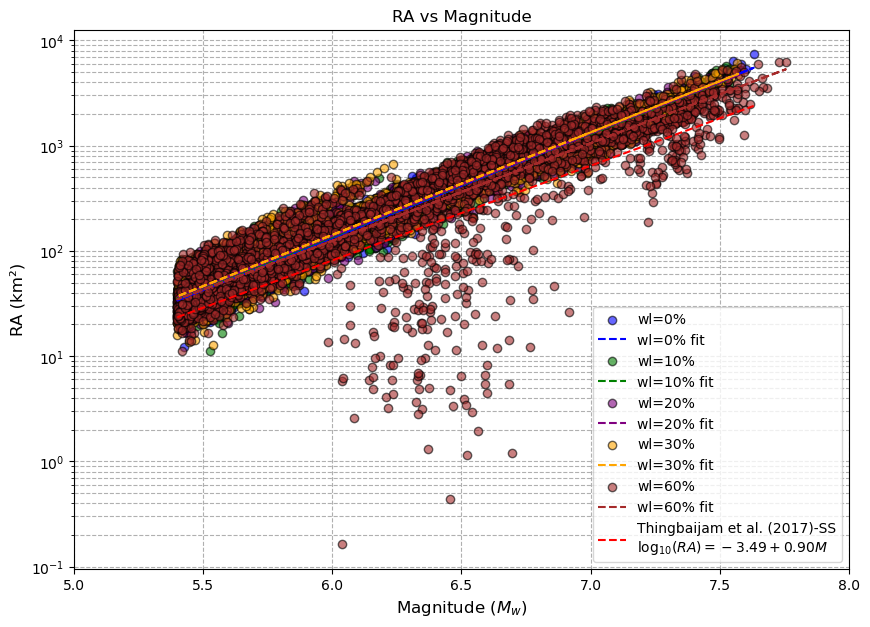

In [279]:
plt.figure(figsize=(10, 7))

RA_wl1=RAvsM_fltrd(cat_mag_wl1, cat_RA_wl1, color='blue', label= 'wl=0%')
RA_wl2=RAvsM_fltrd(cat_mag_wl2, cat_RA_wl2, color='green', label= 'wl=10%')
RA_wl3=RAvsM_fltrd(cat_mag_wl3, cat_RA_wl3, color='purple', label='wl=20%')
RA_wl4=RAvsM_fltrd(cat_mag_wl4, cat_RA_wl4, color='orange', label='wl=30%')
RA_wl5=RAvsM_fltrd(cat_mag_wl5, cat_RA_wl5, color='brown', label='wl=60%')




mask = cat_mag_wl1 >= 5.4
filtered_mag_wl1 = cat_mag_wl1[mask]
mags_sorted = np.sort(filtered_mag_wl1)

RA_thingbaijam = 10**(-3.49 + 0.90 * mags_sorted)
plt.plot(mags_sorted, RA_thingbaijam, color='red', linestyle='--', 
         label='Thingbaijam et al. (2017)-SS\n$\\log_{10}(RA) = -3.49 + 0.90M$')


# RA_upper = 10**((-3.49 + 0.90 * mags_sorted) + 0.3)  # +1 std
# RA_lower = 10**((-3.49 + 0.90 * mags_sorted) - 0.3)  # -1 std
# plt.fill_between(mags_sorted, RA_lower, RA_upper, color='red', alpha=0.2, label='±1σ')


# Customize the plot
plt.xlabel('Magnitude ($M_{w}$)', fontsize=12)
plt.ylabel('RA (km²)', fontsize=12)
plt.xticks(np.arange(5, 8.5, 0.5)) 
plt.yscale('log')
plt.grid(True, which='both', linestyle='--')  # Grid behind data
plt.title('RA vs Magnitude')
plt.legend(loc='best')
plt.show()

wl=0% fitted relation: log10(RA) = -3.82 + 0.99 * M

Residuals vs Thingbaijam et al. (2017) for wl=0%:
Mean = 0.23, Std = 0.13
wl=10% fitted relation: log10(RA) = -3.72 + 0.98 * M

Residuals vs Thingbaijam et al. (2017) for wl=10%:
Mean = 0.23, Std = 0.13
wl=20% fitted relation: log10(RA) = -3.69 + 0.97 * M

Residuals vs Thingbaijam et al. (2017) for wl=20%:
Mean = 0.24, Std = 0.13
wl=30% fitted relation: log10(RA) = -3.69 + 0.97 * M

Residuals vs Thingbaijam et al. (2017) for wl=30%:
Mean = 0.25, Std = 0.13
wl=60% fitted relation: log10(RA) = -3.47 + 0.93 * M

Residuals vs Thingbaijam et al. (2017) for wl=60%:
Mean = 0.19, Std = 0.28


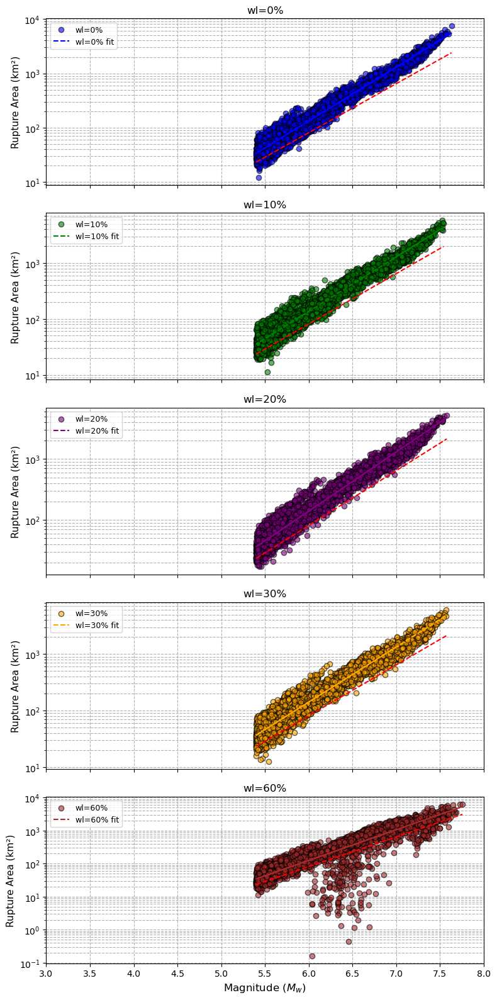

In [284]:
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(8, 16), sharex=True)

catalogs33 = [
    (cat_mag_wl1, cat_RA_wl1, 'blue',  'wl=0%'),
    (cat_mag_wl2, cat_RA_wl2, 'green', 'wl=10%'),
    (cat_mag_wl3, cat_RA_wl3, 'purple','wl=20%'),
    (cat_mag_wl4, cat_RA_wl4, 'orange','wl=30%'),
    (cat_mag_wl5, cat_RA_wl5, 'brown','wl=60%')
]

for ax, (mags, RAs, color, label) in zip(axes, catalogs33):
    
    mask = mags >= 5.4
    mags = mags[mask]
    RAs = RAs[mask]
    
    RAvsM3(mags, RAs, color=color, label=label, ax=ax)

    mags_sorted = np.sort(mags)
    RA_thingbaijam = 10**(-3.49 + 0.90 * mags_sorted)
    ax.plot(mags_sorted, RA_thingbaijam, color='red', linestyle='--', 
            label='Thingbaijam et al. (2017) – SS\n$\\log_{10}(RA) = -3.49 + 0.90M$')

    ax.set_title(label)

axes[-1].set_xlabel('Magnitude ($M_{w}$)', fontsize=12)
plt.xticks(np.arange(3, 8.5, 0.5))
# plt.suptitle('Rupture Area vs Magnitude for Different Dc Values', fontsize=15, y=0.92)
plt.tight_layout()
plt.show()

wl=0% fitted relation: log10(RA) = -5.13 + 1.23 * M

Residuals vs Thingbaijam et al. (2017) for wl=0%:
Mean = -0.34, Std = 0.20
wl=10% fitted relation: log10(RA) = -5.14 + 1.24 * M

Residuals vs Thingbaijam et al. (2017) for wl=10%:
Mean = -0.31, Std = 0.20
wl=20% fitted relation: log10(RA) = -5.15 + 1.24 * M

Residuals vs Thingbaijam et al. (2017) for wl=20%:
Mean = -0.31, Std = 0.20
wl=30% fitted relation: log10(RA) = -5.15 + 1.24 * M

Residuals vs Thingbaijam et al. (2017) for wl=30%:
Mean = -0.31, Std = 0.20
wl=60% fitted relation: log10(RA) = -5.05 + 1.21 * M

Residuals vs Thingbaijam et al. (2017) for wl=60%:
Mean = -0.32, Std = 0.20


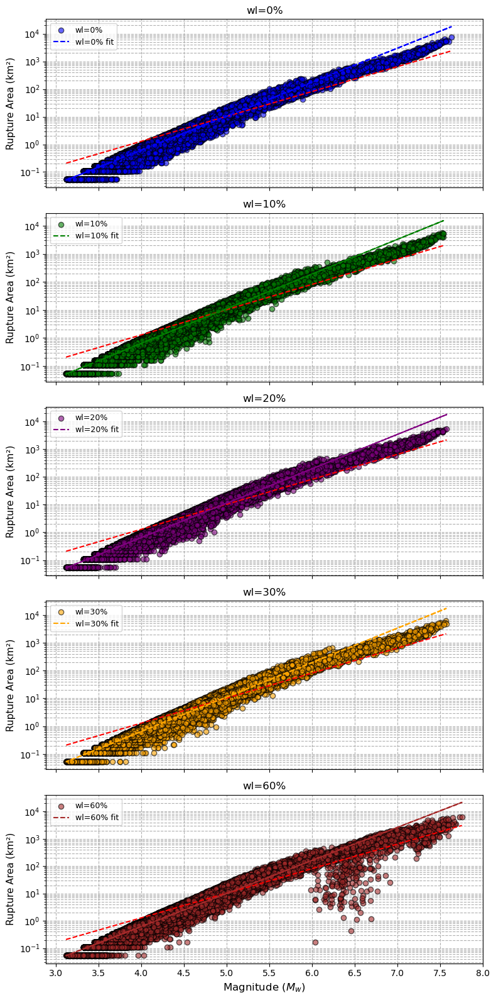

In [143]:
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(8, 16), sharex=True)

catalogs33 = [
    (cat_mag_wl1, cat_RA_wl1, 'blue',  'wl=0%'),
    (cat_mag_wl2, cat_RA_wl2, 'green', 'wl=10%'),
    (cat_mag_wl3, cat_RA_wl3, 'purple','wl=20%'),
    (cat_mag_wl4, cat_RA_wl4, 'orange','wl=30%'),
    (cat_mag_wl5, cat_RA_wl5, 'brown','wl=60%')
]

for ax, (mags, RAs, color, label) in zip(axes, catalogs33):
    
    mask = mags >= 5.4
    mags = mags[mask]
    RAs = RAs[mask]
    
    RAvsM3(mags, RAs, color=color, label=label, ax=ax)

    mags_sorted = np.sort(mags)
    RA_thingbaijam = 10**(-3.49 + 0.90 * mags_sorted)
    ax.plot(mags_sorted, RA_thingbaijam, color='red', linestyle='--', 
            label='Thingbaijam et al. (2017) – SS\n$\\log_{10}(RA) = -3.49 + 0.90M$')

    ax.set_title(label)

axes[-1].set_xlabel('Magnitude ($M_{w}$)', fontsize=12)
plt.xticks(np.arange(3, 8.5, 0.5))
# plt.suptitle('Rupture Area vs Magnitude for Different Dc Values', fontsize=15, y=0.92)
plt.tight_layout()
plt.show()


# ................................hypo depth............................

In [21]:
cat_hypZ_wl1= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/par_Dc1_mat.mat")
cat_hypZ_wl2= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/par_wl1_mat.mat")
cat_hypZ_wl3= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/par_wl2_mat.mat")
cat_hypZ_wl4= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/par_wl3_mat.mat")
cat_hypZ_wl5= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/par_wl4_mat.mat")

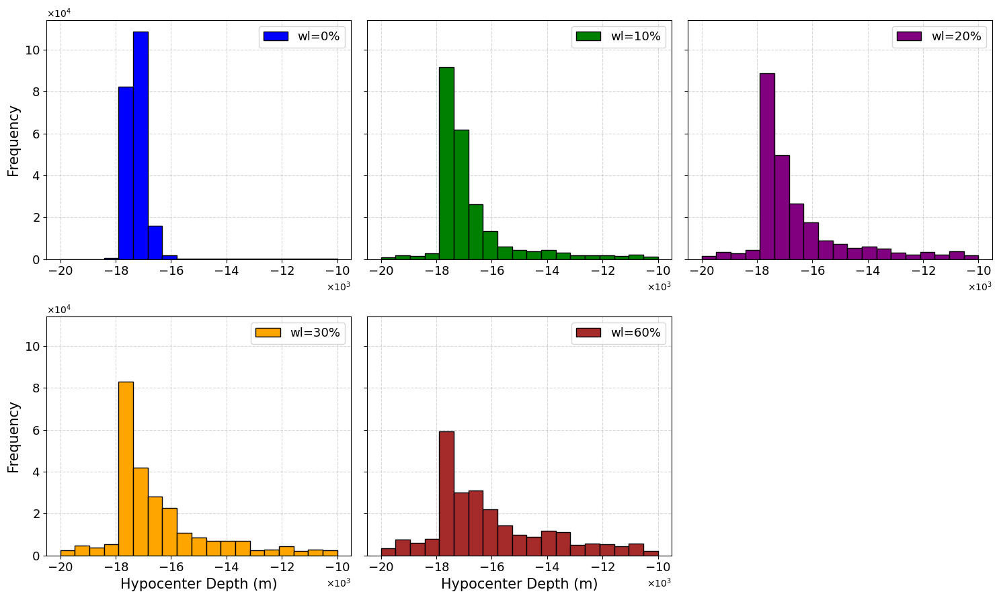

In [33]:
# Histogram bin settings
bin_min = -20000
bin_max = -10000
bin_count = 20
bins = np.linspace(bin_min, bin_max, bin_count)

# Catalogs and labels/colors
catalogs11 = [
    (cat_hypZ_wl1, 'wl=0%', 'blue'),
    (cat_hypZ_wl2, 'wl=10%', 'green'),
    (cat_hypZ_wl3, 'wl=20%', 'purple'),
    (cat_hypZ_wl4, 'wl=30%', 'orange'),
    (cat_hypZ_wl5, 'wl=60%', 'brown')
]

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 9), sharey=True)
axes = axes.flatten()
# Formatter for scientific notation
x_formatter = ScalarFormatter(useMathText=True)
x_formatter.set_powerlimits((3, 3))  # x10^3

y_formatter = ScalarFormatter(useMathText=True)
y_formatter.set_powerlimits((4, 4))  # x10^4

for ax, (data, label, color) in zip(axes, catalogs11):
    
    ax.hist(data, bins=bins, edgecolor='black', color=color, label=label)

    # Axis formatting
#     ax.set_xlabel('Hypocenter Depth (m)', fontsize=13)
#     ax.set_title(label, fontsize=12)
#     ax.xaxis.set_major_formatter(formatter)
#     ax.yaxis.set_major_formatter(formatter)
#     ax.yaxis.set_major_locator(MultipleLocator(40000))
    
#     ax.ticklabel_format(style='sci', axis='x', scilimits=(3, 3))
#     ax.ticklabel_format(style='sci', axis='both', scilimits=(3, 4))
    ax.xaxis.set_major_formatter(x_formatter)
    ax.yaxis.set_major_formatter(y_formatter)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(loc='upper right', fontsize=13)
    ax.set_axisbelow(True)
    ax.tick_params(axis='x', labelsize=13)
    ax.tick_params(axis='y', labelsize=13)
    
if len(catalogs11) < len(axes):
    for i in range(len(catalogs11), len(axes)):
        fig.delaxes(axes[i]) 
# Shared y-axis label
axes[0].set_ylabel('Frequency', fontsize=15)
axes[3].set_ylabel('Frequency', fontsize=15)
# axes[4].set_ylabel('Frequency', fontsize=15)
# axes[1].set_xlabel('Hypocenter Depth (m)', fontsize=12)
# axes[2].set_xlabel('Hypocenter Depth (m)', fontsize=15)
axes[4].set_xlabel('Hypocenter Depth (m)', fontsize=15)
axes[3].set_xlabel('Hypocenter Depth (m)', fontsize=15)
""
# Layout and title
# plt.suptitle('Hypocenter Depth Histograms by Dc Value', fontsize=15, y=1.02)
plt.tight_layout()
plt.show()


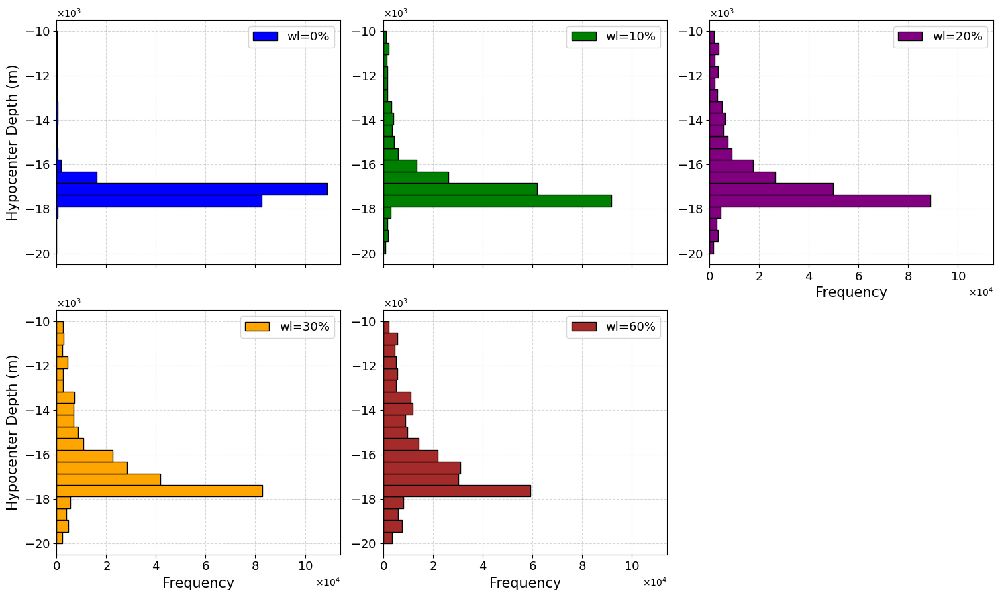

In [37]:
# Histogram bin settings
bin_min = -20000
bin_max = -10000
bin_count = 20
bins = np.linspace(bin_min, bin_max, bin_count)

# Catalogs and labels/colors
catalogs11 = [
    (cat_hypZ_wl1, 'wl=0%', 'blue'),
    (cat_hypZ_wl2, 'wl=10%', 'green'),
    (cat_hypZ_wl3, 'wl=20%', 'purple'),
    (cat_hypZ_wl4, 'wl=30%', 'orange'),
    (cat_hypZ_wl5, 'wl=60%', 'brown')
]

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 9), sharex=True)
axes = axes.flatten()

# Formatters for scientific notation
x_formatter = ScalarFormatter(useMathText=True)
x_formatter.set_powerlimits((4, 4))  # Frequency axis now x

y_formatter = ScalarFormatter(useMathText=True)
y_formatter.set_powerlimits((3, 3))  # Depth axis now y

for ax, (data, label, color) in zip(axes, catalogs11):
    ax.hist(data, bins=bins, edgecolor='black', color=color, label=label, orientation='horizontal')

    # Axis formatting
    ax.xaxis.set_major_formatter(x_formatter)
    ax.yaxis.set_major_formatter(y_formatter)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(loc='upper right', fontsize=13)
    ax.set_axisbelow(True)
    ax.tick_params(axis='x', labelsize=13)
    ax.tick_params(axis='y', labelsize=13)

# Remove any unused axes
if len(catalogs11) < len(axes):
    for i in range(len(catalogs11), len(axes)):
        fig.delaxes(axes[i]) 

# Shared axis labels
axes[2].set_xlabel('Frequency', fontsize=15)  # wl=20% (top right)
axes[3].set_xlabel('Frequency', fontsize=15)  # wl=30% (bottom left)
axes[4].set_xlabel('Frequency', fontsize=15)  # wl=60% (bottom middle)
axes[2].tick_params(axis='x', labelbottom=True)

axes[0].set_ylabel('Hypocenter Depth (m)', fontsize=15)
axes[3].set_ylabel('Hypocenter Depth (m)', fontsize=15)

plt.tight_layout()
plt.show()


# ................................mean stress drop............................

In [77]:
cat_mDtau_wl1= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/par_Dc1_mat.mat")
cat_mDtau_wl2= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/par_wl1_mat.mat")
cat_mDtau_wl3= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/par_wl2_mat.mat")
cat_mDtau_wl4= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/par_wl3_mat.mat")
cat_mDtau_wl5= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/par_wl4_mat.mat")

wl=0%:
  Median = 5.01 MPa
  Mode   = 4.91 MPa
wl=10%:
  Median = 4.95 MPa
  Mode   = 4.40 MPa
wl=20%:
  Median = 4.98 MPa
  Mode   = 4.40 MPa
wl=30%:
  Median = 5.01 MPa
  Mode   = 4.40 MPa
wl=60%:
  Median = 5.20 MPa
  Mode   = 4.40 MPa


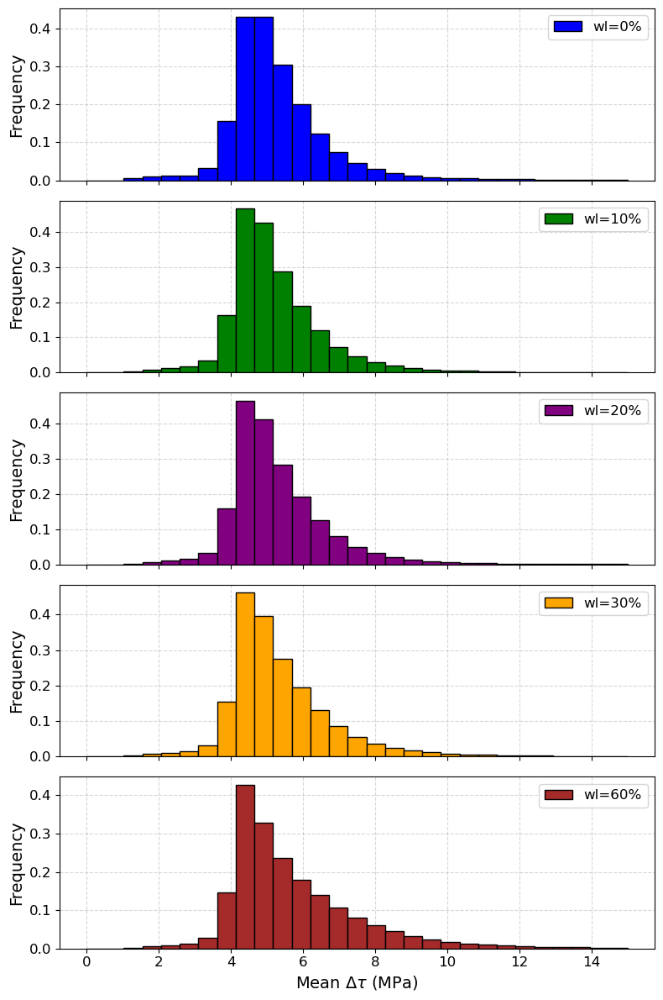

In [92]:
#######subplots of the stress drop#########
from matplotlib.ticker import MultipleLocator, ScalarFormatter

#################
bin_min = 0
bin_max = 15
bin_count = 30
bins = np.linspace(bin_min, bin_max, bin_count)
###################
# Catalogs: (data, label, color)
catalogs22 = [
    (cat_mDtau_wl1, 'wl=0%', 'blue'),
    (cat_mDtau_wl2, 'wl=10%', 'green'),
    (cat_mDtau_wl3, 'wl=20%', 'purple'),
    (cat_mDtau_wl4, 'wl=30%', 'orange'),
    (cat_mDtau_wl5, 'wl=60%', 'brown')
]

# Create 4-row, 1-column subplots
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(8, 12), sharex=True)

# # Formatter for scientific y-axis
# y_formatter = ScalarFormatter(useMathText=True)
# y_formatter.set_powerlimits((4, 4))

for ax, (data, label, color) in zip(axes, catalogs22):
    ax.hist(data, bins=bins, edgecolor='black', color=color, label=label, density=True)
    
    median = np.median(data)

    # Calculate mode based on histogram peak bin
    counts, edges = np.histogram(data, bins=bins)
    mode_bin_index = np.argmax(counts)
    mode = (edges[mode_bin_index] + edges[mode_bin_index + 1]) / 2

    
    print(f"{label}:")
    print(f"  Median = {median:.2f} MPa")
    print(f"  Mode   = {mode:.2f} MPa")
#     ax.axvline(median, color='black', linestyle='--', linewidth=1.2, label='Median')
#     ax.axvline(mode, color='red', linestyle=':', linewidth=1.2, label='Mode')

    ax.set_ylabel('Frequency', fontsize=14)
# #     ax.set_title(label, fontsize=12)
#     ax.yaxis.set_major_formatter(y_formatter)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_axisbelow(True)
    ax.legend(loc='upper right', fontsize=12)
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)

# Shared x-axis formatting
axes[-1].set_xlabel('Mean $\\Delta\\tau$ (MPa)', fontsize=14)
axes[-1].xaxis.set_major_locator(MultipleLocator(2))

# Layout
# plt.suptitle('Mean $\\Delta\\tau$ Histograms by Dc Value', fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

# ................................magnitude histograms............................

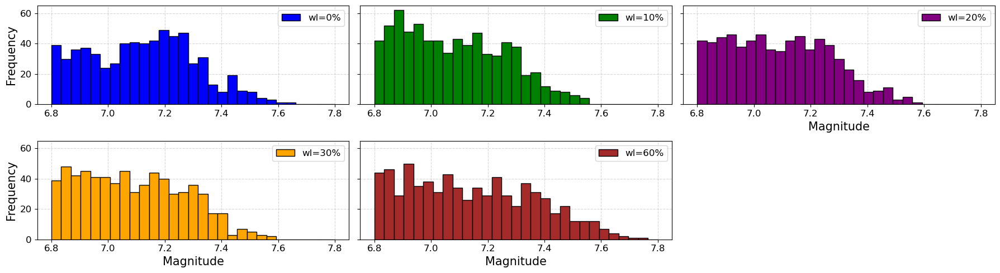

In [91]:
bin_min =6.8
bin_max = 7.8
bin_count = 30
bins = np.linspace(bin_min, bin_max, bin_count)

# Catalogs to plot: (data, label, color)
catalogs33 = [
    (cat_mag_wl1, 'wl=0%', 'blue'),
    (cat_mag_wl2, 'wl=10%', 'green'),
    (cat_mag_wl3, 'wl=20%', 'purple'),
    (cat_mag_wl4, 'wl=30%', 'orange'),
    (cat_mag_wl5, 'wl=60%', 'brown')
]

# Create 1 row × 3 column subplot
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 5), sharey=True)
axes = axes.flatten()

for ax, (data, label, color) in zip(axes, catalogs33):
    ax.hist(data, bins=bins, edgecolor='black', color=color, label=label)
#     ax.set_title('model1', fontsize=12)
#     ax.set_xlabel('Magnitude', fontsize=11)
    ax.set_axisbelow(True)
#     ax.yaxis.set_major_locator(MultipleLocator(50000))
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(loc='upper right', fontsize=12)

if len(catalogs33) < len(axes):
    for i in range(len(catalogs33), len(axes)):
        fig.delaxes(axes[i])    
# Y label only on the first plot
axes[3].set_xlabel('Magnitude', fontsize=15)
axes[-2].set_xlabel('Magnitude', fontsize=15)
axes[2].set_xlabel('Magnitude', fontsize=15)
axes[0].set_ylabel('Frequency', fontsize=15)
axes[3].set_ylabel('Frequency', fontsize=15)
# axes[0].yaxis.set_major_locator(MultipleLocator(10))
# Final layout
# plt.suptitle('model1', fontsize=15, y=1.05)
plt.tight_layout()
plt.show()

# ######..........................................***for par_cl***.....................................................

In [217]:
cat_mag_cl9= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/par_cl9_mat.mat")

In [218]:
cat_RA_cl9= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/par_cl9_mat.mat")

cl=15 in strike and dip fitted relation: log10(A) = -5.11 + 1.23 * M

Residuals vs Wells & Coppersmith (1994):
All fault types: mean = -0.33, std = 0.19
Strike-slip    : mean = -0.36, std = 0.19
Individual residuals (log10(RA_obs) - log10(RA_pred_all)):


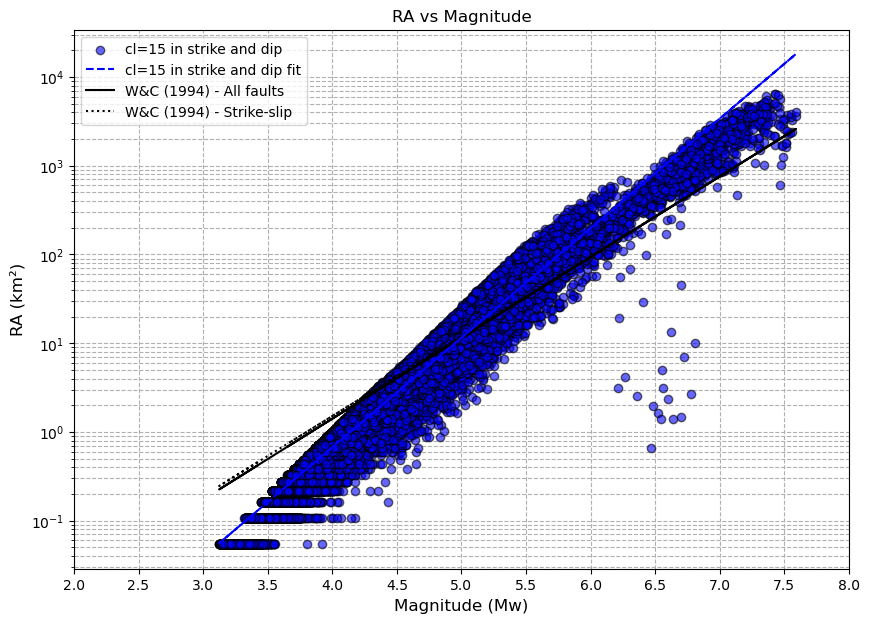

In [222]:
plt.figure(figsize=(10, 7))

RA_cl9=RAvsM2(cat_mag_cl9, cat_RA_cl9, color='blue', label= 'cl=15 in strike and dip')

# Customize the plot
plt.xlabel('Magnitude (Mw)', fontsize=12)
plt.ylabel('RA (km²)', fontsize=12)
plt.xticks(np.arange(2, 8.5, 0.5)) 
plt.yscale('log')
plt.grid(True, which='both', linestyle='--')  # Grid behind data
plt.title('RA vs Magnitude')
plt.legend(loc='best')
plt.show()

# ................................FMD............................

In [84]:
cat_mag_cl1= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/par2_cl1_mat.mat")
cat_mag_cl2= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/par2_cl2_mat.mat")
cat_mag_cl3= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/par2_cl3_mat.mat")
cat_mag_cl4= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/par2_cl4_mat.mat")
cat_mag_cl5= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/par2_cl5_mat.mat")
cat_mag_cl6= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/par2_cl6_mat.mat")

cl(in strike&dip)=0.5 km: Estimated b-value = 0.92, Mc = 3.45
cl(in strike&dip)=0.5 km Gutenberg–Richter relation:
  log10(N) = 8.73 - 0.92 * M
cl(in strike&dip)=1 km: Estimated b-value = 0.90, Mc = 3.45
cl(in strike&dip)=1 km Gutenberg–Richter relation:
  log10(N) = 8.64 - 0.90 * M
cl(in strike&dip)=5 km: Estimated b-value = 0.92, Mc = 3.45
cl(in strike&dip)=5 km Gutenberg–Richter relation:
  log10(N) = 8.69 - 0.92 * M
cl(in strike&dip)=10 km: Estimated b-value = 0.89, Mc = 3.45
cl(in strike&dip)=10 km Gutenberg–Richter relation:
  log10(N) = 8.52 - 0.89 * M
cl(in strike&dip)=15 km: Estimated b-value = 0.88, Mc = 3.45
cl(in strike&dip)=15 km Gutenberg–Richter relation:
  log10(N) = 8.45 - 0.88 * M
cl(in strike&dip)=20 km: Estimated b-value = 0.87, Mc = 3.45
cl(in strike&dip)=20 km Gutenberg–Richter relation:
  log10(N) = 8.40 - 0.87 * M


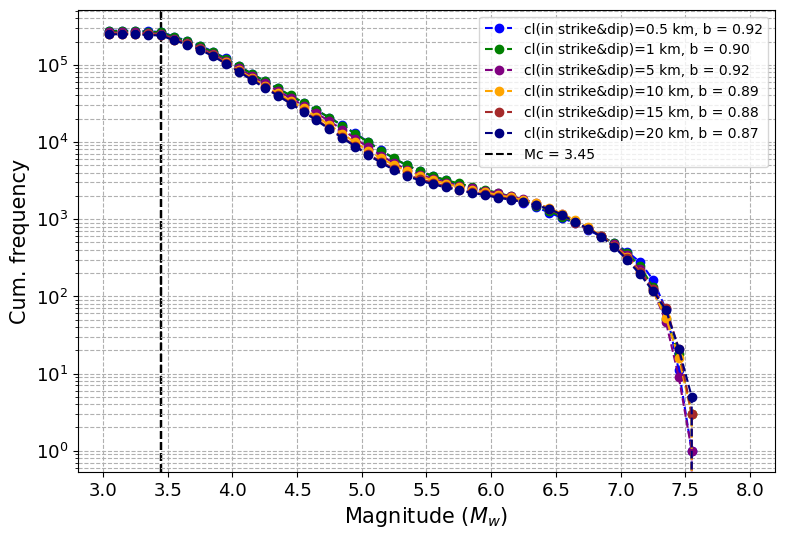

In [88]:
plt.figure(figsize=(9, 6))

# Process each catalog with distinct colors
process_catalog3(cat_mag_cl1, color='blue', label='cl(in strike&dip)=0.5 km', bin_width=0.1)
process_catalog3(cat_mag_cl2, color='green', label='cl(in strike&dip)=1 km', bin_width=0.1)
process_catalog3(cat_mag_cl3, color='purple', label='cl(in strike&dip)=5 km', bin_width=0.1)
process_catalog3(cat_mag_cl4, color='orange', label='cl(in strike&dip)=10 km', bin_width=0.1)
process_catalog3(cat_mag_cl5, color='brown', label='cl(in strike&dip)=15 km', bin_width=0.1)
process_catalog3(cat_mag_cl6, color='navy', label='cl(in strike&dip)=20 km', bin_width=0.1, show_mc_legend=True)


plt.xlabel("Magnitude ($M_{w}$)", fontsize=15)
plt.ylabel("Cum. frequency", fontsize=15)
plt.xticks(np.arange(3, 8.5, 0.5), fontsize=13)  
plt.yscale("log")
plt.yticks(fontsize=13)
plt.grid(True, which="both", linestyle="--")
# plt.title("Cumulative Frequency vs Magnitude for Three Catalogs")
plt.legend(loc="best")
plt.show()

# ................................MvsRA............................

In [89]:
cat_RA_cl1= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/par2_cl1_mat.mat")
cat_RA_cl2= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/par2_cl2_mat.mat")
cat_RA_cl3= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/par2_cl3_mat.mat")
cat_RA_cl4= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/par2_cl4_mat.mat")
cat_RA_cl5= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/par2_cl5_mat.mat")
cat_RA_cl6= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/par2_cl6_mat.mat")

cl(in strike&dip)=0.5 km fitted relation: log10(A) = -5.18 + 1.25 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.31, std = 0.21
cl(in strike&dip)=1 km fitted relation: log10(A) = -5.16 + 1.24 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.31, std = 0.21
cl(in strike&dip)=5 km fitted relation: log10(A) = -5.14 + 1.24 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.30, std = 0.20
cl(in strike&dip)=10 km fitted relation: log10(A) = -5.13 + 1.24 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.30, std = 0.20
cl(in strike&dip)=15 km fitted relation: log10(A) = -5.13 + 1.24 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.30, std = 0.20
cl(in strike&dip)=20 km fitted relation: log10(A) = -5.12 + 1.24 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.30, std = 0.20


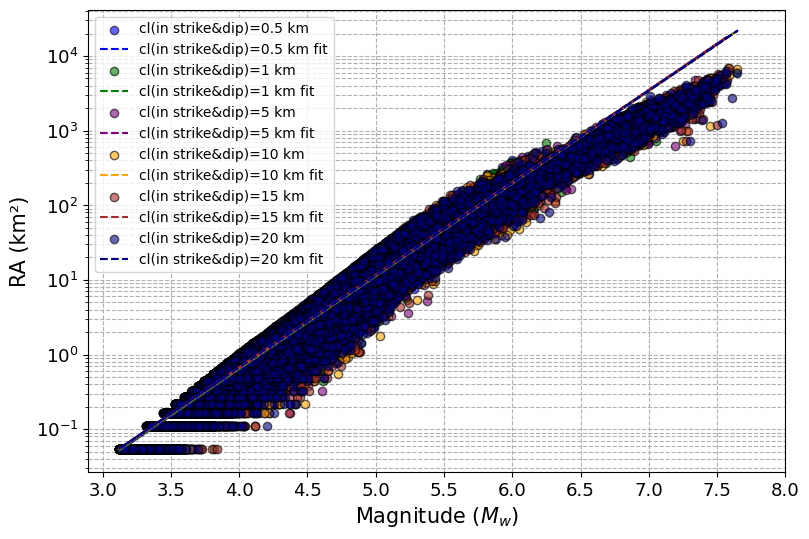

In [93]:
plt.figure(figsize=(9, 6))

RAvsM2(cat_mag_cl1, cat_RA_cl1, color='blue', label= 'cl(in strike&dip)=0.5 km')
RAvsM2(cat_mag_cl2, cat_RA_cl2, color='green', label= 'cl(in strike&dip)=1 km')
RAvsM2(cat_mag_cl3, cat_RA_cl3, color='purple', label='cl(in strike&dip)=5 km')
RAvsM2(cat_mag_cl4, cat_RA_cl4, color='orange', label='cl(in strike&dip)=10 km')
RAvsM2(cat_mag_cl5, cat_RA_cl5, color='brown', label='cl(in strike&dip)=15 km')
RAvsM2(cat_mag_cl6, cat_RA_cl6, color='navy', label='cl(in strike&dip)=20 km')


# mags_sorted = np.sort(cat_mag_cl1)
# RA_thingbaijam = 10**(-3.49 + 0.90 * mags_sorted)
# plt.plot(mags_sorted, RA_thingbaijam, color='red', linestyle='--', 
#          label='Thingbaijam et al. (2017)-SS\n$\\log_{10}(RA) = -3.49 + 0.90M$')


# RA_upper = 10**((-3.49 + 0.90 * mags_sorted) + 0.3)  # +1 std
# RA_lower = 10**((-3.49 + 0.90 * mags_sorted) - 0.3)  # -1 std
# plt.fill_between(mags_sorted, RA_lower, RA_upper, color='red', alpha=0.2, label='±1σ')


# Customize the plot
plt.xlabel('Magnitude ($M_{w}$)', fontsize=15)
plt.ylabel('RA (km²)', fontsize=15)
plt.xticks(np.arange(3, 8.5, 0.5), fontsize=13) 
plt.yticks(fontsize=13)
plt.yscale('log')
plt.grid(True, which='both', linestyle='--')  # Grid behind data
# plt.title('RA vs Magnitude')
plt.legend(loc='best')
plt.show()

cl(in strike&dip)=0.5 km fitted relation: log10(A) = -3.66 + 0.97 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.24, std = 0.14
cl(in strike&dip)=1 km fitted relation: log10(A) = -3.70 + 0.97 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.25, std = 0.13
cl(in strike&dip)=5 km fitted relation: log10(A) = -3.83 + 1.00 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.26, std = 0.14
cl(in strike&dip)=10 km fitted relation: log10(A) = -3.92 + 1.01 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.27, std = 0.15
cl(in strike&dip)=15 km fitted relation: log10(A) = -3.98 + 1.02 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.27, std = 0.16
cl(in strike&dip)=20 km fitted relation: log10(A) = -4.01 + 1.03 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.27, std = 0.17


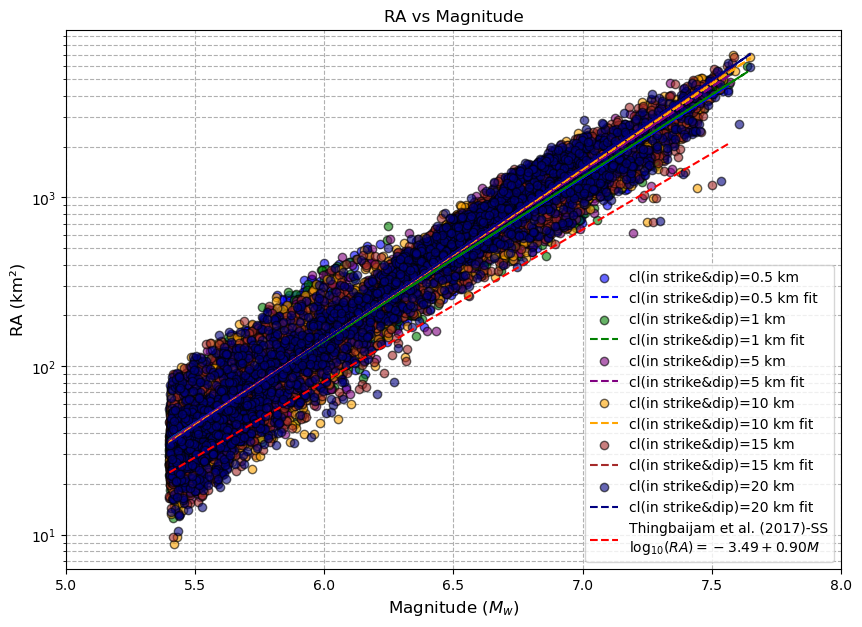

In [266]:
plt.figure(figsize=(10, 7))

RAvsM_fltrd(cat_mag_cl1, cat_RA_cl1, color='blue', label= 'cl(in strike&dip)=0.5 km')
RAvsM_fltrd(cat_mag_cl2, cat_RA_cl2, color='green', label= 'cl(in strike&dip)=1 km')
RAvsM_fltrd(cat_mag_cl3, cat_RA_cl3, color='purple', label='cl(in strike&dip)=5 km')
RAvsM_fltrd(cat_mag_cl4, cat_RA_cl4, color='orange', label='cl(in strike&dip)=10 km')
RAvsM_fltrd(cat_mag_cl5, cat_RA_cl5, color='brown', label='cl(in strike&dip)=15 km')
RAvsM_fltrd(cat_mag_cl6, cat_RA_cl6, color='navy', label='cl(in strike&dip)=20 km')



mask = cat_mag_cl1 >= 5.4
filtered_mag_cl1 = cat_mag_cl1[mask]
mags_sorted = np.sort(filtered_mag_cl1)

RA_thingbaijam = 10**(-3.49 + 0.90 * mags_sorted)
plt.plot(mags_sorted, RA_thingbaijam, color='red', linestyle='--', 
         label='Thingbaijam et al. (2017)-SS\n$\\log_{10}(RA) = -3.49 + 0.90M$')


# RA_upper = 10**((-3.49 + 0.90 * mags_sorted) + 0.3)  # +1 std
# RA_lower = 10**((-3.49 + 0.90 * mags_sorted) - 0.3)  # -1 std
# plt.fill_between(mags_sorted, RA_lower, RA_upper, color='red', alpha=0.2, label='±1σ')


# Customize the plot
plt.xlabel('Magnitude ($M_{w}$)', fontsize=12)
plt.ylabel('RA (km²)', fontsize=12)
plt.xticks(np.arange(5, 8.5, 0.5)) 
plt.yticks(fontsize=13)
plt.yscale('log')
plt.grid(True, which='both', linestyle='--')  # Grid behind data
plt.title('RA vs Magnitude')
plt.legend(loc='best')
plt.show()

cl(in strike&dip)=0.5 km fitted relation: log10(RA) = -3.66 + 0.97 * M

Residuals vs Thingbaijam et al. (2017) for cl(in strike&dip)=0.5 km:
Mean = 0.24, Std = 0.14
cl(in strike&dip)=1 km fitted relation: log10(RA) = -3.70 + 0.97 * M

Residuals vs Thingbaijam et al. (2017) for cl(in strike&dip)=1 km:
Mean = 0.25, Std = 0.13
cl(in strike&dip)=5 km fitted relation: log10(RA) = -3.83 + 1.00 * M

Residuals vs Thingbaijam et al. (2017) for cl(in strike&dip)=5 km:
Mean = 0.26, Std = 0.14
cl(in strike&dip)=10 km fitted relation: log10(RA) = -3.92 + 1.01 * M

Residuals vs Thingbaijam et al. (2017) for cl(in strike&dip)=10 km:
Mean = 0.27, Std = 0.15
cl(in strike&dip)=15 km fitted relation: log10(RA) = -3.98 + 1.02 * M

Residuals vs Thingbaijam et al. (2017) for cl(in strike&dip)=15 km:
Mean = 0.27, Std = 0.16
cl(in strike&dip)=20 km fitted relation: log10(RA) = -4.01 + 1.03 * M

Residuals vs Thingbaijam et al. (2017) for cl(in strike&dip)=20 km:
Mean = 0.27, Std = 0.17


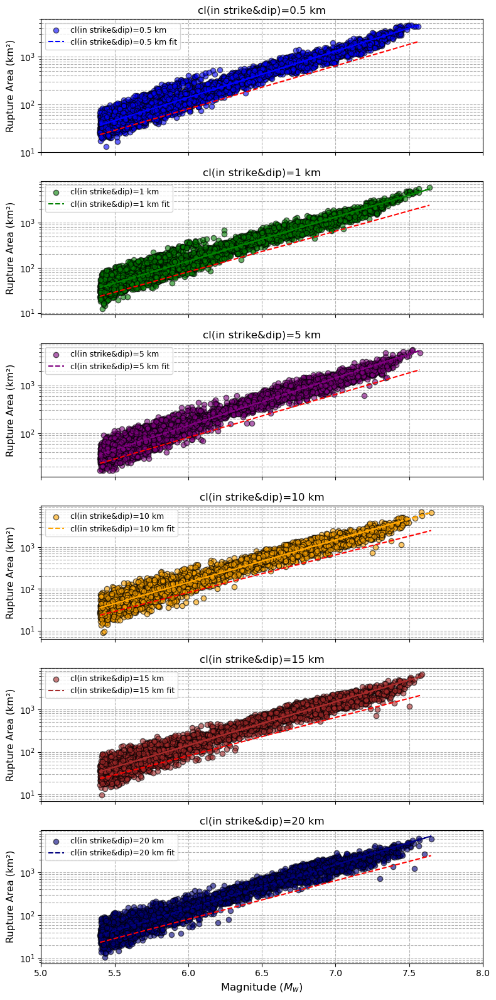

In [259]:
fig, axes = plt.subplots(nrows=6, ncols=1, figsize=(8, 16), sharex=True)

catalogs44 = [
    (cat_mag_cl1, cat_RA_cl1,  'blue',  'cl(in strike&dip)=0.5 km'),
    (cat_mag_cl2, cat_RA_cl2, 'green',  'cl(in strike&dip)=1 km'),
    (cat_mag_cl3, cat_RA_cl3, 'purple',  'cl(in strike&dip)=5 km'),
    (cat_mag_cl4, cat_RA_cl4, 'orange',  'cl(in strike&dip)=10 km'),
    (cat_mag_cl5, cat_RA_cl5, 'brown',  'cl(in strike&dip)=15 km'),
    (cat_mag_cl6, cat_RA_cl6, 'navy',  'cl(in strike&dip)=20 km')
]

for ax, (mags, RAs, color, label) in zip(axes, catalogs44):
    mask = mags >= 5.4
    mags = mags[mask]
    RAs = RAs[mask]
    RAvsM3(mags, RAs, color=color, label=label, ax=ax)

    mags_sorted = np.sort(mags)
    RA_thingbaijam = 10**(-3.49 + 0.90 * mags_sorted)
    ax.plot(mags_sorted, RA_thingbaijam, color='red', linestyle='--', 
            label='Thingbaijam et al. (2017) – SS\n$\\log_{10}(RA) = -3.49 + 0.90M$')

    ax.set_title(label)

axes[-1].set_xlabel('Magnitude ($M_{w}$)', fontsize=12)
plt.xticks(np.arange(5, 8.5, 0.5))
# plt.suptitle('Rupture Area vs Magnitude for Different Dc Values', fontsize=15, y=0.92)
plt.tight_layout()
plt.show()

# ................................hypo depth............................

In [95]:
cat_hypZ_cl1= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/par2_cl1_mat.mat")
cat_hypZ_cl2= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/par2_cl2_mat.mat")
cat_hypZ_cl3= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/par2_cl3_mat.mat")
cat_hypZ_cl4= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/par2_cl4_mat.mat")
cat_hypZ_cl5= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/par2_cl5_mat.mat")
cat_hypZ_cl6= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/par2_cl6_mat.mat")

cl(in strike&dip)=0.5 km:
  Median = -17108.44 MPa
  Mode   = -17763.16 MPa
cl(in strike&dip)=1 km:
  Median = -17102.48 MPa
  Mode   = -17763.16 MPa
cl(in strike&dip)=5 km:
  Median = -17102.47 MPa
  Mode   = -17763.16 MPa
cl(in strike&dip)=10 km:
  Median = -17247.31 MPa
  Mode   = -17763.16 MPa
cl(in strike&dip)=15 km:
  Median = -17247.29 MPa
  Mode   = -17763.16 MPa
cl(in strike&dip)=20 km:
  Median = -17247.34 MPa
  Mode   = -17763.16 MPa


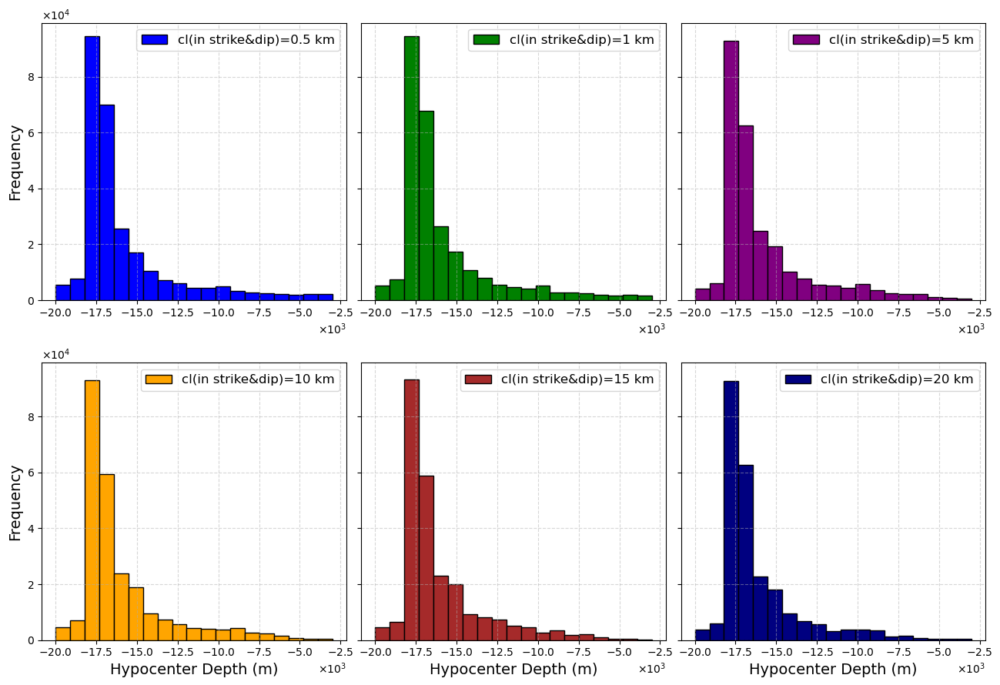

In [97]:
# Histogram bin settings
bin_min = -20000
bin_max = -3000
bin_count = 20
bins = np.linspace(bin_min, bin_max, bin_count)

# Catalogs and labels/colors
catalogs55 = [
    (cat_hypZ_cl1, 'cl(in strike&dip)=0.5 km', 'blue'),
    (cat_hypZ_cl2,   'cl(in strike&dip)=1 km', 'green'),
    (cat_hypZ_cl3,   'cl(in strike&dip)=5 km', 'purple'),
    (cat_hypZ_cl4,   'cl(in strike&dip)=10 km', 'orange'),
    (cat_hypZ_cl5,   'cl(in strike&dip)=15 km', 'brown'),
    (cat_hypZ_cl6,   'cl(in strike&dip)=20 km', 'navy')
]

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(13, 9), sharey=True)
axes = axes.flatten()
# Formatter for scientific notation
x_formatter = ScalarFormatter(useMathText=True)
x_formatter.set_powerlimits((3, 3))  # x10^3

y_formatter = ScalarFormatter(useMathText=True)
y_formatter.set_powerlimits((4, 4))  # x10^4

for ax, (data, label, color) in zip(axes, catalogs55):
    
    ax.hist(data, bins=bins, edgecolor='black', color=color, label=label)

    
    median = np.median(data)

    # Calculate mode based on histogram peak bin
    counts, edges = np.histogram(data, bins=bins)
    mode_bin_index = np.argmax(counts)
    mode = (edges[mode_bin_index] + edges[mode_bin_index + 1]) / 2

    
    print(f"{label}:")
    print(f"  Median = {median:.2f} MPa")
    print(f"  Mode   = {mode:.2f} MPa")
    # Axis formatting
#     ax.set_xlabel('Hypocenter Depth (m)', fontsize=11)
#     ax.set_title(label, fontsize=12)
#     ax.xaxis.set_major_formatter(formatter)
#     ax.yaxis.set_major_formatter(formatter)
#     ax.yaxis.set_major_locator(MultipleLocator(40000))
    
#     ax.ticklabel_format(style='sci', axis='x', scilimits=(3, 3))
#     ax.ticklabel_format(style='sci', axis='both', scilimits=(3, 4))
    ax.xaxis.set_major_formatter(x_formatter)
    ax.yaxis.set_major_formatter(y_formatter)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(loc='upper right', fontsize=12)

# Shared y-axis label
axes[3].set_xlabel('Hypocenter Depth (m)', fontsize=14)
axes[-2].set_xlabel('Hypocenter Depth (m)', fontsize=14)
axes[-1].set_xlabel('Hypocenter Depth (m)', fontsize=14)
axes[0].set_ylabel('Frequency', fontsize=14)
axes[3].set_ylabel('Frequency', fontsize=14)

# Layout and title
# plt.suptitle('Hypocenter Depth Histograms by Dc Value', fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

# ................................mean stress drop............................

In [98]:
cat_mDtau_cl1= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/par2_cl1_mat.mat")
cat_mDtau_cl2= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/par2_cl2_mat.mat")
cat_mDtau_cl3= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/par2_cl3_mat.mat")
cat_mDtau_cl4= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/par2_cl4_mat.mat")
cat_mDtau_cl5= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/par2_cl5_mat.mat")
cat_mDtau_cl6= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/par2_cl6_mat.mat")

cl(in strike&dip)=0.5 km:
  Median = 5.08 MPa
  Mode   = 4.40 MPa
cl(in strike&dip)=1 km:
  Median = 5.04 MPa
  Mode   = 4.40 MPa
cl(in strike&dip)=5 km:
  Median = 4.85 MPa
  Mode   = 4.40 MPa
cl(in strike&dip)=10 km:
  Median = 4.77 MPa
  Mode   = 4.40 MPa
cl(in strike&dip)=15 km:
  Median = 4.72 MPa
  Mode   = 4.40 MPa
cl(in strike&dip)=20 km:
  Median = 4.71 MPa
  Mode   = 4.40 MPa


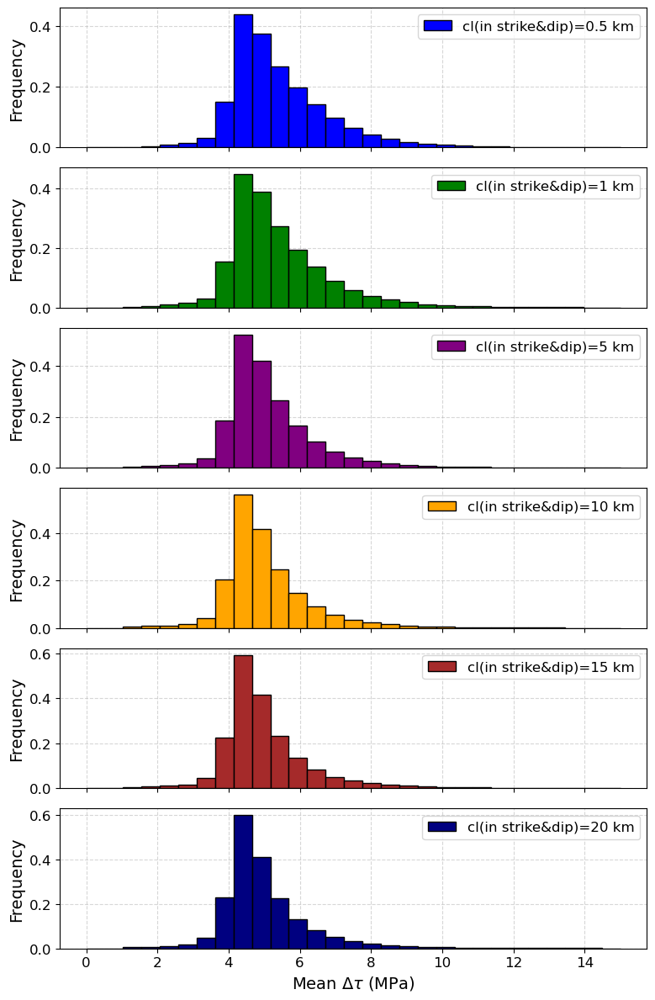

In [105]:
#######subplots of the stress drop#########
from matplotlib.ticker import MultipleLocator, ScalarFormatter

#################
bin_min = 0
bin_max = 15
bin_count = 30
bins = np.linspace(bin_min, bin_max, bin_count)
###################
# Catalogs: (data, label, color)
catalogs66 = [
    (cat_mDtau_cl1, 'blue','cl(in strike&dip)=0.5 km'),
    (cat_mDtau_cl2, 'green', 'cl(in strike&dip)=1 km'),
    (cat_mDtau_cl3, 'purple', 'cl(in strike&dip)=5 km'),
    (cat_mDtau_cl4, 'orange', 'cl(in strike&dip)=10 km'),
    (cat_mDtau_cl5, 'brown', 'cl(in strike&dip)=15 km'),
    (cat_mDtau_cl6, 'navy', 'cl(in strike&dip)=20 km')
]

# Create 4-row, 1-column subplots
fig, axes = plt.subplots(nrows=6, ncols=1, figsize=(8, 12), sharex=True)

# # Formatter for scientific y-axis
# y_formatter = ScalarFormatter(useMathText=True)
# y_formatter.set_powerlimits((4, 4))

for ax, (data, color, label) in zip(axes, catalogs66):
    ax.hist(data, bins=bins, edgecolor='black', color=color, label=label, density=True)
    
    median = np.median(data)

    # Calculate mode based on histogram peak bin
    counts, edges = np.histogram(data, bins=bins)
    mode_bin_index = np.argmax(counts)
    mode = (edges[mode_bin_index] + edges[mode_bin_index + 1]) / 2

    
    print(f"{label}:")
    print(f"  Median = {median:.2f} MPa")
    print(f"  Mode   = {mode:.2f} MPa")
#     ax.axvline(median, color='black', linestyle='--', linewidth=1.2, label='Median')
#     ax.axvline(mode, color='red', linestyle=':', linewidth=1.2, label='Mode')

    ax.set_ylabel('Frequency', fontsize=14)
#     ax.set_title(label, fontsize=12)
#     ax.yaxis.set_major_formatter(y_formatter)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_axisbelow(True)
    ax.legend(loc='upper right', fontsize=12)
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)

# Shared x-axis formatting
axes[-1].set_xlabel('Mean $\\Delta\\tau$ (MPa)', fontsize=14)
axes[-1].xaxis.set_major_locator(MultipleLocator(2))

# Layout
# plt.suptitle('Mean $\\Delta\\tau$ Histograms by Dc Value', fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

# ................................magnitude histograms............................

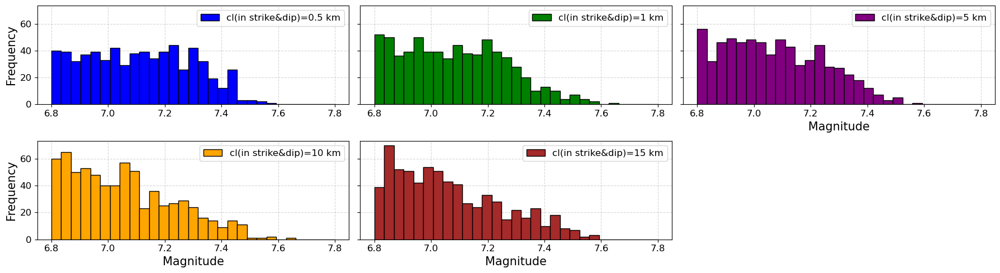

In [109]:
bin_min =6.8
bin_max = 7.8
bin_count = 30
bins = np.linspace(bin_min, bin_max, bin_count)

# Catalogs to plot: (data, label, color)
catalogs77 = [
    (cat_mag_cl1, 'blue',  'cl(in strike&dip)=0.5 km'),
    (cat_mag_cl2, 'green',  'cl(in strike&dip)=1 km'),
    (cat_mag_cl3, 'purple',  'cl(in strike&dip)=5 km'),
    (cat_mag_cl4, 'orange',  'cl(in strike&dip)=10 km'),
    (cat_mag_cl5, 'brown',  'cl(in strike&dip)=15 km'),
    (cat_mag_cl6, 'teal',  'cl(in strike&dip)=20 km')
]

# Create 1 row × 3 column subplot
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 5), sharey=True)
axes = axes.flatten()

for ax, (data, color, label) in zip(axes, catalogs77):
    ax.hist(data, bins=bins, edgecolor='black', color=color, label=label)
#     ax.set_title('model1', fontsize=12)
#     ax.set_xlabel('Magnitude', fontsize=11)
    ax.set_axisbelow(True)
#     ax.yaxis.set_major_locator(MultipleLocator(50000))
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(loc='upper right', fontsize=12)
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)

if len(catalogs33) < len(axes):
    for i in range(len(catalogs33), len(axes)):
        fig.delaxes(axes[i])    
# Y label only on the first plot
axes[3].set_xlabel('Magnitude', fontsize=15)
axes[-2].set_xlabel('Magnitude', fontsize=15)
axes[2].set_xlabel('Magnitude', fontsize=15)
axes[0].set_ylabel('Frequency', fontsize=15)
axes[3].set_ylabel('Frequency', fontsize=15)
# axes[0].yaxis.set_major_locator(MultipleLocator(10))
# Final layout
# plt.suptitle('model1', fontsize=15, y=1.05)
plt.tight_layout()
plt.show()

# ######..........................................***for par_sd***.....................................................

# ................................FMD............................

In [110]:
cat_mag_sd1= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/par2_cl1_mat.mat")
cat_mag_sd2= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/par2_sd1_mat.mat")
cat_mag_sd3= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/par2_sd2_mat.mat")
cat_mag_sd4= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/par2_sd3_mat.mat")
cat_mag_sd5= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/par2_sd4_mat.mat")

$\mu_d$= 0.54: Estimated b-value = 0.92, Mc = 3.45
$\mu_d$= 0.54 Gutenberg–Richter relation:
  log10(N) = 8.73 - 0.92 * M
$\mu_d$= 0.53: Estimated b-value = 0.93, Mc = 3.45
$\mu_d$= 0.53 Gutenberg–Richter relation:
  log10(N) = 8.76 - 0.93 * M
$\mu_d$= 0.52: Estimated b-value = 0.92, Mc = 3.45
$\mu_d$= 0.52 Gutenberg–Richter relation:
  log10(N) = 8.72 - 0.92 * M
$\mu_d$= 0.51: Estimated b-value = 0.96, Mc = 3.45
$\mu_d$= 0.51 Gutenberg–Richter relation:
  log10(N) = 8.94 - 0.96 * M
$\mu_d$= 0.50: Estimated b-value = 0.96, Mc = 3.45
$\mu_d$= 0.50 Gutenberg–Richter relation:
  log10(N) = 8.93 - 0.96 * M


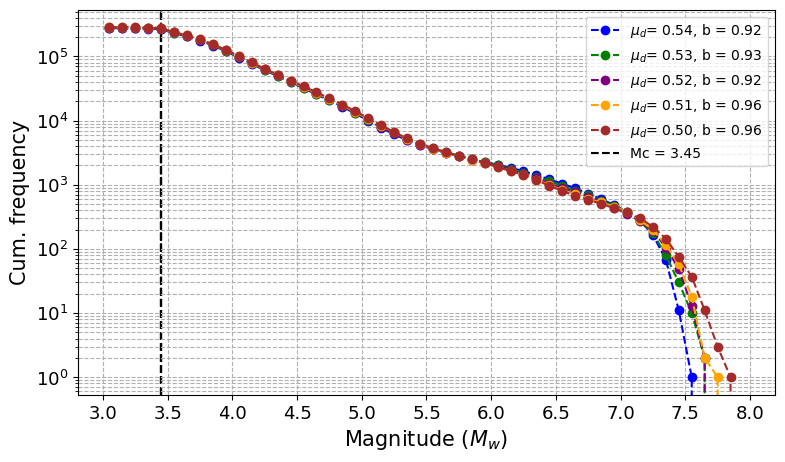

In [112]:
plt.figure(figsize=(9, 5))

# Process each catalog with distinct colors
process_catalog3(cat_mag_sd1, color='blue', label='$\mu_d$= 0.54', bin_width=0.1)
process_catalog3(cat_mag_sd2, color='green', label='$\mu_d$= 0.53', bin_width=0.1)
process_catalog3(cat_mag_sd3, color='purple', label='$\mu_d$= 0.52', bin_width=0.1)
process_catalog3(cat_mag_sd4, color='orange', label='$\mu_d$= 0.51', bin_width=0.1)
process_catalog3(cat_mag_sd5, color='brown', label='$\mu_d$= 0.50', bin_width=0.1, show_mc_legend=True)



plt.xlabel("Magnitude ($M_{w}$)", fontsize=15)
plt.ylabel("Cum. frequency", fontsize=15)
plt.xticks(np.arange(3, 8.5, 0.5), fontsize=13)  
plt.yticks(fontsize=13)
plt.yscale("log")
plt.grid(True, which="both", linestyle="--")
# plt.title("Cumulative Frequency vs Magnitude for Three Catalogs")
plt.legend(loc="best")
plt.show()

# ................................MvsRA............................

In [113]:
cat_RA_sd1= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/par2_cl1_mat.mat")
cat_RA_sd2= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/par2_sd1_mat.mat")
cat_RA_sd3= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/par2_sd2_mat.mat")
cat_RA_sd4= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/par2_sd3_mat.mat")
cat_RA_sd5= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/par2_sd4_mat.mat")

$\mu_d$= 0.54 fitted relation: log10(A) = -5.18 + 1.25 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.31, std = 0.21
$\mu_d$= 0.53 fitted relation: log10(A) = -5.16 + 1.24 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.32, std = 0.21
$\mu_d$= 0.52 fitted relation: log10(A) = -5.15 + 1.24 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.32, std = 0.21
$\mu_d$= 0.51 fitted relation: log10(A) = -5.14 + 1.23 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.33, std = 0.21
$\mu_d$= 0.50 fitted relation: log10(A) = -5.12 + 1.22 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.33, std = 0.21


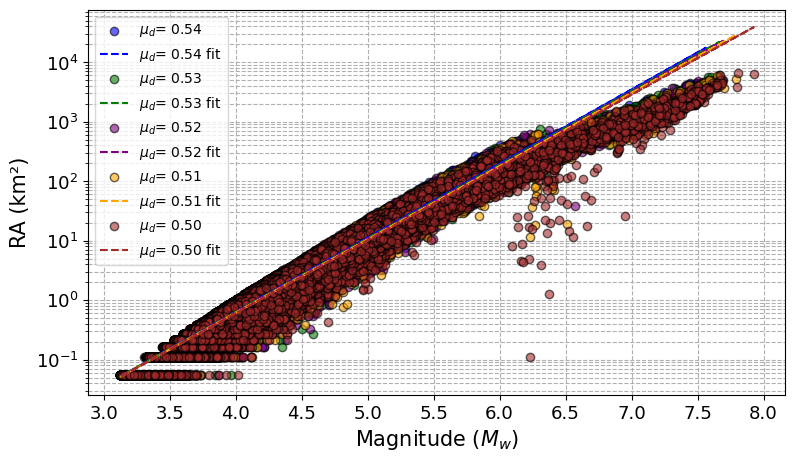

In [114]:
plt.figure(figsize=(9, 5))

RAvsM2(cat_mag_sd1, cat_RA_sd1, color='blue', label= '$\mu_d$= 0.54')
RAvsM2(cat_mag_sd2, cat_RA_sd2, color='green', label= '$\mu_d$= 0.53')
RAvsM2(cat_mag_sd3, cat_RA_sd3, color='purple', label='$\mu_d$= 0.52')
RAvsM2(cat_mag_sd4, cat_RA_sd4, color='orange', label='$\mu_d$= 0.51')
RAvsM2(cat_mag_sd5, cat_RA_sd5, color='brown', label='$\mu_d$= 0.50')



# mags_sorted = np.sort(cat_mag_sd3)
# RA_thingbaijam = 10**(-3.49 + 0.90 * mags_sorted)
# plt.plot(mags_sorted, RA_thingbaijam, color='red', linestyle='--', 
#          label='Thingbaijam et al. (2017)-SS\n$\\log_{10}(RA) = -3.49 + 0.90M$')


# RA_upper = 10**((-3.49 + 0.90 * mags_sorted) + 0.3)  # +1 std
# RA_lower = 10**((-3.49 + 0.90 * mags_sorted) - 0.3)  # -1 std
# plt.fill_between(mags_sorted, RA_lower, RA_upper, color='red', alpha=0.2, label='±1σ')


# Customize the plot
plt.xlabel('Magnitude ($M_{w}$)', fontsize=15)
plt.ylabel('RA (km²)', fontsize=15)
plt.xticks(np.arange(3, 8.5, 0.5), fontsize=13) 
plt.yticks(fontsize=13)
plt.yscale('log')
plt.grid(True, which='both', linestyle='--')  # Grid behind data
# plt.title('RA vs Magnitude')
plt.legend(loc='best')
plt.show()

$\mu_d$= 0.54 fitted relation: log10(A) = -3.66 + 0.97 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.24, std = 0.14
$\mu_d$= 0.53 fitted relation: log10(A) = -3.68 + 0.97 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.22, std = 0.14
$\mu_d$= 0.52 fitted relation: log10(A) = -3.63 + 0.96 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.21, std = 0.14
$\mu_d$= 0.51 fitted relation: log10(A) = -3.62 + 0.95 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.20, std = 0.15
$\mu_d$= 0.50 fitted relation: log10(A) = -3.49 + 0.93 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.17, std = 0.18


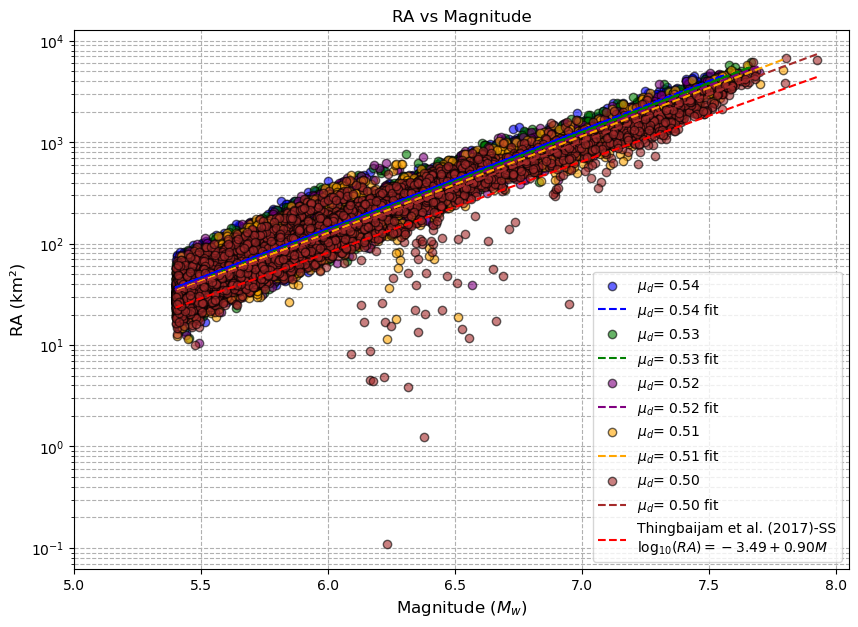

In [275]:
plt.figure(figsize=(10, 7))

RAvsM_fltrd(cat_mag_sd1, cat_RA_sd1, color='blue', label= '$\mu_d$= 0.54')
RAvsM_fltrd(cat_mag_sd2, cat_RA_sd2, color='green', label= '$\mu_d$= 0.53')
RAvsM_fltrd(cat_mag_sd3, cat_RA_sd3, color='purple', label='$\mu_d$= 0.52')
RAvsM_fltrd(cat_mag_sd4, cat_RA_sd4, color='orange', label='$\mu_d$= 0.51')
RAvsM_fltrd(cat_mag_sd5, cat_RA_sd5, color='brown', label='$\mu_d$= 0.50')


mask = cat_mag_sd5 >= 5.4
filtered_mag_sd5 = cat_mag_sd5[mask]
mags_sorted = np.sort(filtered_mag_sd5)

# mags_sorted = np.sort(cat_mag_sd3)
RA_thingbaijam = 10**(-3.49 + 0.90 * mags_sorted)
plt.plot(mags_sorted, RA_thingbaijam, color='red', linestyle='--', 
         label='Thingbaijam et al. (2017)-SS\n$\\log_{10}(RA) = -3.49 + 0.90M$')


# RA_upper = 10**((-3.49 + 0.90 * mags_sorted) + 0.3)  # +1 std
# RA_lower = 10**((-3.49 + 0.90 * mags_sorted) - 0.3)  # -1 std
# plt.fill_between(mags_sorted, RA_lower, RA_upper, color='red', alpha=0.2, label='±1σ')


# Customize the plot
plt.xlabel('Magnitude ($M_{w}$)', fontsize=12)
plt.ylabel('RA (km²)', fontsize=12)
plt.xticks(np.arange(5, 8.5, 0.5)) 
plt.yscale('log')
plt.grid(True, which='both', linestyle='--')  # Grid behind data
plt.title('RA vs Magnitude')
plt.legend(loc='best')
plt.show()






$\mu_d$= 0.54 fitted relation: log10(RA) = -3.66 + 0.97 * M

Residuals vs Thingbaijam et al. (2017) for $\mu_d$= 0.54:
Mean = 0.24, Std = 0.14
$\mu_d$= 0.53 fitted relation: log10(RA) = -3.68 + 0.97 * M

Residuals vs Thingbaijam et al. (2017) for $\mu_d$= 0.53:
Mean = 0.22, Std = 0.14
$\mu_d$= 0.52 fitted relation: log10(RA) = -3.63 + 0.96 * M

Residuals vs Thingbaijam et al. (2017) for $\mu_d$= 0.52:
Mean = 0.21, Std = 0.14
$\mu_d$= 0.51 fitted relation: log10(RA) = -3.62 + 0.95 * M

Residuals vs Thingbaijam et al. (2017) for $\mu_d$= 0.51:
Mean = 0.20, Std = 0.15
$\mu_d$= 0.50 fitted relation: log10(RA) = -3.49 + 0.93 * M

Residuals vs Thingbaijam et al. (2017) for $\mu_d$= 0.50:
Mean = 0.17, Std = 0.18


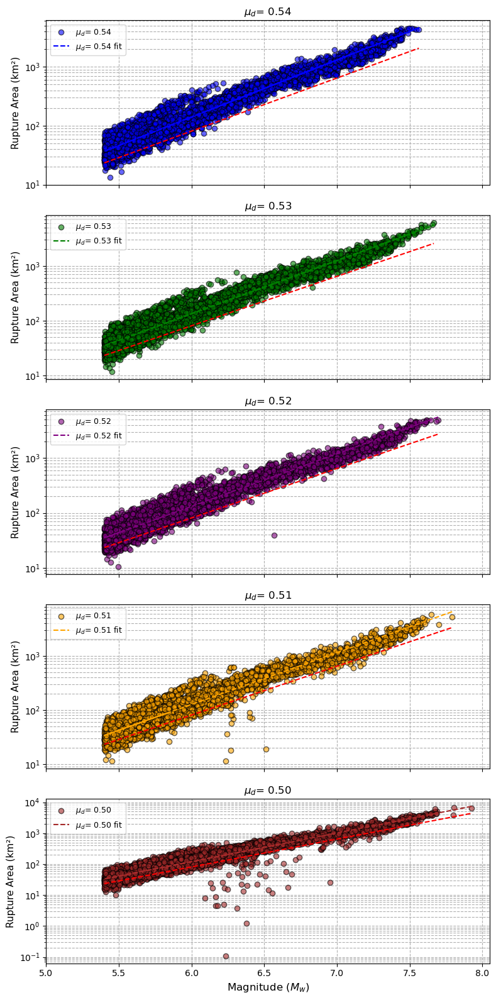

In [271]:
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(8, 16), sharex=True)

catalogs88 = [
    (cat_mag_sd1, cat_RA_sd1,'blue', '$\mu_d$= 0.54'),
    (cat_mag_sd2, cat_RA_sd2,'green', '$\mu_d$= 0.53'),
    (cat_mag_sd3, cat_RA_sd3,'purple','$\mu_d$= 0.52'),
    (cat_mag_sd4, cat_RA_sd4,'orange','$\mu_d$= 0.51'),
    (cat_mag_sd5, cat_RA_sd5,'brown','$\mu_d$= 0.50')
    
]

for ax, (mags, RAs, color, label) in zip(axes, catalogs88):
    
    mask = mags >= 5.4
    mags = mags[mask]
    RAs = RAs[mask]
    
    RAvsM3(mags, RAs, color=color, label=label, ax=ax)

    mags_sorted = np.sort(mags)
    RA_thingbaijam = 10**(-3.49 + 0.90 * mags_sorted)
    ax.plot(mags_sorted, RA_thingbaijam, color='red', linestyle='--', 
            label='Thingbaijam et al. (2017) – SS\n$\\log_{10}(RA) = -3.49 + 0.90M$')

    ax.set_title(label)

axes[-1].set_xlabel('Magnitude ($M_{w}$)', fontsize=12)
plt.xticks(np.arange(5, 8.5, 0.5))
# plt.suptitle('Rupture Area vs Magnitude for Different Dc Values', fontsize=15, y=0.92)
plt.tight_layout()
plt.show()

# ................................hypo depth............................

In [38]:
cat_hypZ_sd1= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/par2_cl1_mat.mat")
cat_hypZ_sd2= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/par2_sd1_mat.mat")
cat_hypZ_sd3= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/par2_sd2_mat.mat")
cat_hypZ_sd4= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/par2_sd3_mat.mat")
cat_hypZ_sd5= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/par2_sd4_mat.mat")

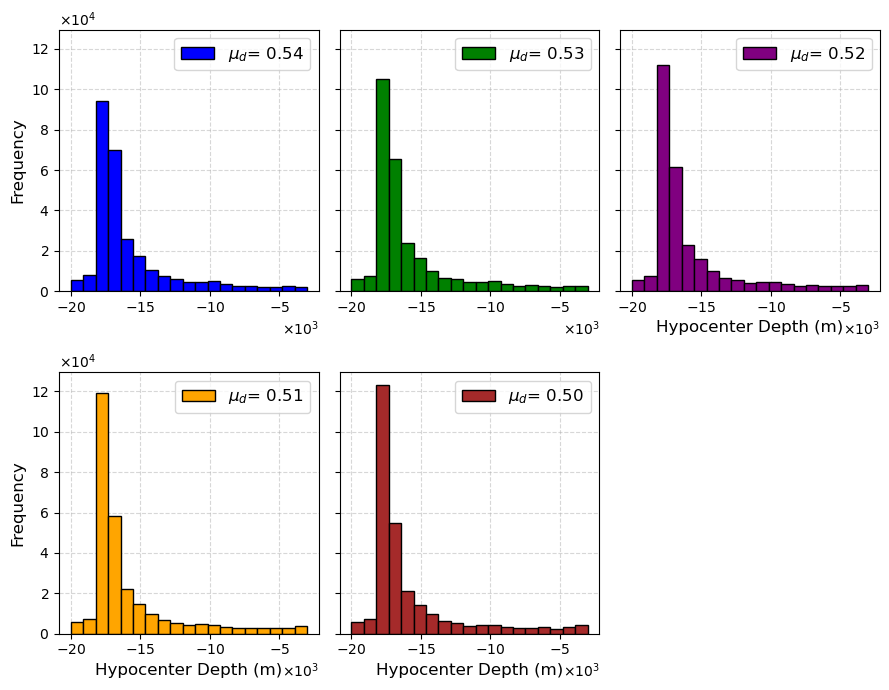

In [39]:
# Histogram bin settings
bin_min = -20000
bin_max = -3000
bin_count = 20
bins = np.linspace(bin_min, bin_max, bin_count)

# Catalogs and labels/colors
catalogs99 = [
    (cat_hypZ_sd1,'blue', '$\mu_d$= 0.54'),
    (cat_hypZ_sd2,'green', '$\mu_d$= 0.53'),
    (cat_hypZ_sd3,'purple','$\mu_d$= 0.52'),
    (cat_hypZ_sd4,'orange','$\mu_d$= 0.51'),
    (cat_hypZ_sd5,'brown','$\mu_d$= 0.50')
]

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(9, 7), sharey=True)
axes = axes.flatten()
# Formatter for scientific notation
x_formatter = ScalarFormatter(useMathText=True)
x_formatter.set_powerlimits((3, 3))  # x10^3

y_formatter = ScalarFormatter(useMathText=True)
y_formatter.set_powerlimits((4, 4))  # x10^4

for ax, (data, color, label) in zip(axes, catalogs99):
    
    ax.hist(data, bins=bins, edgecolor='black', color=color, label=label)

    # Axis formatting
#     ax.set_xlabel('Hypocenter Depth (m)', fontsize=11)
#     ax.set_title(label, fontsize=12)

#     ax.xaxis.set_major_formatter(formatter)
#     ax.yaxis.set_major_formatter(formatter)
#     ax.yaxis.set_major_locator(MultipleLocator(40000))
    
#     ax.ticklabel_format(style='sci', axis='x', scilimits=(3, 3))
#     ax.ticklabel_format(style='sci', axis='both', scilimits=(3, 4))
    ax.xaxis.set_major_formatter(x_formatter)
    ax.yaxis.set_major_formatter(y_formatter)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(loc='upper right', fontsize=12)
    ax.set_axisbelow(True)

if len(catalogs99) < len(axes):
    for i in range(len(catalogs99), len(axes)):
        fig.delaxes(axes[i]) 
# Shared y-axis label
axes[0].set_ylabel('Frequency', fontsize=12)
axes[3].set_ylabel('Frequency', fontsize=12)
# axes[1].set_xlabel('Hypocenter Depth (m)', fontsize=12)
axes[2].set_xlabel('Hypocenter Depth (m)', fontsize=12)
axes[3].set_xlabel('Hypocenter Depth (m)', fontsize=12)
axes[4].set_xlabel('Hypocenter Depth (m)', fontsize=12)

# Layout and title
# plt.suptitle('Hypocenter Depth Histograms by Dc Value', fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

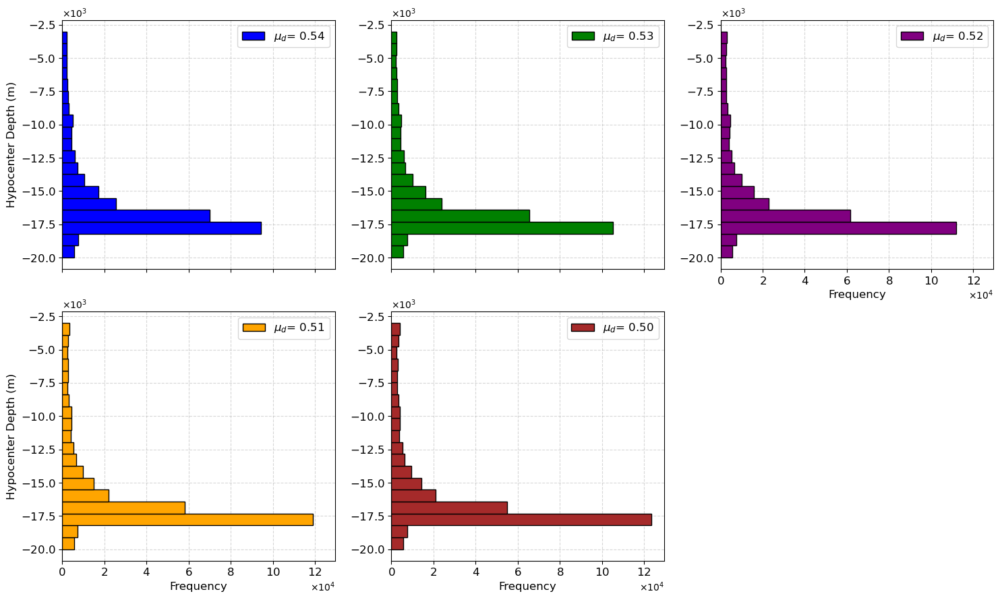

In [41]:
# Histogram bin settings
bin_min = -20000
bin_max = -3000
bin_count = 20
bins = np.linspace(bin_min, bin_max, bin_count)

# Catalogs and labels/colors
catalogs99 = [
    (cat_hypZ_sd1, 'blue', '$\mu_d$= 0.54'),
    (cat_hypZ_sd2, 'green', '$\mu_d$= 0.53'),
    (cat_hypZ_sd3, 'purple', '$\mu_d$= 0.52'),
    (cat_hypZ_sd4, 'orange', '$\mu_d$= 0.51'),
    (cat_hypZ_sd5, 'brown', '$\mu_d$= 0.50')
]

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 9), sharex=True)
axes = axes.flatten()

# Formatter for scientific notation
x_formatter = ScalarFormatter(useMathText=True)
x_formatter.set_powerlimits((4, 4))  # Frequency axis (x)

y_formatter = ScalarFormatter(useMathText=True)
y_formatter.set_powerlimits((3, 3))  # Depth axis (y)

for ax, (data, color, label) in zip(axes, catalogs99):
    ax.hist(data, bins=bins, edgecolor='black', color=color, label=label, orientation='horizontal')

    # Axis formatting
    ax.xaxis.set_major_formatter(x_formatter)
    ax.yaxis.set_major_formatter(y_formatter)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(loc='upper right', fontsize=12)
    ax.set_axisbelow(True)
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)

# Remove any unused axes
if len(catalogs99) < len(axes):
    for i in range(len(catalogs99), len(axes)):
        fig.delaxes(axes[i])

# Axis labels
# x-axis labels for bottom row + axes[2] (mu_d=0.52 on top right)
axes[2].set_xlabel('Frequency', fontsize=12)
axes[2].tick_params(axis='x', labelbottom=True)  # show x ticks

axes[3].set_xlabel('Frequency', fontsize=12)
axes[4].set_xlabel('Frequency', fontsize=12)
axes[5].set_xlabel('Frequency', fontsize=12)

# y-axis labels for leftmost plots
axes[0].set_ylabel('Hypocenter Depth (m)', fontsize=12)
axes[3].set_ylabel('Hypocenter Depth (m)', fontsize=12)

# Layout
plt.tight_layout()
plt.show()


# ................................mean stress drop............................

In [122]:
cat_mDtau_sd1= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/par2_cl1_mat.mat")
cat_mDtau_sd2= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/par2_sd1_mat.mat")
cat_mDtau_sd3= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/par2_sd2_mat.mat")
cat_mDtau_sd4= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/par2_sd3_mat.mat")
cat_mDtau_sd5= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/par2_sd4_mat.mat")

$\mu_d$= 0.54:
  Median = 5.08 MPa
  Mode   = 4.40 MPa
$\mu_d$= 0.53:
  Median = 5.14 MPa
  Mode   = 4.40 MPa
$\mu_d$= 0.52:
  Median = 5.19 MPa
  Mode   = 4.40 MPa
$\mu_d$= 0.51:
  Median = 5.24 MPa
  Mode   = 4.40 MPa
$\mu_d$= 0.50:
  Median = 5.29 MPa
  Mode   = 4.40 MPa


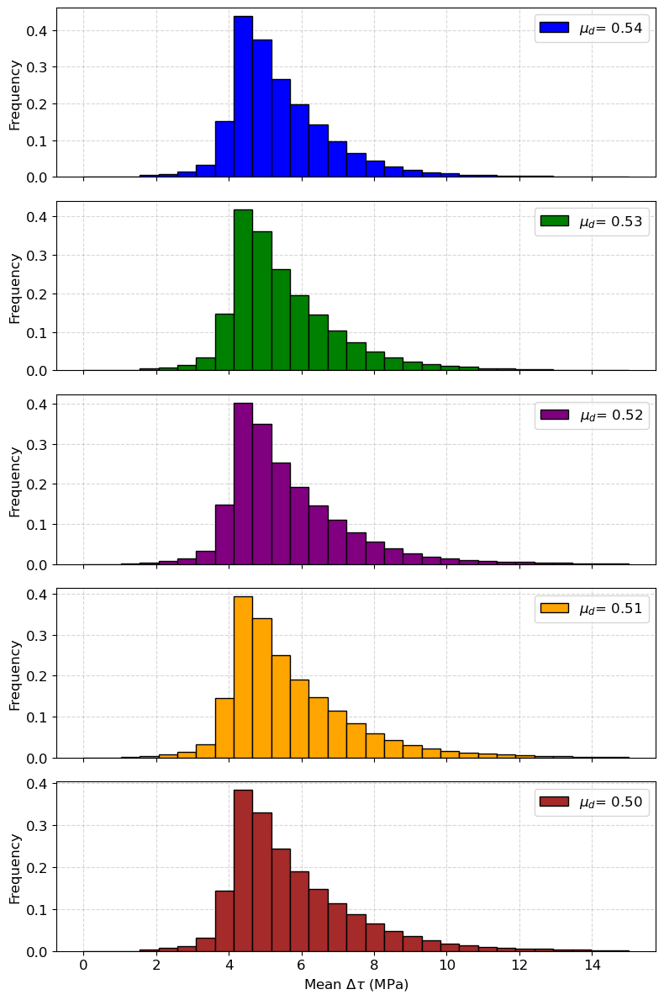

In [127]:
#######subplots of the stress drop#########
from matplotlib.ticker import MultipleLocator, ScalarFormatter

#################
bin_min = 0
bin_max = 15
bin_count = 30
bins = np.linspace(bin_min, bin_max, bin_count)
###################
# Catalogs: (data, label, color)
catalogs111 = [
    (cat_mDtau_sd1, 'blue',  '$\mu_d$= 0.54'),
    (cat_mDtau_sd2, 'green',  '$\mu_d$= 0.53'),
    (cat_mDtau_sd3, 'purple', '$\mu_d$= 0.52'),
    (cat_mDtau_sd4, 'orange', '$\mu_d$= 0.51'),
    (cat_mDtau_sd5, 'brown', '$\mu_d$= 0.50')
]

# Create 4-row, 1-column subplots
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(8, 12), sharex=True)

# # Formatter for scientific y-axis
# y_formatter = ScalarFormatter(useMathText=True)
# y_formatter.set_powerlimits((4, 4))

for ax, (data, color, label) in zip(axes, catalogs111):
    ax.hist(data, bins=bins, edgecolor='black', color=color, label=label, density=True)
    
    median = np.median(data)

    # Calculate mode based on histogram peak bin
    counts, edges = np.histogram(data, bins=bins)
    mode_bin_index = np.argmax(counts)
    mode = (edges[mode_bin_index] + edges[mode_bin_index + 1]) / 2

    
    print(f"{label}:")
    print(f"  Median = {median:.2f} MPa")
    print(f"  Mode   = {mode:.2f} MPa")
#     ax.axvline(median, color='black', linestyle='--', linewidth=1.2, label='Median')
#     ax.axvline(mode, color='red', linestyle=':', linewidth=1.2, label='Mode')

    ax.set_ylabel('Frequency', fontsize=12)
#     ax.set_title(label, fontsize=12)
#     ax.yaxis.set_major_formatter(y_formatter)""
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_axisbelow(True)
    ax.legend(loc='upper right', fontsize=12)
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)

# Shared x-axis formatting
axes[-1].set_xlabel('Mean $\\Delta\\tau$ (MPa)', fontsize=12)
axes[-1].xaxis.set_major_locator(MultipleLocator(2))

# Layout
# plt.suptitle('Mean $\\Delta\\tau$ Histograms by Dc Value', fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

# ................................magnitude histograms............................

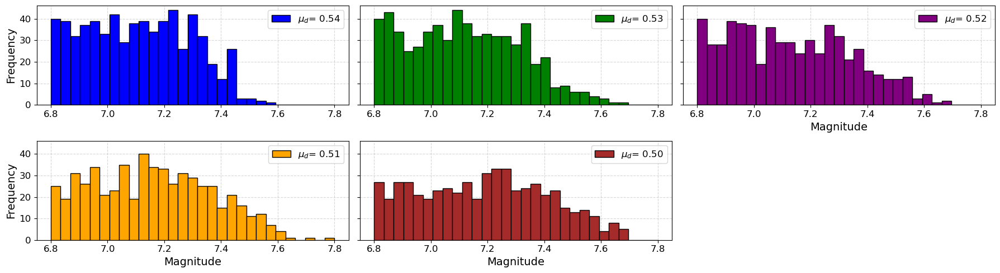

In [128]:
bin_min =6.8
bin_max = 7.8
bin_count = 30
bins = np.linspace(bin_min, bin_max, bin_count)

# Catalogs to plot: (data, label, color)
catalogs222 = [
    (cat_mag_sd1,'blue', '$\mu_d$= 0.54'),
    (cat_mag_sd2,'green', '$\mu_d$= 0.53'),
    (cat_mag_sd3,'purple','$\mu_d$= 0.52'),
    (cat_mag_sd4,'orange','$\mu_d$= 0.51'),
    (cat_mag_sd5,'brown','$\mu_d$= 0.50')
]

# Create 1 row × 3 column subplot
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 5), sharey=True)
axes = axes.flatten()

for ax, (data, color, label) in zip(axes, catalogs222):
    ax.hist(data, bins=bins, edgecolor='black', color=color, label=label)
#     ax.set_title('model1', fontsize=12)
#     ax.set_xlabel('Magnitude', fontsize=11)
    ax.set_axisbelow(True)
#     ax.yaxis.set_major_locator(MultipleLocator(50000))
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(loc='upper right', fontsize=12)
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)

if len(catalogs222) < len(axes):
    for i in range(len(catalogs222), len(axes)):
        fig.delaxes(axes[i])    
# Y label only on the first plot
axes[3].set_xlabel('Magnitude', fontsize=14)
axes[-2].set_xlabel('Magnitude', fontsize=14)
axes[2].set_xlabel('Magnitude', fontsize=14)
axes[0].set_ylabel('Frequency', fontsize=14)
axes[3].set_ylabel('Frequency', fontsize=14)
# axes[0].yaxis.set_major_locator(MultipleLocator(10))
# Final layout
# plt.suptitle('model1', fontsize=15, y=1.05)
plt.tight_layout()
plt.show()

# ######..........................................***for healing***...................................................

# ................................FMD............................

In [23]:
cat_mag_h1= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/eaf_h1.mat")
cat_mag_h2= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/eaf_h3.mat")
cat_mag_h3= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/eaf_new_h4.mat")
cat_mag_h4= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/eaf_new_h2.mat")
cat_mag_h5= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/eaf_new_h5.mat")

h= 0.01: Estimated b-value = 0.93, Mc = 3.45
h= 0.01 Gutenberg–Richter relation:
  log10(N) = 8.86 - 0.93 * M
h= 0.03: Estimated b-value = 0.92, Mc = 3.45
h= 0.03 Gutenberg–Richter relation:
  log10(N) = 8.83 - 0.92 * M
h= 0.05: Estimated b-value = 0.93, Mc = 3.45
h= 0.05 Gutenberg–Richter relation:
  log10(N) = 8.88 - 0.93 * M
h= 0.08: Estimated b-value = 0.94, Mc = 3.45
h= 0.08 Gutenberg–Richter relation:
  log10(N) = 8.94 - 0.94 * M
h= 0.1: Estimated b-value = 0.94, Mc = 3.45
h= 0.1 Gutenberg–Richter relation:
  log10(N) = 8.95 - 0.94 * M


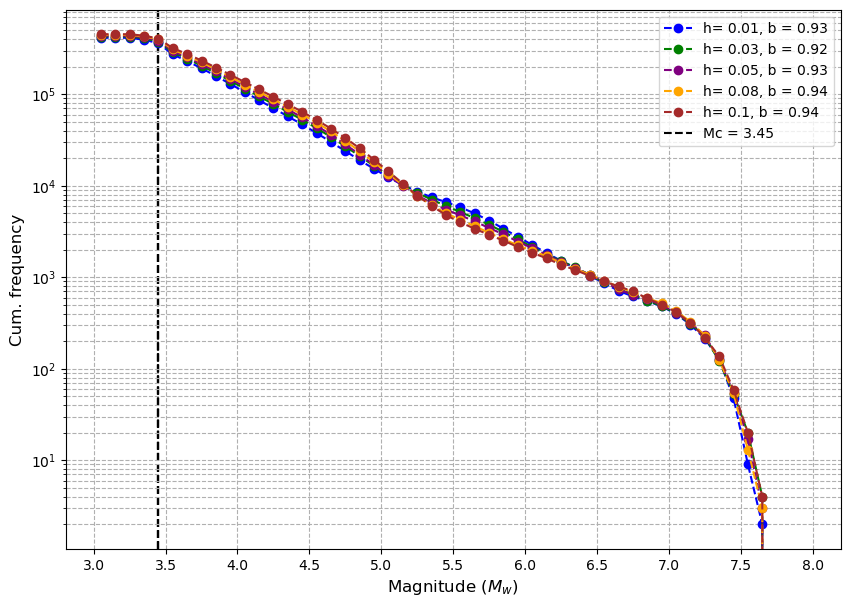

In [24]:
plt.figure(figsize=(10, 7))

# Process each catalog with distinct colors
process_catalog3(cat_mag_h1, color='blue', label='h= 0.01', bin_width=0.1)
process_catalog3(cat_mag_h2, color='green', label='h= 0.03', bin_width=0.1)
process_catalog3(cat_mag_h3, color='purple', label='h= 0.05', bin_width=0.1)
process_catalog3(cat_mag_h4, color='orange', label='h= 0.08', bin_width=0.1)
process_catalog3(cat_mag_h5, color='brown', label='h= 0.1', bin_width=0.1, show_mc_legend=True)



plt.xlabel("Magnitude ($M_{w}$)", fontsize=12)
plt.ylabel("Cum. frequency", fontsize=12)
plt.xticks(np.arange(3, 8.5, 0.5))  
plt.yscale("log")
plt.grid(True, which="both", linestyle="--")
# plt.title("Cumulative Frequency vs Magnitude for Three Catalogs")
plt.legend(loc="best")
plt.show()

# ................................MvsRA............................

In [25]:
cat_RA_h1= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/eaf_h1.mat")
cat_RA_h2= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/eaf_h3.mat")
cat_RA_h3= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/eaf_new_h4.mat")
cat_RA_h4= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/eaf_new_h2.mat")
cat_RA_h5= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/eaf_new_h5.mat")

h= 0.01 fitted relation: log10(A) = -4.84 + 1.19 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.23, std = 0.20
h= 0.03 fitted relation: log10(A) = -4.90 + 1.21 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.21, std = 0.21
h= 0.05 fitted relation: log10(A) = -4.95 + 1.23 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.20, std = 0.22
h= 0.08 fitted relation: log10(A) = -5.02 + 1.25 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.18, std = 0.23
h= 0.1 fitted relation: log10(A) = -5.06 + 1.26 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.17, std = 0.24


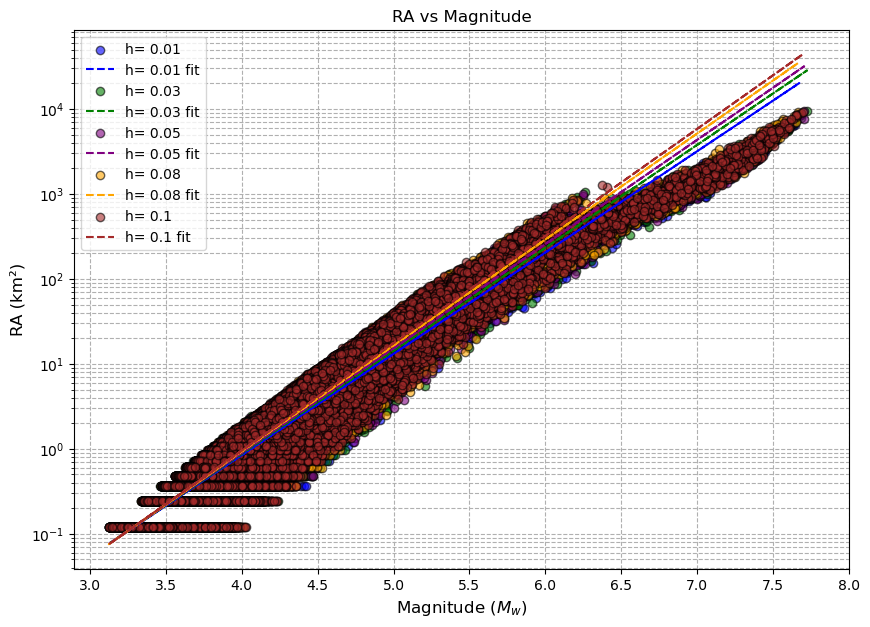

In [26]:
plt.figure(figsize=(10, 7))

RAvsM2(cat_mag_h1, cat_RA_h1, color='blue', label= 'h= 0.01')
RAvsM2(cat_mag_h2, cat_RA_h2, color='green', label= 'h= 0.03')
RAvsM2(cat_mag_h3, cat_RA_h3, color='purple', label='h= 0.05')
RAvsM2(cat_mag_h4, cat_RA_h4, color='orange', label='h= 0.08')
RAvsM2(cat_mag_h5, cat_RA_h5, color='brown', label='h= 0.1')



# mags_sorted = np.sort(cat_mag_sd3)
# RA_thingbaijam = 10**(-3.49 + 0.90 * mags_sorted)
# plt.plot(mags_sorted, RA_thingbaijam, color='red', linestyle='--', 
#          label='Thingbaijam et al. (2017)-SS\n$\\log_{10}(RA) = -3.49 + 0.90M$')


# RA_upper = 10**((-3.49 + 0.90 * mags_sorted) + 0.3)  # +1 std
# RA_lower = 10**((-3.49 + 0.90 * mags_sorted) - 0.3)  # -1 std
# plt.fill_between(mags_sorted, RA_lower, RA_upper, color='red', alpha=0.2, label='±1σ')


# Customize the plot
plt.xlabel('Magnitude ($M_{w}$)', fontsize=12)
plt.ylabel('RA (km²)', fontsize=12)
plt.xticks(np.arange(3, 8.5, 0.5)) 
plt.yscale('log')
plt.grid(True, which='both', linestyle='--')  # Grid behind data
plt.title('RA vs Magnitude')
plt.legend(loc='best')
plt.show()

h= 0.01 fitted relation: log10(A) = -3.26 + 0.92 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.35, std = 0.17
h= 0.03 fitted relation: log10(A) = -3.21 + 0.91 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.37, std = 0.17
h= 0.05 fitted relation: log10(A) = -3.05 + 0.89 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.39, std = 0.16
h= 0.08 fitted relation: log10(A) = -2.90 + 0.87 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.42, std = 0.16
h= 0.1 fitted relation: log10(A) = -2.94 + 0.88 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.42, std = 0.16


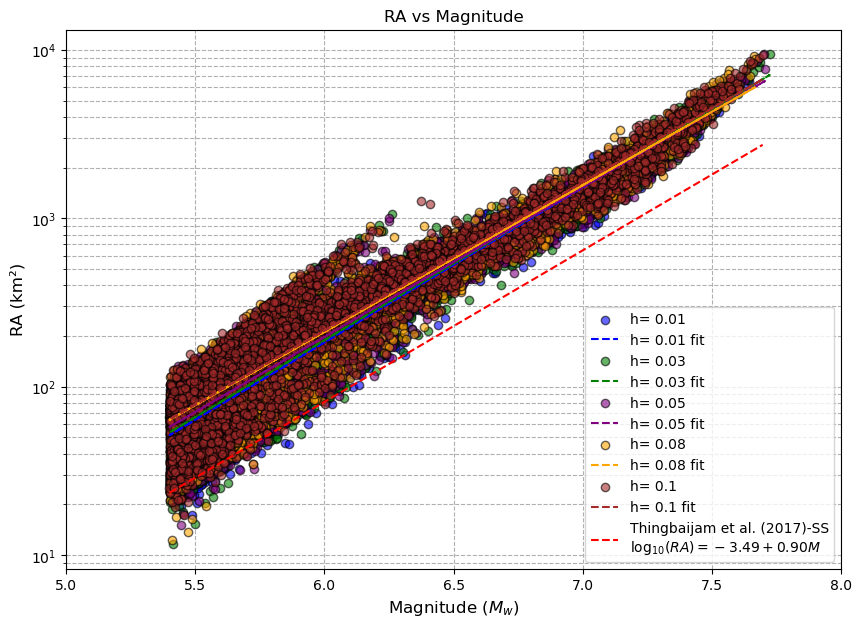

In [27]:
plt.figure(figsize=(10, 7))

RAvsM_fltrd(cat_mag_h1, cat_RA_h1, color='blue', label= 'h= 0.01')
RAvsM_fltrd(cat_mag_h2, cat_RA_h2, color='green', label= 'h= 0.03')
RAvsM_fltrd(cat_mag_h3, cat_RA_h3, color='purple', label='h= 0.05')
RAvsM_fltrd(cat_mag_h4, cat_RA_h4, color='orange', label='h= 0.08')
RAvsM_fltrd(cat_mag_h5, cat_RA_h5, color='brown', label='h= 0.1')


mask = cat_mag_h5 >= 5.4
filtered_mag_h5 = cat_mag_h5[mask]
mags_sorted = np.sort(filtered_mag_h5)

# mags_sorted = np.sort(cat_mag_sd3)
RA_thingbaijam = 10**(-3.49 + 0.90 * mags_sorted)
plt.plot(mags_sorted, RA_thingbaijam, color='red', linestyle='--', 
         label='Thingbaijam et al. (2017)-SS\n$\\log_{10}(RA) = -3.49 + 0.90M$')


# RA_upper = 10**((-3.49 + 0.90 * mags_sorted) + 0.3)  # +1 std
# RA_lower = 10**((-3.49 + 0.90 * mags_sorted) - 0.3)  # -1 std
# plt.fill_between(mags_sorted, RA_lower, RA_upper, color='red', alpha=0.2, label='±1σ')


# Customize the plot
plt.xlabel('Magnitude ($M_{w}$)', fontsize=12)
plt.ylabel('RA (km²)', fontsize=12)
plt.xticks(np.arange(5, 8.5, 0.5)) 
plt.yscale('log')
plt.grid(True, which='both', linestyle='--')  # Grid behind data
plt.title('RA vs Magnitude')
plt.legend(loc='best')
plt.show()

h= 0.01 fitted relation: log10(RA) = -3.26 + 0.92 * M

Residuals vs Thingbaijam et al. (2017) for h= 0.01:
Mean = 0.35, Std = 0.17
h= 0.03 fitted relation: log10(RA) = -3.21 + 0.91 * M

Residuals vs Thingbaijam et al. (2017) for h= 0.03:
Mean = 0.37, Std = 0.17
h= 0.05 fitted relation: log10(RA) = -3.05 + 0.89 * M

Residuals vs Thingbaijam et al. (2017) for h= 0.05:
Mean = 0.39, Std = 0.16
h= 0.08 fitted relation: log10(RA) = -2.90 + 0.87 * M

Residuals vs Thingbaijam et al. (2017) for h= 0.08:
Mean = 0.42, Std = 0.16
h= 0.1 fitted relation: log10(RA) = -2.94 + 0.88 * M

Residuals vs Thingbaijam et al. (2017) for h= 0.1:
Mean = 0.42, Std = 0.16


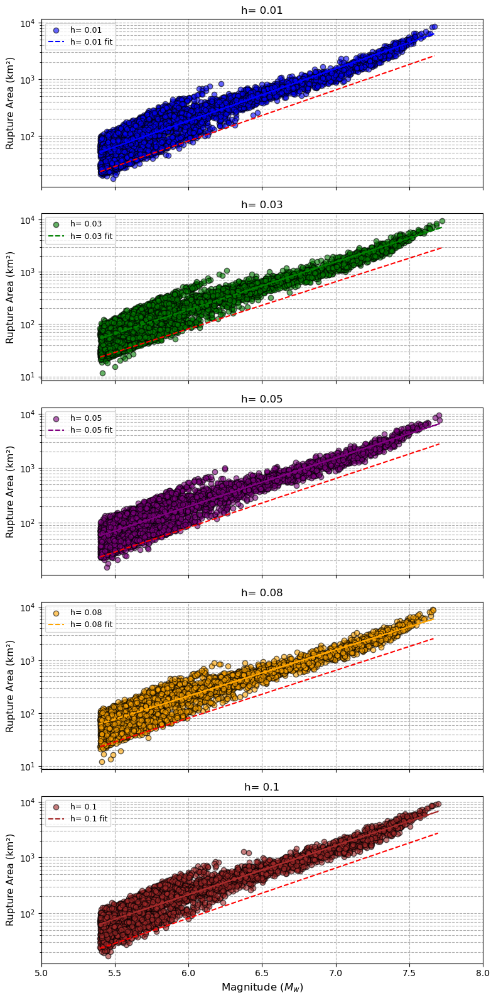

In [28]:
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(8, 16), sharex=True)

catalogs333 = [
    (cat_mag_h1, cat_RA_h1,'blue', 'h= 0.01'),
    (cat_mag_h2, cat_RA_h2,'green', 'h= 0.03'),
    (cat_mag_h3, cat_RA_h3,'purple','h= 0.05'),
    (cat_mag_h4, cat_RA_h4,'orange','h= 0.08'),
    (cat_mag_h5, cat_RA_h5,'brown','h= 0.1')
    
]

for ax, (mags, RAs, color, label) in zip(axes, catalogs333):
    
    mask = mags >= 5.4
    mags = mags[mask]
    RAs = RAs[mask]
    
    RAvsM3(mags, RAs, color=color, label=label, ax=ax)

    mags_sorted = np.sort(mags)
    RA_thingbaijam = 10**(-3.49 + 0.90 * mags_sorted)
    ax.plot(mags_sorted, RA_thingbaijam, color='red', linestyle='--', 
            label='Thingbaijam et al. (2017) – SS\n$\\log_{10}(RA) = -3.49 + 0.90M$')

    ax.set_title(label)

axes[-1].set_xlabel('Magnitude ($M_{w}$)', fontsize=12)
plt.xticks(np.arange(5, 8.5, 0.5))
# plt.suptitle('Rupture Area vs Magnitude for Different Dc Values', fontsize=15, y=0.92)
plt.tight_layout()
plt.show()

# ................................hypo depth............................

In [29]:
cat_hypZ_h1= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/eaf_h1.mat")
cat_hypZ_h2= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/eaf_h3.mat")
cat_hypZ_h3= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/eaf_new_h4.mat")
cat_hypZ_h4= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/eaf_new_h2.mat")
cat_hypZ_h5= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/eaf_new_h5.mat")

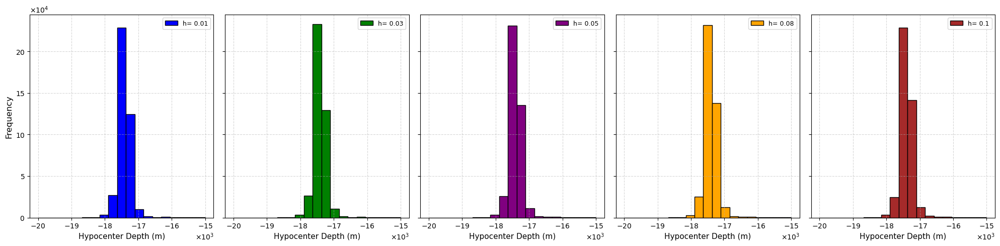

In [37]:
# Histogram bin settings
bin_min = -20000
bin_max = -15000
bin_count = 20
bins = np.linspace(bin_min, bin_max, bin_count)

# Catalogs and labels/colors
catalogs444 = [
    (cat_hypZ_h1,'blue', 'h= 0.01'),
    (cat_hypZ_h2,'green', 'h= 0.03'),
    (cat_hypZ_h3,'purple','h= 0.05'),
    (cat_hypZ_h4,'orange','h= 0.08'),
    (cat_hypZ_h5,'brown','h= 0.1')
]

fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20, 5), sharey=True)
axes = axes.flatten()
# Formatter for scientific notation
x_formatter = ScalarFormatter(useMathText=True)
x_formatter.set_powerlimits((3, 3))  # x10^3

y_formatter = ScalarFormatter(useMathText=True)
y_formatter.set_powerlimits((4, 4))  # x10^4

for ax, (data, color, label) in zip(axes, catalogs444):
    
    ax.hist(data, bins=bins, edgecolor='black', color=color, label=label)

    # Axis formatting
    ax.set_xlabel('Hypocenter Depth (m)', fontsize=11)
#     ax.set_title(label, fontsize=12)
#     ax.xaxis.set_major_formatter(formatter)
#     ax.yaxis.set_major_formatter(formatter)
#     ax.yaxis.set_major_locator(MultipleLocator(40000))
    
#     ax.ticklabel_format(style='sci', axis='x', scilimits=(3, 3))
#     ax.ticklabel_format(style='sci', axis='both', scilimits=(3, 4))
    ax.xaxis.set_major_formatter(x_formatter)
    ax.yaxis.set_major_formatter(y_formatter)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(loc='upper right', fontsize=9)

# Shared y-axis label
axes[0].set_ylabel('Frequency', fontsize=12)

# Layout and title
# plt.suptitle('Hypocenter Depth Histograms by Dc Value', fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

# ................................mean stress drop............................


In [38]:
cat_mDtau_h1= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/eaf_h1.mat")
cat_mDtau_h2= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/eaf_h3.mat")
cat_mDtau_h3= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/eaf_new_h4.mat")
cat_mDtau_h4= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/eaf_new_h2.mat")
cat_mDtau_h5= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/eaf_new_h5.mat")

h= 0.01:
  Median = 3.41 MPa
  Mode   = 2.84 MPa
h= 0.03:
  Median = 3.33 MPa
  Mode   = 2.84 MPa
h= 0.05:
  Median = 3.27 MPa
  Mode   = 2.84 MPa
h= 0.08:
  Median = 3.20 MPa
  Mode   = 2.84 MPa
h= 0.1:
  Median = 3.14 MPa
  Mode   = 2.84 MPa


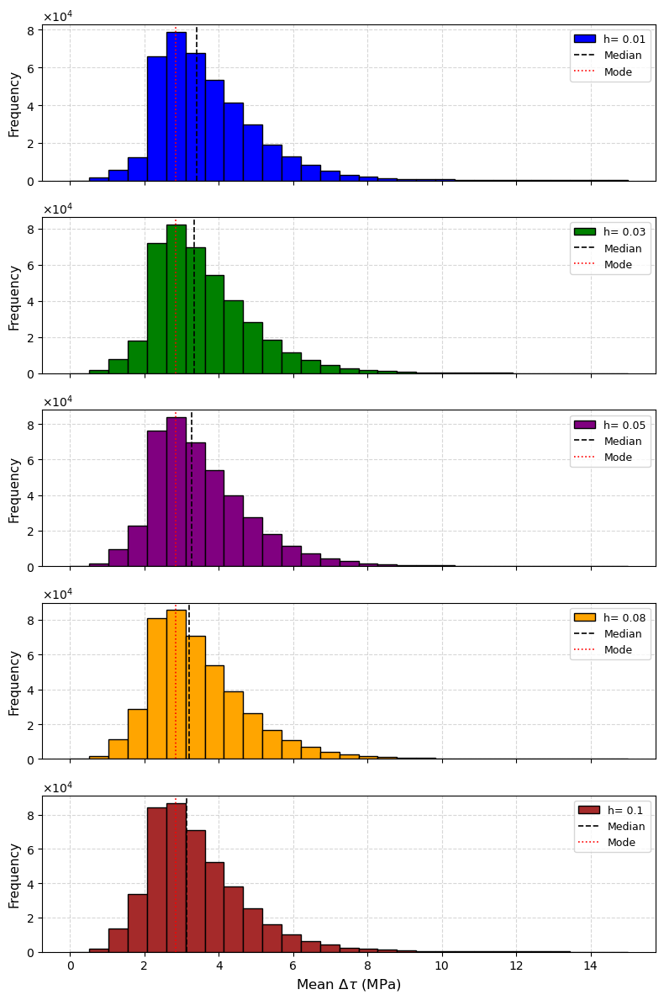

In [39]:
#######subplots of the stress drop#########
from matplotlib.ticker import MultipleLocator, ScalarFormatter

#################
bin_min = 0
bin_max = 15
bin_count = 30
bins = np.linspace(bin_min, bin_max, bin_count)
###################
# Catalogs: (data, label, color)
catalogs555 = [
    (cat_mDtau_h1,'blue', 'h= 0.01'),
    (cat_mDtau_h2,'green', 'h= 0.03'),
    (cat_mDtau_h3,'purple','h= 0.05'),
    (cat_mDtau_h4,'orange','h= 0.08'),
    (cat_mDtau_h5,'brown','h= 0.1')
]

# Create 4-row, 1-column subplots
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(8, 12), sharex=True)

# Formatter for scientific y-axis
y_formatter = ScalarFormatter(useMathText=True)
y_formatter.set_powerlimits((4, 4))

for ax, (data, color, label) in zip(axes, catalogs555):
    ax.hist(data, bins=bins, edgecolor='black', color=color, label=label)
    
    median = np.median(data)

    # Calculate mode based on histogram peak bin
    counts, edges = np.histogram(data, bins=bins)
    mode_bin_index = np.argmax(counts)
    mode = (edges[mode_bin_index] + edges[mode_bin_index + 1]) / 2

    
    print(f"{label}:")
    print(f"  Median = {median:.2f} MPa")
    print(f"  Mode   = {mode:.2f} MPa")
    ax.axvline(median, color='black', linestyle='--', linewidth=1.2, label='Median')
    ax.axvline(mode, color='red', linestyle=':', linewidth=1.2, label='Mode')

    ax.set_ylabel('Frequency', fontsize=11)
#     ax.set_title(label, fontsize=12)
    ax.yaxis.set_major_formatter(y_formatter)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_axisbelow(True)
    ax.legend(loc='upper right', fontsize=9)

# Shared x-axis formatting
axes[-1].set_xlabel('Mean $\\Delta\\tau$ (MPa)', fontsize=12)
axes[-1].xaxis.set_major_locator(MultipleLocator(2))

# Layout
# plt.suptitle('Mean $\\Delta\\tau$ Histograms by Dc Value', fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

# ................................magnitude histograms............................

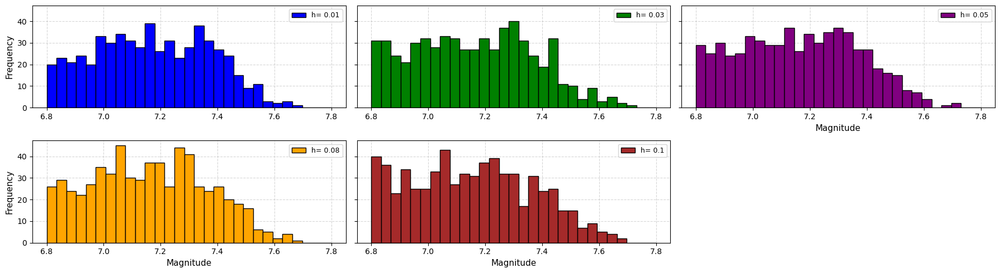

In [41]:
bin_min =6.8
bin_max = 7.8
bin_count = 30
bins = np.linspace(bin_min, bin_max, bin_count)

# Catalogs to plot: (data, label, color)
catalogs666 = [
    (cat_mag_h1,'blue', 'h= 0.01'),
    (cat_mag_h2,'green', 'h= 0.03'),
    (cat_mag_h3,'purple','h= 0.05'),
    (cat_mag_h4,'orange','h= 0.08'),
    (cat_mag_h5,'brown','h= 0.1')
]

# Create 1 row × 3 column subplot
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 5), sharey=True)
axes = axes.flatten()

for ax, (data, color, label) in zip(axes, catalogs666):
    ax.hist(data, bins=bins, edgecolor='black', color=color, label=label)
#     ax.set_title('model1', fontsize=12)
#     ax.set_xlabel('Magnitude', fontsize=11)
    ax.set_axisbelow(True)
#     ax.yaxis.set_major_locator(MultipleLocator(50000))
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(loc='upper right', fontsize=9)

if len(catalogs666) < len(axes):
    for i in range(len(catalogs666), len(axes)):
        fig.delaxes(axes[i])    
# Y label only on the first plot
axes[3].set_xlabel('Magnitude', fontsize=11)
axes[-2].set_xlabel('Magnitude', fontsize=11)
axes[2].set_xlabel('Magnitude', fontsize=11)
axes[0].set_ylabel('Frequency', fontsize=11)
axes[3].set_ylabel('Frequency', fontsize=11)
# axes[0].yaxis.set_major_locator(MultipleLocator(10))
# Final layout
# plt.suptitle('model1', fontsize=15, y=1.05)
plt.tight_layout()
plt.show()

# ................................interevent time............................

In [174]:
####function to read the mat files####
def load_cat_mat_time(file_path, magnitude_threshold=7):
    """
    Loads an earthquake catalog from a .mat file and returns it as a pandas DataFrame.

    Parameters:
        file_path (str): The path to the .mat file.

    Returns:
        df (pd.DataFrame): DataFrame containing the catalog with labeled columns.
    """
    # Load the .mat file
    mat_data = mat.loadmat(file_path)

    # Extract catalog matrix and labels
    catalog = mat_data['TheCatalog']
    labels = [entry[0][0] for entry in mat_data['whatiswhat']]

    # Convert to DataFrame with labeled columns
    df = pd.DataFrame(catalog.T, columns=labels)

    # Filter for big events (magnitude ≥ threshold)
    intrevnt_df = df[df['magnitude'] >= magnitude_threshold].copy()

    # Sort by time and calculate interevent time
    intrevnt_df = intrevnt_df.sort_values(by='time').reset_index(drop=True)
    intrevnt_df['time_difference'] = intrevnt_df['time'].diff()

    return intrevnt_df['time_difference'].dropna().values

In [183]:
cat_time_h1= load_cat_mat_time("C:/Users/saram/MCQsim cat anlyss/eaf_h1.mat",  magnitude_threshold=7)
cat_time_h2= load_cat_mat_time("C:/Users/saram/MCQsim cat anlyss/eaf_h3.mat",  magnitude_threshold=7)
cat_time_h3= load_cat_mat_time("C:/Users/saram/MCQsim cat anlyss/eaf_new_h4.mat",  magnitude_threshold=7)
cat_time_h4= load_cat_mat_time("C:/Users/saram/MCQsim cat anlyss/eaf_new_h2.mat",  magnitude_threshold=7)
cat_time_h5= load_cat_mat_time("C:/Users/saram/MCQsim cat anlyss/eaf_new_h5.mat",  magnitude_threshold=7)

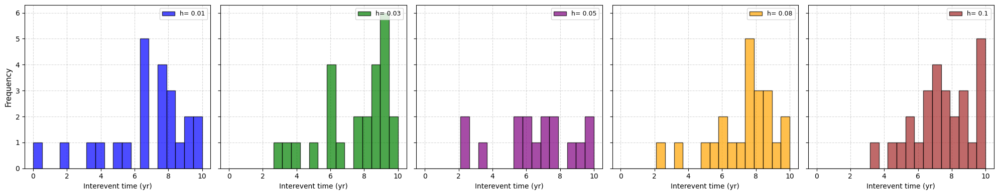

In [184]:
bin_min = 0
bin_max = 10
bin_count = 20
bins = np.linspace(bin_min, bin_max, bin_count)

catalogs113 = [
    (cat_time_h1, 'blue', 'h= 0.01'),
    (cat_time_h2, 'green', 'h= 0.03'),
    (cat_time_h3, 'purple', 'h= 0.05'),
    (cat_time_h4, 'orange', 'h= 0.08'),
    (cat_time_h5, 'brown', 'h= 0.1')
]

# y_formatter = ScalarFormatter(useMathText=True)
# y_formatter.set_powerlimits((4, 4))  # x10^4

# Subplot layout
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20, 4), sharey=True)
axes = axes.flatten()

for ax, (data, color, label) in zip(axes, catalogs113):
    ax.hist(data, bins=bins, edgecolor='black', color=color, alpha=0.7, label=label)
#     ax.set_title(label, fontsize=11)
    ax.set_xlabel('Interevent time (yr)', fontsize=10)
#     ax.yaxis.set_major_formatter(y_formatter)
    ax.set_axisbelow(True)
    ax.legend(loc='upper right', fontsize=9)
    ax.grid(True, linestyle='--', alpha=0.5)

# Y label on the first subplot
axes[0].set_ylabel('Frequency', fontsize=11)

plt.tight_layout()
plt.show()

(array([[2., 3., 0., 0., 0., 0., 0., 0., 0., 0.],
        [5., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [5., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [5., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [5., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 1., 0., 2., 1., 0., 0., 1.],
        [0., 0., 0., 1., 0., 2., 0., 1., 1., 0.],
        [5., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 4., 0., 1., 0., 0.],
        [0., 0., 0., 0., 0., 3., 1., 1., 0., 0.],
        [5., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [4., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]),
 array([-17587.80859375,  18784.30664062,  55156.421875  ,  91528.53710938,
        127900.65234375, 164272.76757812, 200644.8828125 , 237016.99804688,
        273389.11328125, 309761.22851562, 346133.34375   ]),
 <a list of 12 BarContainer objects>)

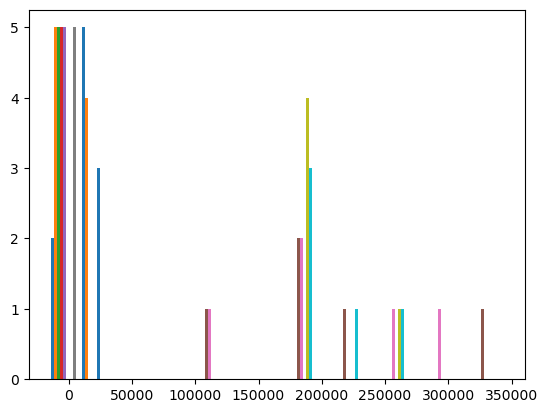

In [169]:

plt.hist(cat_time_h1)


# ######..........................................***for afterslip***...................................................

# ................................FMD............................

In [47]:
cat_mag_v1= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/eaf_new_v3.mat") 
cat_mag_v2= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/eaf_new_v6.mat")
cat_mag_v3= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/eaf_v5.mat")
cat_mag_v4= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/eaf_v4.mat")
cat_mag_v5= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/eaf_v1.mat")

v= 0.3 yrs: Estimated b-value = 0.99, Mc = 3.45
v= 0.3 yrs Gutenberg–Richter relation:
  log10(N) = 9.19 - 0.99 * M
v= 0.6 yrs: Estimated b-value = 0.96, Mc = 3.45
v= 0.6 yrs Gutenberg–Richter relation:
  log10(N) = 9.02 - 0.96 * M
v= 5 yrs: Estimated b-value = 0.90, Mc = 3.45
v= 5 yrs Gutenberg–Richter relation:
  log10(N) = 8.64 - 0.90 * M
v= 15 yrs: Estimated b-value = 0.98, Mc = 4.05
v= 15 yrs Gutenberg–Richter relation:
  log10(N) = 9.13 - 0.98 * M
v= 30 yrs: Estimated b-value = 0.91, Mc = 4.35
v= 30 yrs Gutenberg–Richter relation:
  log10(N) = 8.76 - 0.91 * M


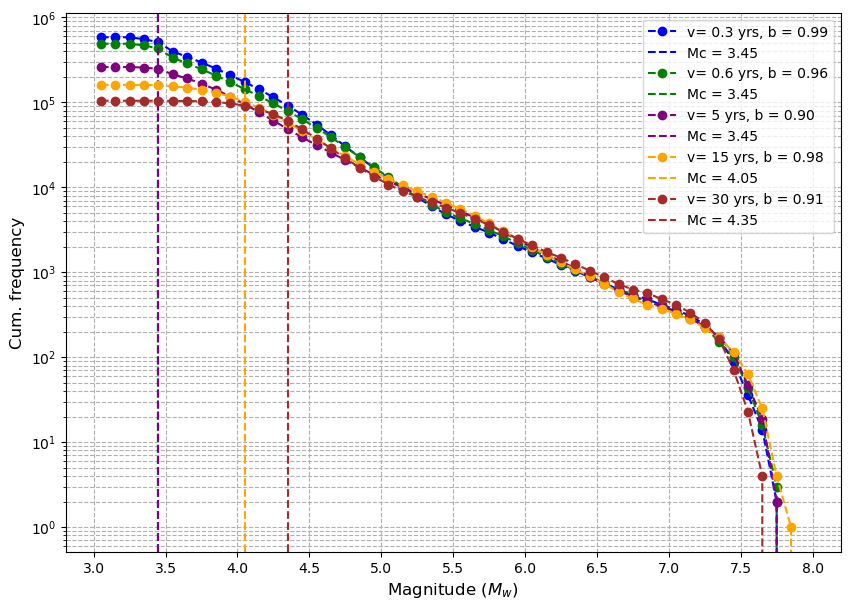

In [50]:
plt.figure(figsize=(10, 7))

# Process each catalog with distinct colors
process_catalog2(cat_mag_v1, color='blue', label='v= 0.3 yrs', bin_width=0.1)
process_catalog2(cat_mag_v2, color='green', label='v= 0.6 yrs', bin_width=0.1)
process_catalog2(cat_mag_v3, color='purple', label='v= 5 yrs', bin_width=0.1)
process_catalog2(cat_mag_v4, color='orange', label='v= 15 yrs', bin_width=0.1)
process_catalog2(cat_mag_v5, color='brown', label='v= 30 yrs', bin_width=0.1) #, show_mc_legend=True)



plt.xlabel("Magnitude ($M_{w}$)", fontsize=12)
plt.ylabel("Cum. frequency", fontsize=12)
plt.xticks(np.arange(3, 8.5, 0.5))  
plt.yscale("log")
plt.grid(True, which="both", linestyle="--")
# plt.title("Cumulative Frequency vs Magnitude for Three Catalogs")
plt.legend(loc="best")
plt.show()

# ................................MvsRA............................

In [51]:
cat_RA_v1= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/eaf_new_v3.mat") 
cat_RA_v2= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/eaf_new_v6.mat")
cat_RA_v3= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/eaf_v5.mat")
cat_RA_v4= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/eaf_v4.mat")
cat_RA_v5= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/eaf_v1.mat")

v= 0.3 fitted relation: log10(A) = -4.86 + 1.19 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.25, std = 0.22
v= 0.6 fitted relation: log10(A) = -4.88 + 1.20 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.23, std = 0.22
v= 5 fitted relation: log10(A) = -4.67 + 1.17 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.11, std = 0.19
v= 15 fitted relation: log10(A) = -4.43 + 1.13 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.04, std = 0.17
v= 30 fitted relation: log10(A) = -4.14 + 1.08 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.18, std = 0.13


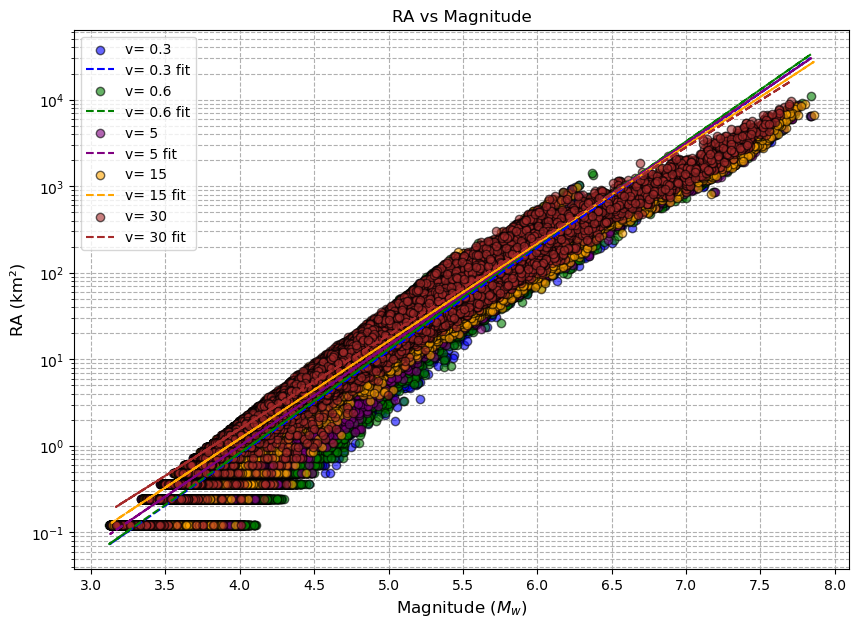

In [52]:
plt.figure(figsize=(10, 7))

RAvsM2(cat_mag_v1, cat_RA_v1, color='blue', label= 'v= 0.3')
RAvsM2(cat_mag_v2, cat_RA_v2, color='green', label= 'v= 0.6')
RAvsM2(cat_mag_v3, cat_RA_v3, color='purple', label='v= 5')
RAvsM2(cat_mag_v4, cat_RA_v4, color='orange', label='v= 15')
RAvsM2(cat_mag_v5, cat_RA_v5, color='brown', label='v= 30')



# mags_sorted = np.sort(cat_mag_sd3)
# RA_thingbaijam = 10**(-3.49 + 0.90 * mags_sorted)
# plt.plot(mags_sorted, RA_thingbaijam, color='red', linestyle='--', 
#          label='Thingbaijam et al. (2017)-SS\n$\\log_{10}(RA) = -3.49 + 0.90M$')


# RA_upper = 10**((-3.49 + 0.90 * mags_sorted) + 0.3)  # +1 std
# RA_lower = 10**((-3.49 + 0.90 * mags_sorted) - 0.3)  # -1 std
# plt.fill_between(mags_sorted, RA_lower, RA_upper, color='red', alpha=0.2, label='±1σ')


# Customize the plot
plt.xlabel('Magnitude ($M_{w}$)', fontsize=12)
plt.ylabel('RA (km²)', fontsize=12)
plt.xticks(np.arange(3, 8.5, 0.5)) 
plt.yscale('log')
plt.grid(True, which='both', linestyle='--')  # Grid behind data
plt.title('RA vs Magnitude')
plt.legend(loc='best')
plt.show()

v= 0.3 fitted relation: log10(A) = -3.27 + 0.91 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.29, std = 0.18
v= 0.6 fitted relation: log10(A) = -3.24 + 0.91 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.31, std = 0.17
v= 5 fitted relation: log10(A) = -3.28 + 0.92 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.33, std = 0.16
v= 15 fitted relation: log10(A) = -3.21 + 0.91 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.34, std = 0.16
v= 30 fitted relation: log10(A) = -3.13 + 0.91 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.42, std = 0.15


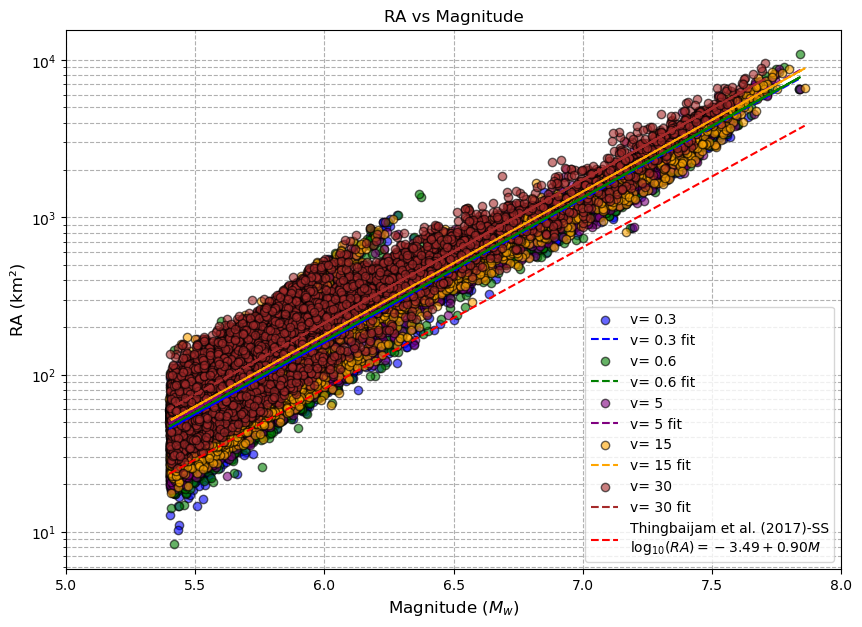

In [55]:
plt.figure(figsize=(10, 7))

RAvsM_fltrd(cat_mag_v1, cat_RA_v1, color='blue', label= 'v= 0.3')
RAvsM_fltrd(cat_mag_v2, cat_RA_v2, color='green', label= 'v= 0.6')
RAvsM_fltrd(cat_mag_v3, cat_RA_v3, color='purple', label='v= 5')
RAvsM_fltrd(cat_mag_v4, cat_RA_v4, color='orange', label='v= 15')
RAvsM_fltrd(cat_mag_v5, cat_RA_v5, color='brown', label='v= 30')


mask = cat_mag_v4 >= 5.4
filtered_mag_v4 = cat_mag_v4[mask]
mags_sorted = np.sort(filtered_mag_v4)

# mags_sorted = np.sort(cat_mag_sd3)
RA_thingbaijam = 10**(-3.49 + 0.90 * mags_sorted)
plt.plot(mags_sorted, RA_thingbaijam, color='red', linestyle='--', 
         label='Thingbaijam et al. (2017)-SS\n$\\log_{10}(RA) = -3.49 + 0.90M$')


# RA_upper = 10**((-3.49 + 0.90 * mags_sorted) + 0.3)  # +1 std
# RA_lower = 10**((-3.49 + 0.90 * mags_sorted) - 0.3)  # -1 std
# plt.fill_between(mags_sorted, RA_lower, RA_upper, color='red', alpha=0.2, label='±1σ')


# Customize the plot
plt.xlabel('Magnitude ($M_{w}$)', fontsize=12)
plt.ylabel('RA (km²)', fontsize=12)
plt.xticks(np.arange(5, 8.5, 0.5)) 
plt.yscale('log')
plt.grid(True, which='both', linestyle='--')  # Grid behind data
plt.title('RA vs Magnitude')
plt.legend(loc='best')
plt.show()

v= 0.3 fitted relation: log10(RA) = -3.27 + 0.91 * M

Residuals vs Thingbaijam et al. (2017) for v= 0.3:
Mean = 0.29, Std = 0.18
v= 0.6 fitted relation: log10(RA) = -3.24 + 0.91 * M

Residuals vs Thingbaijam et al. (2017) for v= 0.6:
Mean = 0.31, Std = 0.17
v= 5 fitted relation: log10(RA) = -3.28 + 0.92 * M

Residuals vs Thingbaijam et al. (2017) for v= 5:
Mean = 0.33, Std = 0.16
v= 15 fitted relation: log10(RA) = -3.21 + 0.91 * M

Residuals vs Thingbaijam et al. (2017) for v= 15:
Mean = 0.34, Std = 0.16
v= 30 fitted relation: log10(RA) = -3.13 + 0.91 * M

Residuals vs Thingbaijam et al. (2017) for v= 30:
Mean = 0.42, Std = 0.15


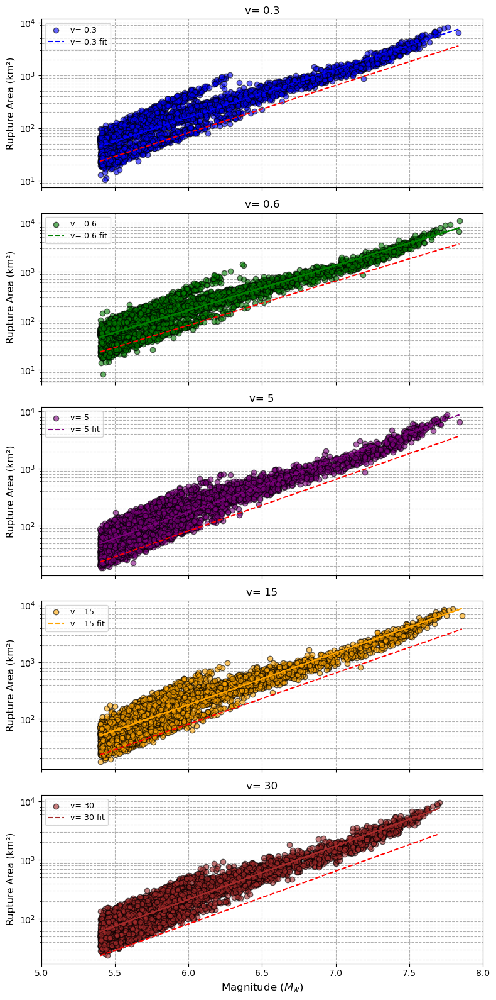

In [57]:
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(8, 16), sharex=True)

catalogs777 = [
    (cat_mag_v1, cat_RA_v1,'blue', 'v= 0.3'),
    (cat_mag_v2, cat_RA_v2,'green', 'v= 0.6'),
    (cat_mag_v3, cat_RA_v3,'purple','v= 5'),
    (cat_mag_v4, cat_RA_v4,'orange','v= 15'),
    (cat_mag_v5, cat_RA_v5,'brown','v= 30')
    
]

for ax, (mags, RAs, color, label) in zip(axes, catalogs777):
    
    mask = mags >= 5.4
    mags = mags[mask]
    RAs = RAs[mask]
    
    RAvsM3(mags, RAs, color=color, label=label, ax=ax)

    mags_sorted = np.sort(mags)
    RA_thingbaijam = 10**(-3.49 + 0.90 * mags_sorted)
    ax.plot(mags_sorted, RA_thingbaijam, color='red', linestyle='--', 
            label='Thingbaijam et al. (2017) – SS\n$\\log_{10}(RA) = -3.49 + 0.90M$')

    ax.set_title(label)

axes[-1].set_xlabel('Magnitude ($M_{w}$)', fontsize=12)
plt.xticks(np.arange(5, 8.5, 0.5))
# plt.suptitle('Rupture Area vs Magnitude for Different Dc Values', fontsize=15, y=0.92)
plt.tight_layout()
plt.show()

# ................................hypo depth............................

In [59]:
cat_hypZ_v1= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/eaf_new_v3.mat") 
cat_hypZ_v2= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/eaf_new_v6.mat")
cat_hypZ_v3= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/eaf_v5.mat")
cat_hypZ_v4= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/eaf_v4.mat")
cat_hypZ_v5= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/eaf_v1.mat")

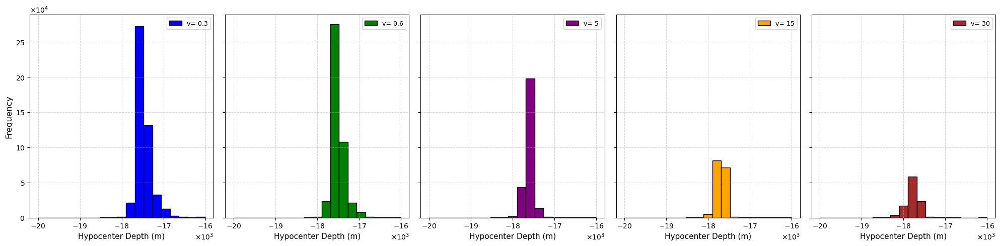

In [63]:
# Histogram bin settings
bin_min = -20000
bin_max = -16000
bin_count = 20
bins = np.linspace(bin_min, bin_max, bin_count)

# Catalogs and labels/colors
catalogs888 = [
    (cat_hypZ_v1,'blue', 'v= 0.3'),
    (cat_hypZ_v2,'green', 'v= 0.6'),
    (cat_hypZ_v3,'purple','v= 5'),
    (cat_hypZ_v4,'orange','v= 15'),
    (cat_hypZ_v5,'brown','v= 30')
]

fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20, 5), sharey=True)
axes = axes.flatten()
# Formatter for scientific notation
x_formatter = ScalarFormatter(useMathText=True)
x_formatter.set_powerlimits((3, 3))  # x10^3

y_formatter = ScalarFormatter(useMathText=True)
y_formatter.set_powerlimits((4, 4))  # x10^4

for ax, (data, color, label) in zip(axes, catalogs888):
    
    ax.hist(data, bins=bins, edgecolor='black', color=color, label=label)

    # Axis formatting
    ax.set_xlabel('Hypocenter Depth (m)', fontsize=11)
#     ax.set_title(label, fontsize=12)
#     ax.xaxis.set_major_formatter(formatter)
#     ax.yaxis.set_major_formatter(formatter)
#     ax.yaxis.set_major_locator(MultipleLocator(40000))
    
#     ax.ticklabel_format(style='sci', axis='x', scilimits=(3, 3))
#     ax.ticklabel_format(style='sci', axis='both', scilimits=(3, 4))
    ax.xaxis.set_major_formatter(x_formatter)
    ax.yaxis.set_major_formatter(y_formatter)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(loc='upper right', fontsize=9)

# Shared y-axis label
axes[0].set_ylabel('Frequency', fontsize=12)

# Layout and title
# plt.suptitle('Hypocenter Depth Histograms by Dc Value', fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

# ................................mean stress drop............................

In [66]:
cat_mDtau_v1= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/eaf_new_v3.mat") 
cat_mDtau_v2= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/eaf_new_v6.mat")
cat_mDtau_v3= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/eaf_v5.mat")
cat_mDtau_v4= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/eaf_v4.mat")
cat_mDtau_v5= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/eaf_v1.mat")

v= 0.3:
  Median = 3.58 MPa
  Mode   = 2.84 MPa
v= 0.6:
  Median = 3.49 MPa
  Mode   = 2.84 MPa
v= 5:
  Median = 3.03 MPa
  Mode   = 2.84 MPa
v= 15:
  Median = 2.81 MPa
  Mode   = 2.84 MPa


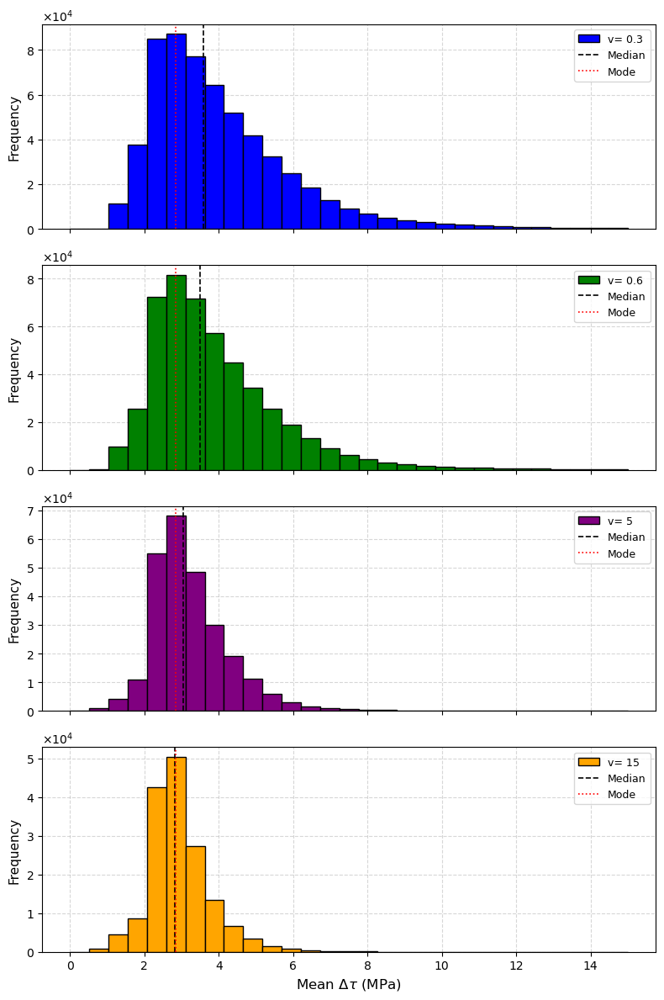

In [67]:
#######subplots of the stress drop#########
from matplotlib.ticker import MultipleLocator, ScalarFormatter

#################
bin_min = 0
bin_max = 15
bin_count = 30
bins = np.linspace(bin_min, bin_max, bin_count)
###################
# Catalogs: (data, label, color)
catalogs999 = [
    (cat_mDtau_v1,'blue', 'v= 0.3'),
    (cat_mDtau_v2,'green', 'v= 0.6'),
    (cat_mDtau_v3,'purple','v= 5'),
    (cat_mDtau_v4,'orange','v= 15')
#     (cat_mDtau_v5,'brown','h= 0.1')
]

# Create 4-row, 1-column subplots
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(8, 12), sharex=True)

# Formatter for scientific y-axis
y_formatter = ScalarFormatter(useMathText=True)
y_formatter.set_powerlimits((4, 4))

for ax, (data, color, label) in zip(axes, catalogs999):
    ax.hist(data, bins=bins, edgecolor='black', color=color, label=label)
    
    median = np.median(data)

    # Calculate mode based on histogram peak bin
    counts, edges = np.histogram(data, bins=bins)
    mode_bin_index = np.argmax(counts)
    mode = (edges[mode_bin_index] + edges[mode_bin_index + 1]) / 2

    
    print(f"{label}:")
    print(f"  Median = {median:.2f} MPa")
    print(f"  Mode   = {mode:.2f} MPa")
    ax.axvline(median, color='black', linestyle='--', linewidth=1.2, label='Median')
    ax.axvline(mode, color='red', linestyle=':', linewidth=1.2, label='Mode')

    ax.set_ylabel('Frequency', fontsize=11)
#     ax.set_title(label, fontsize=12)
    ax.yaxis.set_major_formatter(y_formatter)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_axisbelow(True)
    ax.legend(loc='upper right', fontsize=9)

# Shared x-axis formatting
axes[-1].set_xlabel('Mean $\\Delta\\tau$ (MPa)', fontsize=12)
axes[-1].xaxis.set_major_locator(MultipleLocator(2))

# Layout
# plt.suptitle('Mean $\\Delta\\tau$ Histograms by Dc Value', fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

# ................................magnitude histograms............................

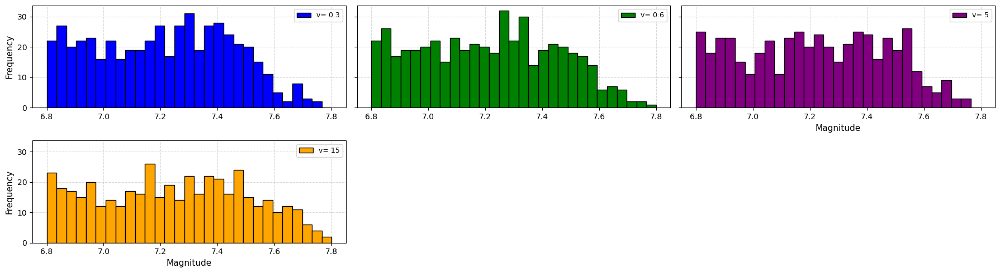

In [69]:
bin_min =6.8
bin_max = 7.8
bin_count = 30
bins = np.linspace(bin_min, bin_max, bin_count)

# Catalogs to plot: (data, label, color)
catalogs110 = [
    (cat_mag_v1,'blue', 'v= 0.3'),
    (cat_mag_v2,'green', 'v= 0.6'),
    (cat_mag_v3,'purple','v= 5'),
    (cat_mag_v4,'orange','v= 15')
#     (cat_mag_v5,'brown','$\mu_d$= 0.50')
]

# Create 1 row × 3 column subplot
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 5), sharey=True)
axes = axes.flatten()

for ax, (data, color, label) in zip(axes, catalogs110):
    ax.hist(data, bins=bins, edgecolor='black', color=color, label=label)
#     ax.set_title('model1', fontsize=12)
#     ax.set_xlabel('Magnitude', fontsize=11)
    ax.set_axisbelow(True)
#     ax.yaxis.set_major_locator(MultipleLocator(50000))
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(loc='upper right', fontsize=9)

if len(catalogs110) < len(axes):
    for i in range(len(catalogs110), len(axes)):
        fig.delaxes(axes[i])    
# Y label only on the first plot
axes[3].set_xlabel('Magnitude', fontsize=11)
axes[-2].set_xlabel('Magnitude', fontsize=11)
axes[2].set_xlabel('Magnitude', fontsize=11)
axes[0].set_ylabel('Frequency', fontsize=11)
axes[3].set_ylabel('Frequency', fontsize=11)
# axes[0].yaxis.set_major_locator(MultipleLocator(10))
# Final layout
# plt.suptitle('model1', fontsize=15, y=1.05)
plt.tight_layout()
plt.show()

# ######..................................***for afterslip (0.54)***...........................................

# ................................FMD............................

In [71]:
cat_mag_v1= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/eaf_new_v2.mat") 
cat_mag_v2= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/eaf_v6p2.mat")
cat_mag_v3= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/eaf_v5p2.mat")
cat_mag_v4= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/eaf_v4p2.mat")
cat_mag_v5= load_cat_mat("C:/Users/saram/MCQsim cat anlyss/eaf_v1.mat")

$t_{m}$= 0.3 yr: Estimated b-value = 0.99, Mc = 3.45
$t_{m}$= 0.3 yr Gutenberg–Richter relation:
  log10(N) = 9.24 - 0.99 * M
$t_{m}$= 0.6 yr: Estimated b-value = 0.95, Mc = 3.45
$t_{m}$= 0.6 yr Gutenberg–Richter relation:
  log10(N) = 9.01 - 0.95 * M
$t_{m}$= 5 yr: Estimated b-value = 0.88, Mc = 3.45
$t_{m}$= 5 yr Gutenberg–Richter relation:
  log10(N) = 8.59 - 0.88 * M
$t_{m}$= 15 yr: Estimated b-value = 0.91, Mc = 4.05
$t_{m}$= 15 yr Gutenberg–Richter relation:
  log10(N) = 8.80 - 0.91 * M
$t_{m}$= 30 yr: Estimated b-value = 0.91, Mc = 4.35
$t_{m}$= 30 yr Gutenberg–Richter relation:
  log10(N) = 8.76 - 0.91 * M


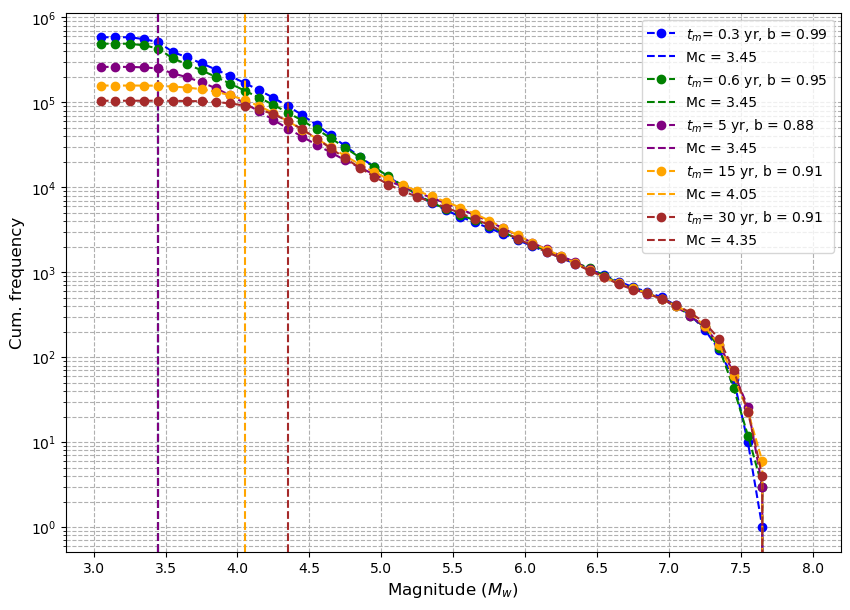

In [89]:
plt.figure(figsize=(10, 7))

# Process each catalog with distinct colors
process_catalog2(cat_mag_v1, color='blue', label='$t_{m}$= 0.3 yr', bin_width=0.1)
process_catalog2(cat_mag_v2, color='green', label='$t_{m}$= 0.6 yr', bin_width=0.1)
process_catalog2(cat_mag_v3, color='purple', label='$t_{m}$= 5 yr', bin_width=0.1)
process_catalog2(cat_mag_v4, color='orange', label='$t_{m}$= 15 yr', bin_width=0.1)
process_catalog2(cat_mag_v5, color='brown', label='$t_{m}$= 30 yr', bin_width=0.1) #, show_mc_legend=True)



plt.xlabel("Magnitude ($M_{w}$)", fontsize=12)
plt.ylabel("Cum. frequency", fontsize=12)
plt.xticks(np.arange(3, 8.5, 0.5))  
plt.yscale("log")
plt.grid(True, which="both", linestyle="--")
# plt.title("Cumulative Frequency vs Magnitude for Three Catalogs")
plt.legend(loc="best")
plt.show()

# ................................MvsRA............................

In [73]:
cat_RA_v1= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/eaf_new_v2.mat") 
cat_RA_v2= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/eaf_v6p2.mat")
cat_RA_v3= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/eaf_v5p2.mat")
cat_RA_v4= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/eaf_v4p2.mat")
cat_RA_v5= load_cat_mat_RA("C:/Users/saram/MCQsim cat anlyss/eaf_v1.mat")

$t_{m}$= 0.3 yr fitted relation: log10(A) = -4.93 + 1.21 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.23, std = 0.22
$t_{m}$= 0.6 yr fitted relation: log10(A) = -4.93 + 1.22 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.22, std = 0.22
$t_{m}$= 5 yr fitted relation: log10(A) = -4.70 + 1.18 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = -0.08, std = 0.19
$t_{m}$= 15 yr fitted relation: log10(A) = -4.42 + 1.13 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.08, std = 0.17
$t_{m}$= 30 yr fitted relation: log10(A) = -4.14 + 1.08 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.18, std = 0.13


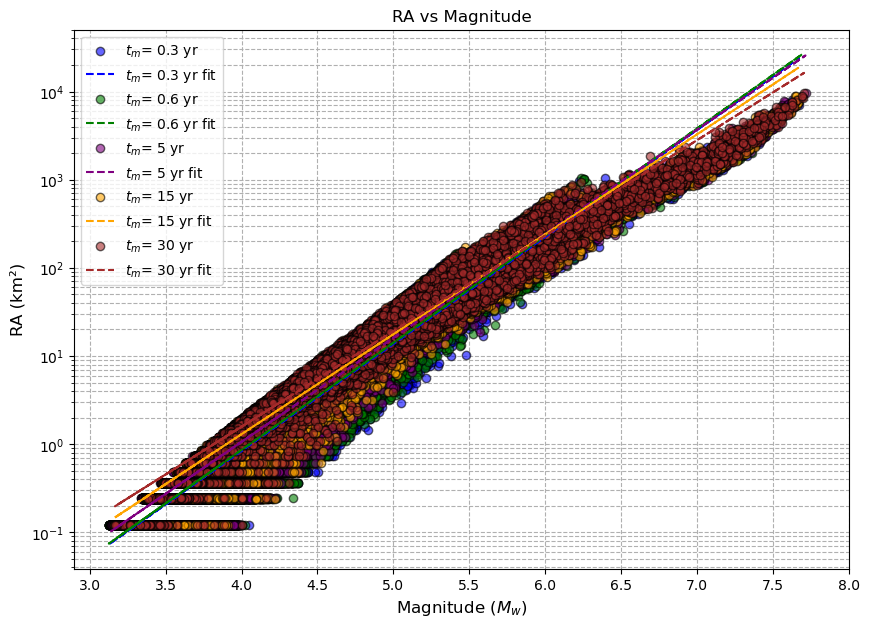

In [97]:
plt.figure(figsize=(10, 7))

RAvsM2(cat_mag_v1, cat_RA_v1, color='blue', label= '$t_{m}$= 0.3 yr')
RAvsM2(cat_mag_v2, cat_RA_v2, color='green', label= '$t_{m}$= 0.6 yr')
RAvsM2(cat_mag_v3, cat_RA_v3, color='purple', label='$t_{m}$= 5 yr')
RAvsM2(cat_mag_v4, cat_RA_v4, color='orange', label='$t_{m}$= 15 yr')
RAvsM2(cat_mag_v5, cat_RA_v5, color='brown', label='$t_{m}$= 30 yr')



# mags_sorted = np.sort(cat_mag_sd3)
# RA_thingbaijam = 10**(-3.49 + 0.90 * mags_sorted)
# plt.plot(mags_sorted, RA_thingbaijam, color='red', linestyle='--', 
#          label='Thingbaijam et al. (2017)-SS\n$\\log_{10}(RA) = -3.49 + 0.90M$')


# RA_upper = 10**((-3.49 + 0.90 * mags_sorted) + 0.3)  # +1 std
# RA_lower = 10**((-3.49 + 0.90 * mags_sorted) - 0.3)  # -1 std
# plt.fill_between(mags_sorted, RA_lower, RA_upper, color='red', alpha=0.2, label='±1σ')


# Customize the plot
plt.xlabel('Magnitude ($M_{w}$)', fontsize=12)
plt.ylabel('RA (km²)', fontsize=12)
plt.xticks(np.arange(3, 8.5, 0.5)) 
plt.yscale('log')
plt.grid(True, which='both', linestyle='--')  # Grid behind data
plt.title('RA vs Magnitude')
plt.legend(loc='best')
plt.show()

$t_{m}$= 0.3 yr fitted relation: log10(A) = -3.17 + 0.90 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.35, std = 0.17
$t_{m}$= 0.6 yr fitted relation: log10(A) = -3.18 + 0.91 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.36, std = 0.16
$t_{m}$= 5 yr fitted relation: log10(A) = -3.26 + 0.92 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.37, std = 0.15
$t_{m}$= 15 yr fitted relation: log10(A) = -3.15 + 0.91 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.39, std = 0.15
$t_{m}$= 30 yr fitted relation: log10(A) = -3.13 + 0.91 * M

Residuals vs Thingbaijam et al. (2017):
Strike-slip    : mean = 0.42, std = 0.15


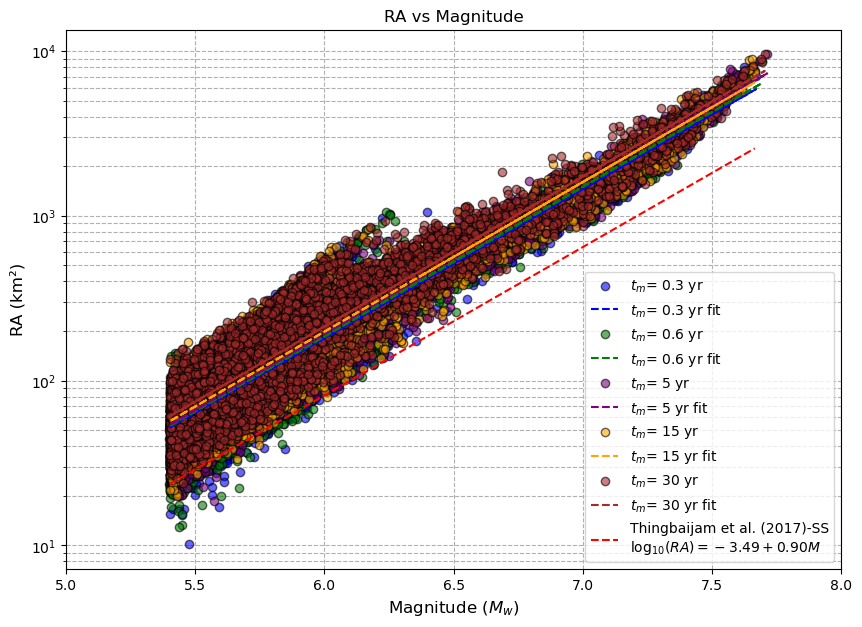

In [91]:
plt.figure(figsize=(10, 7))

RAvsM_fltrd(cat_mag_v1, cat_RA_v1, color='blue', label= '$t_{m}$= 0.3 yr')
RAvsM_fltrd(cat_mag_v2, cat_RA_v2, color='green', label= '$t_{m}$= 0.6 yr')
RAvsM_fltrd(cat_mag_v3, cat_RA_v3, color='purple', label='$t_{m}$= 5 yr')
RAvsM_fltrd(cat_mag_v4, cat_RA_v4, color='orange', label='$t_{m}$= 15 yr')
RAvsM_fltrd(cat_mag_v5, cat_RA_v5, color='brown', label='$t_{m}$= 30 yr')


mask = cat_mag_v4 >= 5.4
filtered_mag_v4 = cat_mag_v4[mask]
mags_sorted = np.sort(filtered_mag_v4)

# mags_sorted = np.sort(cat_mag_sd3)
RA_thingbaijam = 10**(-3.49 + 0.90 * mags_sorted)
plt.plot(mags_sorted, RA_thingbaijam, color='red', linestyle='--', 
         label='Thingbaijam et al. (2017)-SS\n$\\log_{10}(RA) = -3.49 + 0.90M$')


# RA_upper = 10**((-3.49 + 0.90 * mags_sorted) + 0.3)  # +1 std
# RA_lower = 10**((-3.49 + 0.90 * mags_sorted) - 0.3)  # -1 std
# plt.fill_between(mags_sorted, RA_lower, RA_upper, color='red', alpha=0.2, label='±1σ')


# Customize the plot
plt.xlabel('Magnitude ($M_{w}$)', fontsize=12)
plt.ylabel('RA (km²)', fontsize=12)
plt.xticks(np.arange(5, 8.5, 0.5)) 
plt.yscale('log')
plt.grid(True, which='both', linestyle='--')  # Grid behind data
plt.title('RA vs Magnitude')
plt.legend(loc='best')
plt.show()

$t_{m}$= 0.3 yr fitted relation: log10(RA) = -3.17 + 0.90 * M

Residuals vs Thingbaijam et al. (2017) for $t_{m}$= 0.3 yr:
Mean = 0.35, Std = 0.17
$t_{m}$= 0.6 yr fitted relation: log10(RA) = -3.18 + 0.91 * M

Residuals vs Thingbaijam et al. (2017) for $t_{m}$= 0.6 yr:
Mean = 0.36, Std = 0.16
$t_{m}$= 5 yr fitted relation: log10(RA) = -3.26 + 0.92 * M

Residuals vs Thingbaijam et al. (2017) for $t_{m}$= 5 yr:
Mean = 0.37, Std = 0.15
$t_{m}$= 15 yr fitted relation: log10(RA) = -3.15 + 0.91 * M

Residuals vs Thingbaijam et al. (2017) for $t_{m}$= 15 yr:
Mean = 0.39, Std = 0.15
$t_{m}$= 30 yr fitted relation: log10(RA) = -3.13 + 0.91 * M

Residuals vs Thingbaijam et al. (2017) for $t_{m}$= 30 yr:
Mean = 0.42, Std = 0.15


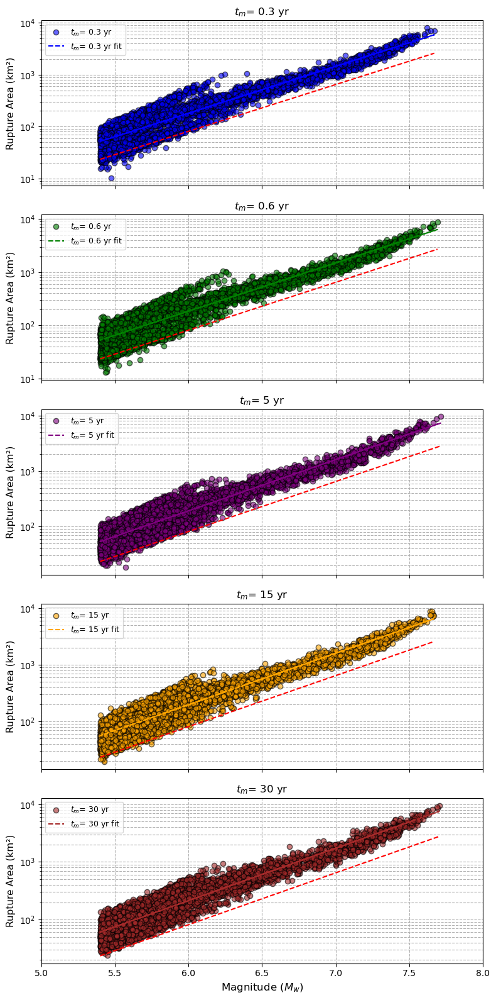

In [92]:
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(8, 16), sharex=True)

catalogs777 = [
    (cat_mag_v1, cat_RA_v1,'blue', '$t_{m}$= 0.3 yr'),
    (cat_mag_v2, cat_RA_v2,'green', '$t_{m}$= 0.6 yr'),
    (cat_mag_v3, cat_RA_v3,'purple','$t_{m}$= 5 yr'),
    (cat_mag_v4, cat_RA_v4,'orange','$t_{m}$= 15 yr'),
    (cat_mag_v5, cat_RA_v5,'brown','$t_{m}$= 30 yr')
    
]

for ax, (mags, RAs, color, label) in zip(axes, catalogs777):
    
    mask = mags >= 5.4
    mags = mags[mask]
    RAs = RAs[mask]
    
    RAvsM3(mags, RAs, color=color, label=label, ax=ax)

    mags_sorted = np.sort(mags)
    RA_thingbaijam = 10**(-3.49 + 0.90 * mags_sorted)
    ax.plot(mags_sorted, RA_thingbaijam, color='red', linestyle='--', 
            label='Thingbaijam et al. (2017) – SS\n$\\log_{10}(RA) = -3.49 + 0.90M$')

    ax.set_title(label)

axes[-1].set_xlabel('Magnitude ($M_{w}$)', fontsize=12)
plt.xticks(np.arange(5, 8.5, 0.5))
# plt.suptitle('Rupture Area vs Magnitude for Different Dc Values', fontsize=15, y=0.92)
plt.tight_layout()
plt.show()

# ................................hypo depth............................

In [77]:
cat_hypZ_v1= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/eaf_new_v2.mat") 
cat_hypZ_v2= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/eaf_v6p2.mat")
cat_hypZ_v3= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/eaf_v5p2.mat")
cat_hypZ_v4= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/eaf_v4p2.mat")
cat_hypZ_v5= load_cat_mat_hypZ("C:/Users/saram/MCQsim cat anlyss/eaf_v1.mat")

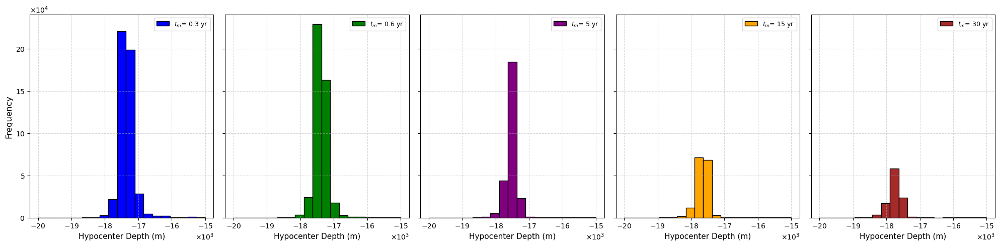

In [101]:
# Histogram bin settings
bin_min = -20000
bin_max = -15000
bin_count = 20
bins = np.linspace(bin_min, bin_max, bin_count)

# Catalogs and labels/colors
catalogs888 = [
    (cat_hypZ_v1,'blue', '$t_{m}$= 0.3 yr'),
    (cat_hypZ_v2,'green', '$t_{m}$= 0.6 yr'),
    (cat_hypZ_v3,'purple','$t_{m}$= 5 yr'),
    (cat_hypZ_v4,'orange','$t_{m}$= 15 yr'),
    (cat_hypZ_v5,'brown','$t_{m}$= 30 yr')
]

fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20, 5), sharey=True)
axes = axes.flatten()
# Formatter for scientific notation
x_formatter = ScalarFormatter(useMathText=True)
x_formatter.set_powerlimits((3, 3))  # x10^3

y_formatter = ScalarFormatter(useMathText=True)
y_formatter.set_powerlimits((4, 4))  # x10^4

for ax, (data, color, label) in zip(axes, catalogs888):
    
    ax.hist(data, bins=bins, edgecolor='black', color=color, label=label)

    # Axis formatting
    ax.set_xlabel('Hypocenter Depth (m)', fontsize=11)
#     ax.set_title(label, fontsize=12)
#     ax.xaxis.set_major_formatter(formatter)
#     ax.yaxis.set_major_formatter(formatter)
#     ax.yaxis.set_major_locator(MultipleLocator(40000))
    
#     ax.ticklabel_format(style='sci', axis='x', scilimits=(3, 3))
#     ax.ticklabel_format(style='sci', axis='both', scilimits=(3, 4))
    ax.xaxis.set_major_formatter(x_formatter)
    ax.yaxis.set_major_formatter(y_formatter)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(loc='upper right', fontsize=9)

# Shared y-axis label
axes[0].set_ylabel('Frequency', fontsize=12)

# Layout and title
# plt.suptitle('Hypocenter Depth Histograms by Dc Value', fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

# ................................mean stress drop............................

In [81]:
cat_mDtau_v1= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/eaf_new_v2.mat") 
cat_mDtau_v2= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/eaf_v6p2.mat")
cat_mDtau_v3= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/eaf_v5p2.mat")
cat_mDtau_v4= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/eaf_v4p2.mat")
cat_mDtau_v5= load_cat_mat_mDtau("C:/Users/saram/MCQsim cat anlyss/eaf_v1.mat")

$t_{m}$= 0.3 yr:
  Median = 3.48 MPa
  Mode   = 2.84 MPa
$t_{m}$= 0.6 yr:
  Median = 3.40 MPa
  Mode   = 2.84 MPa
$t_{m}$= 5 yr:
  Median = 2.88 MPa
  Mode   = 2.84 MPa
$t_{m}$= 15 yr:
  Median = 2.67 MPa
  Mode   = 2.33 MPa
$t_{m}$= 30 yr:
  Median = 2.56 MPa
  Mode   = 2.33 MPa


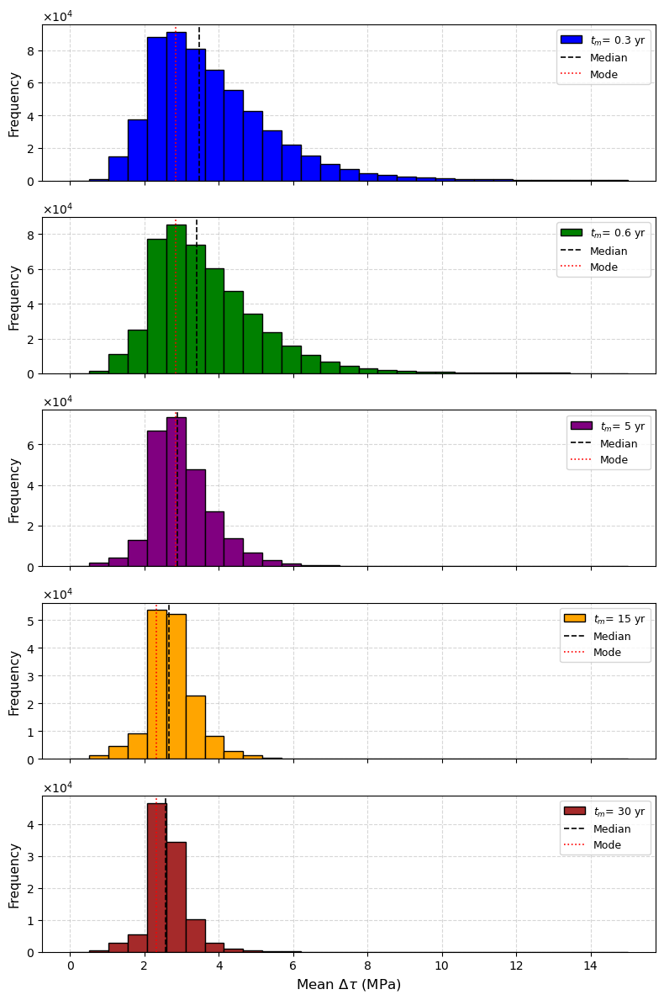

In [94]:
#######subplots of the stress drop#########
from matplotlib.ticker import MultipleLocator, ScalarFormatter

#################
bin_min = 0
bin_max = 15
bin_count = 30
bins = np.linspace(bin_min, bin_max, bin_count)
###################
# Catalogs: (data, label, color)
catalogs999 = [
    (cat_mDtau_v1,'blue', '$t_{m}$= 0.3 yr'),
    (cat_mDtau_v2,'green', '$t_{m}$= 0.6 yr'),
    (cat_mDtau_v3,'purple','$t_{m}$= 5 yr'),
    (cat_mDtau_v4,'orange','$t_{m}$= 15 yr'),
    (cat_mDtau_v5,'brown','$t_{m}$= 30 yr')
]

# Create 4-row, 1-column subplots
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(8, 12), sharex=True)

# Formatter for scientific y-axis
y_formatter = ScalarFormatter(useMathText=True)
y_formatter.set_powerlimits((4, 4))

for ax, (data, color, label) in zip(axes, catalogs999):
    ax.hist(data, bins=bins, edgecolor='black', color=color, label=label)
    
    median = np.median(data)

    # Calculate mode based on histogram peak bin
    counts, edges = np.histogram(data, bins=bins)
    mode_bin_index = np.argmax(counts)
    mode = (edges[mode_bin_index] + edges[mode_bin_index + 1]) / 2

    
    print(f"{label}:")
    print(f"  Median = {median:.2f} MPa")
    print(f"  Mode   = {mode:.2f} MPa")
    ax.axvline(median, color='black', linestyle='--', linewidth=1.2, label='Median')
    ax.axvline(mode, color='red', linestyle=':', linewidth=1.2, label='Mode')

    ax.set_ylabel('Frequency', fontsize=11)
#     ax.set_title(label, fontsize=12)
    ax.yaxis.set_major_formatter(y_formatter)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_axisbelow(True)
    ax.legend(loc='upper right', fontsize=9)

# Shared x-axis formatting
axes[-1].set_xlabel('Mean $\\Delta\\tau$ (MPa)', fontsize=12)
axes[-1].xaxis.set_major_locator(MultipleLocator(2))

# Layout
# plt.suptitle('Mean $\\Delta\\tau$ Histograms by Dc Value', fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

# ................................magnitude histograms............................

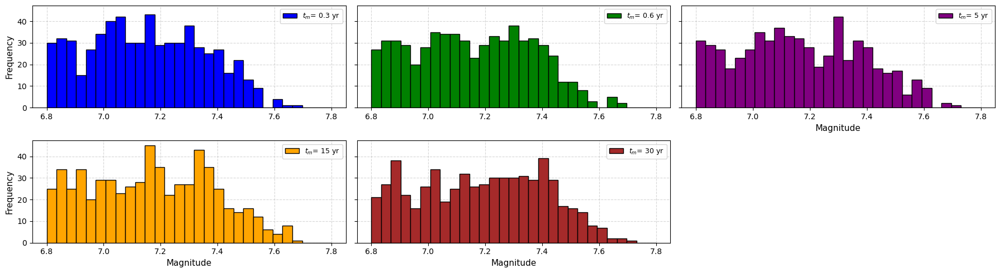

In [95]:
bin_min =6.8
bin_max = 7.8
bin_count = 30
bins = np.linspace(bin_min, bin_max, bin_count)

# Catalogs to plot: (data, label, color)
catalogs112 = [
    (cat_mag_v1,'blue', '$t_{m}$= 0.3 yr'),
    (cat_mag_v2,'green', '$t_{m}$= 0.6 yr'),
    (cat_mag_v3,'purple','$t_{m}$= 5 yr'),
    (cat_mag_v4,'orange','$t_{m}$= 15 yr'),
    (cat_mag_v5,'brown','$t_{m}$= 30 yr')
]

# Create 1 row × 3 column subplot
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 5), sharey=True)
axes = axes.flatten()

for ax, (data, color, label) in zip(axes, catalogs112):
    ax.hist(data, bins=bins, edgecolor='black', color=color, label=label)
#     ax.set_title('model1', fontsize=12)
#     ax.set_xlabel('Magnitude', fontsize=11)
    ax.set_axisbelow(True)
#     ax.yaxis.set_major_locator(MultipleLocator(50000))
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(loc='upper right', fontsize=9)

if len(catalogs112) < len(axes):
    for i in range(len(catalogs112), len(axes)):
        fig.delaxes(axes[i])    
# Y label only on the first plot
axes[3].set_xlabel('Magnitude', fontsize=11)
axes[-2].set_xlabel('Magnitude', fontsize=11)
axes[2].set_xlabel('Magnitude', fontsize=11)
axes[0].set_ylabel('Frequency', fontsize=11)
axes[3].set_ylabel('Frequency', fontsize=11)
# axes[0].yaxis.set_major_locator(MultipleLocator(10))
# Final layout
# plt.suptitle('model1', fontsize=15, y=1.05)
plt.tight_layout()
plt.show()

# ................................interevent time............................

In [185]:
cat_time_v1= load_cat_mat_time("C:/Users/saram/MCQsim cat anlyss/eaf_new_v2.mat", magnitude_threshold=7) 
cat_time_v2= load_cat_mat_time("C:/Users/saram/MCQsim cat anlyss/eaf_v6p2.mat", magnitude_threshold=7)
cat_time_v3= load_cat_mat_time("C:/Users/saram/MCQsim cat anlyss/eaf_v5p2.mat", magnitude_threshold=7)
cat_time_v4= load_cat_mat_time("C:/Users/saram/MCQsim cat anlyss/eaf_v4p2.mat", magnitude_threshold=7)
cat_time_v5= load_cat_mat_time("C:/Users/saram/MCQsim cat anlyss/eaf_v1.mat", magnitude_threshold=7)

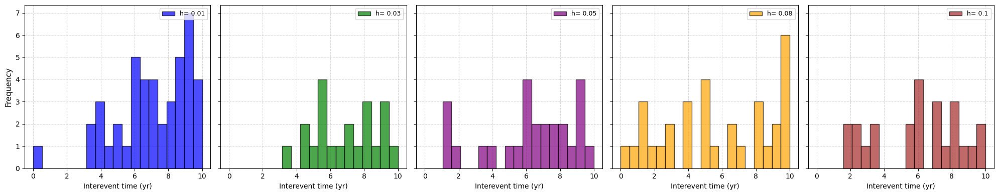

In [187]:
bin_min = 0
bin_max = 10
bin_count = 20
bins = np.linspace(bin_min, bin_max, bin_count)

catalogs114 = [
    (cat_time_v1,'blue', 'h= 0.01'),
    (cat_time_v2,'green', 'h= 0.03'),
    (cat_time_v3,'purple','h= 0.05'),
    (cat_time_v4,'orange','h= 0.08'),
    (cat_time_v5,'brown','h= 0.1')
]

# y_formatter = ScalarFormatter(useMathText=True)
# y_formatter.set_powerlimits((4, 4))  # x10^4

# Subplot layout
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20, 4), sharey=True)
axes = axes.flatten()

for ax, (data, color, label) in zip(axes, catalogs114):
    ax.hist(data, bins=bins, edgecolor='black', color=color, alpha=0.7, label=label)
#     ax.set_title(label, fontsize=11)
    ax.set_xlabel('Interevent time (yr)', fontsize=10)
#     ax.yaxis.set_major_formatter(y_formatter)
    ax.set_axisbelow(True)
    ax.legend(loc='upper right', fontsize=9)
    ax.grid(True, linestyle='--', alpha=0.5)

# Y label on the first subplot
axes[0].set_ylabel('Frequency', fontsize=11)

plt.tight_layout()
plt.show()

# ######..........................................***for Hexp***...................................................

# ................................FMD............................

# ................................MvsRA............................

# ................................hypo depth............................

# ................................mean stress drop............................

# ................................magnitude histograms............................